# Chapter 12
## Forecasting Using Supervised Machine Learning


# Technical Requirements

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path

# import warnings
# warnings.filterwarnings('ignore')



In [3]:
import sktime
import statsmodels as sm
import matplotlib 
import sklearn

print(f'''
sktime ->  {sktime.__version__}
Matplotlib -> {matplotlib.__version__}
pandas -> {pd.__version__}   
numpy -> {np.__version__}
sklearn -> {sklearn.__version__}
statsmodels -> {sm.__version__}
''')


sktime ->  0.39.0
Matplotlib -> 3.10.6
pandas -> 2.3.3   
numpy -> 2.3.3
sklearn -> 1.7.2
statsmodels -> 0.14.5



In [4]:
plt.rcParams["figure.figsize"] = [12, 5]  
plt.style.use('grayscale')

In [5]:
# ###### configurations for image quality#######
# plt.rcParams["figure.figsize"] = [14, 5]   ##
# # plt.rcParams['figure.dpi'] = 300           ## 300 for printing
# plt.rc('font', size=8)                     ## 
# plt.rc('axes', titlesize=16)               ## 
# plt.rc('axes', labelsize=14)               ##
# plt.rc('xtick', labelsize=10)              ##
# plt.rc('ytick', labelsize=10)              ##
# plt.rc('legend', fontsize=10)              ##
# plt.rc('figure', titlesize=12)             ## 
# #############################################

#### Load the datasets

In [6]:
path = Path('../../datasets/Ch12/')
daily_temp = pd.read_csv(path.joinpath('daily_weather.csv'), 
                      index_col='DateTime', 
                      parse_dates=True)
daily_temp.columns = ['y']
energy = pd.read_csv(path.joinpath('energy_consumption.csv'), 
                     index_col='Month', 
                     parse_dates=True)
energy.columns = ['y']

air = pd.read_csv(path.joinpath('air_passenger.csv'), 
                  index_col='date', 
                  parse_dates=True)
air.columns = ['y']

In [7]:
display(daily_temp.tail())
display(energy.tail())
display(air.tail())

,y
DateTime,
2016-12-28,4.887153
2016-12-29,2.676250
2016-12-30,-1.706597
2016-12-31,-2.492500
2017-01-01,-4.820000


,y
Month,
2021-08-01,1755.212
2021-09-01,1456.901
2021-10-01,1315.799
2021-11-01,1644.306
2021-12-01,2032.352


,y
date,
1960-08-31,606
1960-09-30,508
1960-10-31,461
1960-11-30,390
1960-12-31,432


In [7]:
air.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 144 entries, 1949-01-31 to 1960-12-31
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0   y       144 non-null    int64
dtypes: int64(1)
memory usage: 2.2 KB


In [13]:
daily_temp.index.freq = 'D'
energy.index.freq = 'MS'
air.index.freq = 'ME'

In [14]:
print(daily_temp.index.freq)
print(energy.index.freq)
print(air.index.freq)

<Day>
<MonthBegin>
<MonthEnd>


<Axes: title={'center': 'Monthly Passengers'}, xlabel='date'>

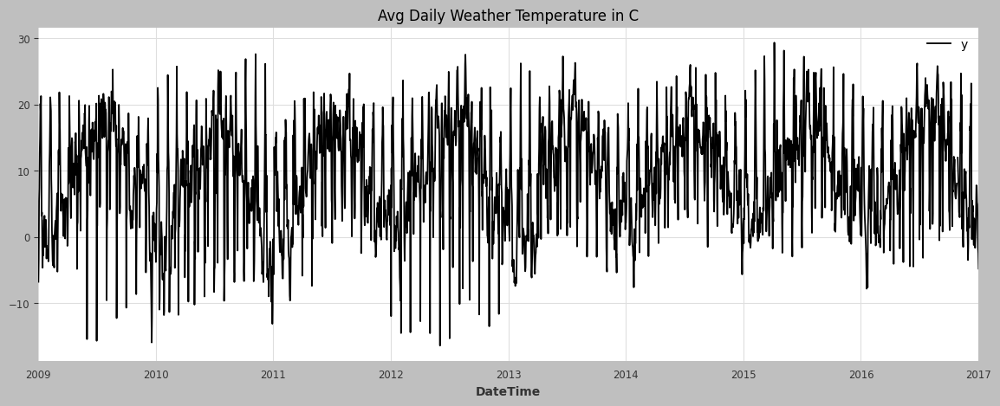

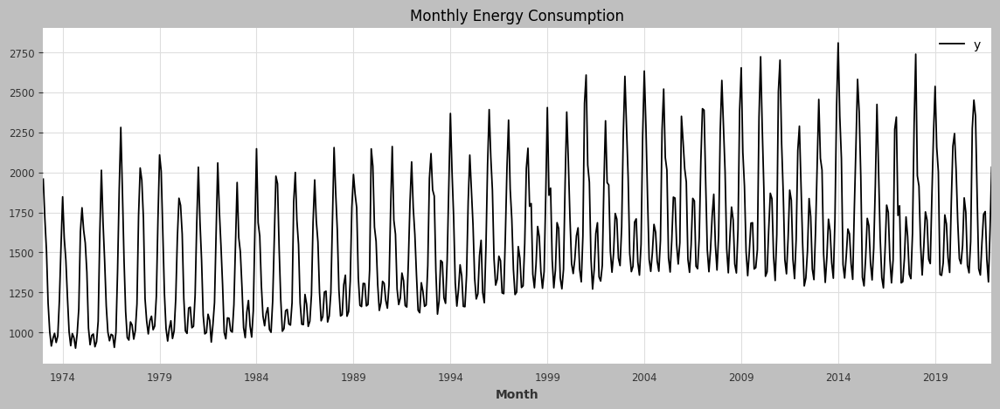

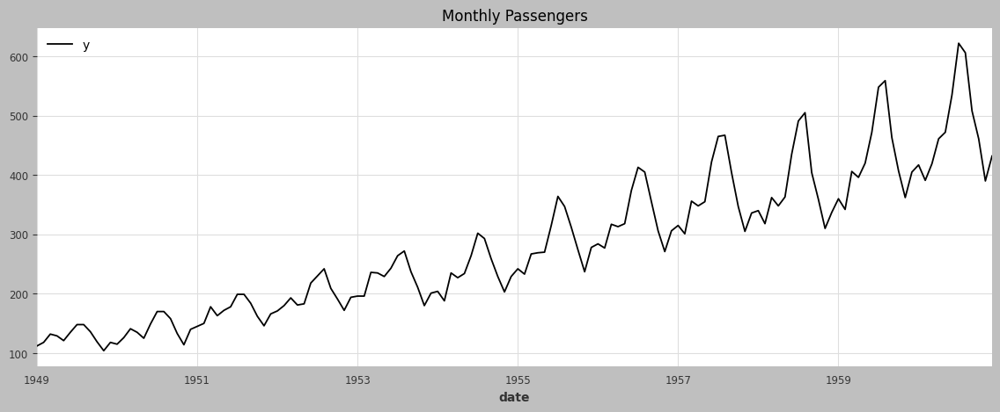

In [15]:
plt.rcParams["figure.figsize"] = [14, 5]  
daily_temp.plot(title='Avg Daily Weather Temperature in C')
energy.plot(title='Monthly Energy Consumption')
air.plot(title='Monthly Passengers')

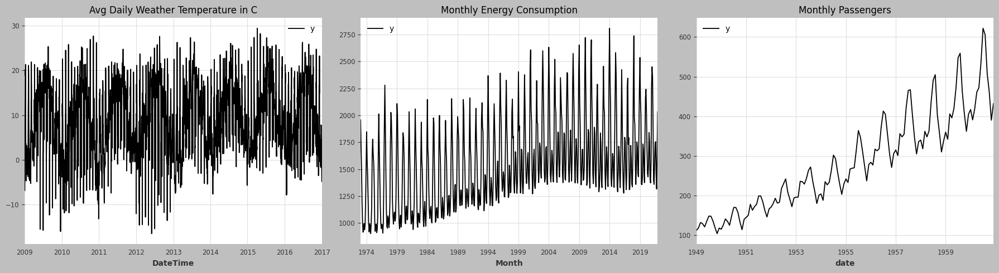

In [16]:
plt.rcParams["figure.figsize"] = [18, 5]  
fig, (ax1, ax2, ax3) = plt.subplots(1, 3)

daily_temp.plot(ax=ax1, title='Avg Daily Weather Temperature in C')
energy.plot(ax=ax2, title='Monthly Energy Consumption')
air.plot(ax=ax3, title='Monthly Passengers')

plt.tight_layout()
plt.show()

# Recipe 1. Preparing Time Series Data for Supervised Learning

In [12]:
air_copy = air.copy()
energy_copy = energy.copy()
daily_temp_copy = daily_temp.copy()

In [13]:
def handle_missing_data(df):
    n = df.isna().sum().values[0]
    if n > 0:
        print(f'found {n} missing observations...')
        df.ffill(inplace=True)

In [14]:
for df in [air_copy, energy_copy, daily_temp_copy]:
    handle_missing_data(df)

found 2 missing observations...


In [15]:
def generate_lagged_features(df, window):
    """Transform time series data into a supervised learning format using sliding windows.
    
    Args:
        df (pd.DataFrame): Univariate time series data
        window (int): Number of time steps to use as features
        
    Returns:
        pd.DataFrame: DataFrame with lagged features (x_1 to x_n) and target (y)
    """
    # Validate input
    if not isinstance(window, int) or window < 1:
        raise ValueError("Window size must be a positive integer")
    
    # Convert DataFrame to 1D array
    d = df.values.squeeze()
    
    # Create sliding windows of past observations
    x = np.lib.stride_tricks.sliding_window_view(d, window_shape=window)[:-1]
    
    # Create target variable (next time step)
    y = d[window:]
    
    # Create column names for lagged features
    cols = [f'x_{i}' for i in range(1, window+1)]

    # Create DataFrames for features and target
    df_xs = pd.DataFrame(x, columns=cols, index=df.index[window:])
    df_y = pd.DataFrame(y, columns=['y'], index=df.index[window:])

    # Combine features and target into a single DataFrame
    return pd.concat([df_xs, df_y], axis=1)

In [16]:
air_os = generate_lagged_features(air_copy, 5)
energy_os = generate_lagged_features(energy_copy, 5)
daily_temp_os = generate_lagged_features(daily_temp_copy, 5)
print(air_os.shape)
print(energy_os.shape)
print(daily_temp_os.shape)

(139, 6)
(583, 6)
(2918, 6)


In [17]:
#before transformation
print(air_copy.head(6))

# after transformation
print(air_os.head())

              y
date           
1949-01-31  112
1949-02-28  118
1949-03-31  132
1949-04-30  129
1949-05-31  121
1949-06-30  135
            x_1  x_2  x_3  x_4  x_5    y
date                                    
1949-06-30  112  118  132  129  121  135
1949-07-31  118  132  129  121  135  148
1949-08-31  132  129  121  135  148  148
1949-09-30  129  121  135  148  148  136
1949-10-31  121  135  148  148  136  119


In [18]:
print(air_copy.shape)
print(air_os.shape)

(144, 1)
(139, 6)


In [19]:
def split_data(df, test_split=0.10):
    """Split time series data into training and test sets.
    
    Args:
        df (pd.DataFrame): Time series data to split
        test_split (float, default=0.10): Proportion of data to use for testing
        
    Returns:
        tuple: (train_df, test_df)
    """
    n = int(len(df) * test_split)
    train, test = df[:-n], df[-n:]
    return train, test

In [20]:
train, test = split_data(air_os)
print(f'Train: {len(train)} Test: {len(test)}')

Train: 126 Test: 13


In [21]:
from sklearn.model_selection import train_test_split

train, test = train_test_split(air_os, test_size=0.10, shuffle=False)

In [22]:
train, test = split_data(air_os)
print(f'Train: {len(train)} Test: {len(test)}')

Train: 126 Test: 13


In [23]:
class Standardize:
    def __init__(self):
        self.mu = None
        self.sigma = None

    def _transform(self, df):
        return (df - self.mu) / self.sigma

    def fit_transform(self, train, test):
        # Calculate mean and std on training data only
        self.mu = train.mean()
        self.sigma = train.std()
        
        # Standardize training and test sets
        train_s = self._transform(train)
        test_s = self._transform(test)
        return train_s, test_s

    def transform(self, df):
        # Apply transformation to any new data
        return self._transform(df)

    def inverse(self, df):
        # Inverse transformation for the whole DataFrame
        return (df * self.sigma) + self.mu

    def inverse_y(self, df):
        # Inverse transformation specifically for the first column (y)
        return (df * self.sigma.iloc[-1]) + self.mu.iloc[-1]


In [24]:
scaler = Standardize()
train_s, test_s = scaler.fit_transform(train, test)
train_s.head()

,x_1,x_2,x_3,x_4,x_5,y
date,,,,,,
1949-06-30,-1.430706,-1.368677,-1.231607,-1.274503,-1.370589,-1.260948
1949-07-31,-1.369917,-1.230502,-1.260433,-1.350705,-1.237345,-1.136689
1949-08-31,-1.228077,-1.260111,-1.337304,-1.217351,-1.113618,-1.136689
1949-09-30,-1.258471,-1.339068,-1.202780,-1.093522,-1.113618,-1.251390
1949-10-31,-1.339523,-1.200892,-1.077865,-1.093522,-1.227828,-1.413882


In [25]:
y_train_original = scaler.inverse_y(train_s['y'])
y_train_original

date
1949-06-30    135.0
1949-07-31    148.0
1949-08-31    148.0
1949-09-30    136.0
1949-10-31    119.0
              ...  
1959-07-31    548.0
1959-08-31    559.0
1959-09-30    463.0
1959-10-31    407.0
1959-11-30    362.0
Freq: ME, Name: y, Length: 126, dtype: float64

In [26]:
train_original = scaler.inverse(train_s)
train_original.head()

,x_1,x_2,x_3,x_4,x_5,y
date,,,,,,
1949-06-30,112.0,118.0,132.0,129.0,121.0,135.0
1949-07-31,118.0,132.0,129.0,121.0,135.0,148.0
1949-08-31,132.0,129.0,121.0,135.0,148.0,148.0
1949-09-30,129.0,121.0,135.0,148.0,148.0,136.0
1949-10-31,121.0,135.0,148.0,148.0,136.0,119.0


## There is more

In [27]:
df = daily_temp.copy()
# adding lagged features
df_lf = generate_lagged_features(df, window=5)

# adding additional date related features
df_lf['day_of_week'] = df_lf.index.dayofweek
df_lf['days_in_month'] = df_lf.index.days_in_month
df_lf['month_end'] = df_lf.index.is_month_end.astype(int)
df_lf['is_leap'] = df_lf.index.is_leap_year.astype(int)
df_lf['month'] = df_lf.index.month
df_lf.head()


,x_1,x_2,x_3,x_4,x_5,y,day_of_week,days_in_month,month_end,is_leap,month
DateTime,,,,,,,,,,,
2009-01-06,-6.810629,-3.360486,5.435694,7.283889,12.690069,15.201597,1,31,0,0,1
2009-01-07,-3.360486,5.435694,7.283889,12.690069,15.201597,20.121875,2,31,0,0,1
2009-01-08,5.435694,7.283889,12.690069,15.201597,20.121875,18.864792,3,31,0,0,1
2009-01-09,7.283889,12.690069,15.201597,20.121875,18.864792,21.289722,4,31,0,0,1
2009-01-10,12.690069,15.201597,20.121875,18.864792,21.289722,11.937847,5,31,0,0,1


In [28]:
# Add rolling statistics as features
df_lf['rolling_mean'] = df_lf['y'].rolling(window=7).mean()  # Weekly average
df_lf['rolling_std'] = df_lf['y'].rolling(window=7).std()  # Volatility measure
df_lf['rolling_min'] = df_lf['y'].rolling(window=7).min()  # Recent lows
df_lf['rolling_max'] = df_lf['y'].rolling(window=7).max()  # Recent highs

In [29]:
# Better encoding of cyclical features
df_lf['month_sin'] = np.sin(2 * np.pi * df_lf.index.month/12)
df_lf['month_cos'] = np.cos(2 * np.pi * df_lf.index.month/12)

# Recipe 2. One-Step Forecasting using Linear Regression Models with Scikit-Learn

## How to do it..

In [30]:
from sklearn.linear_model import (LinearRegression, 
                                 ElasticNet, 
                                 Ridge, 
                                 Lasso, 
                                 HuberRegressor)
from sklearn.ensemble import (RandomForestRegressor,
                             GradientBoostingRegressor,
                             ExtraTreesRegressor)
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor

In [31]:
air_cp = air.copy()
en_cp = energy.copy()
dw_cp = daily_temp.copy()

### Preprocessing Time Series Data

In [32]:
for df in [air_cp, en_cp, dw_cp]:
    handle_missing_data(df)

found 2 missing observations...


In [33]:
air_ml = generate_lagged_features(air_cp, 10)
en_ml = generate_lagged_features(en_cp, 10)
dw_ml = generate_lagged_features(dw_cp, 10)

In [34]:
print(air_ml.shape)
print(en_ml.shape)
print(dw_ml.shape)

(134, 11)
(578, 11)
(2913, 11)


In [35]:
from sktime.performance_metrics.forecasting import(
                                MeanAbsolutePercentageError, 
                                MeanSquaredError,
                                MeanAbsoluteScaledError,
                                MeanAbsoluteError,
                                mean_absolute_scaled_error as mase)
mae = MeanAbsoluteError()
mse = MeanSquaredError()
mape = MeanAbsolutePercentageError()
# mase = MeanAbsoluteScaledError()

In [36]:
def preprocess(df, split):
    train, test = split_data(df, test_split=split)
    scale = Standardize()
    train_s, test_s = scale.fit_transform(train,test)
    return train_s, test_s, scale

In [37]:
air_ml.head()

,x_1,x_2,x_3,x_4,x_5,x_6,x_7,x_8,x_9,x_10,y
date,,,,,,,,,,,
1949-11-30,112,118,132,129,121,135,148,148,136,119,104
1949-12-31,118,132,129,121,135,148,148,136,119,104,118
1950-01-31,132,129,121,135,148,148,136,119,104,118,115
1950-02-28,129,121,135,148,148,136,119,104,118,115,126
1950-03-31,121,135,148,148,136,119,104,118,115,126,141


In [38]:
train_air, test_air, scale_air = preprocess(air_ml, split=0.10)
train_en, test_en, scale_en = preprocess(en_ml, split=0.10)
train_dw, test_dw, scale_dw = preprocess(dw_ml, split=0.10)

In [39]:
display(train_air.head())
display(test_air.head())

,x_1,x_2,x_3,x_4,x_5,x_6,x_7,x_8,x_9,x_10,y
date,,,,,,,,,,,
1949-11-30,-1.417802,-1.380803,-1.254051,-1.304857,-1.406582,-1.274809,-1.142494,-1.141814,-1.271630,-1.456215,-1.629381
1949-12-31,-1.354719,-1.232956,-1.285631,-1.388829,-1.260410,-1.140749,-1.142494,-1.258494,-1.435360,-1.600611,-1.493826
1950-01-31,-1.207526,-1.264638,-1.369843,-1.241878,-1.124679,-1.140749,-1.262722,-1.423792,-1.579827,-1.465841,-1.522874
1950-02-28,-1.239067,-1.349122,-1.222472,-1.105425,-1.124679,-1.264497,-1.433044,-1.569642,-1.444991,-1.494720,-1.416366
1950-03-31,-1.323178,-1.201275,-1.085627,-1.105425,-1.249970,-1.439807,-1.583329,-1.433515,-1.473885,-1.388830,-1.271128


,x_1,x_2,x_3,x_4,x_5,x_6,x_7,x_8,x_9,x_10,y
date,,,,,,,,,,,
1959-12-31,1.000377,1.660612,1.524958,1.749612,2.258160,2.984186,2.975303,1.921050,1.338412,0.883005,1.285052
1960-01-31,1.673262,1.555007,1.777595,2.295428,3.051665,3.097621,2.013482,1.376541,0.905010,1.296941,1.401242
1960-02-29,1.568124,1.808458,2.324976,3.093159,3.166515,2.107637,1.452420,0.938989,1.319149,1.412458,1.149497
1960-03-31,1.820455,2.357603,3.124993,3.208620,2.164192,1.530146,1.001566,1.357094,1.434723,1.162171,1.420607
1960-04-30,2.367174,3.160198,3.240785,2.200960,1.579504,1.066091,1.432382,1.473775,1.184313,1.431711,1.827272


### Train

In [40]:
def train_model(train, test, regressor, reg_name, sc):
    X_train, y_train  = train.drop(columns=['y']), train['y']
    X_test, y_test  = test.drop(columns=['y']), test['y']
    print(f'training {reg_name} ...')

    regressor.fit(X_train, y_train) 
    
    yhat = regressor.predict(X_test)
    actual = y_test.values
    yhat = sc.inverse_y(yhat)
    actual = sc.inverse_y(actual)

    rmse_test = np.sqrt(mse(actual, yhat))
    mae_test = mae(actual, yhat)
    mape_test = mape(actual, yhat)
    mase_test = mase(actual,yhat, y_train=sc.inverse_y(y_train))
    print(mase_test)
    residuals = actual - yhat
    
    model_metadata = {
        'Model Name': reg_name, 
        'Model': regressor, 
        'RMSE': rmse_test, 
        'MAPE': mape_test,
        'MASE': mase_test,
        'MAE': mae_test,
        'yhat': pd.Series(yhat, index=y_test.index), 
        'resid': residuals,
        'actual': sc.inverse_y(y_test)}
    return model_metadata


def train_different_models(train, test, regressors, sc):
    results = []
    for reg_name, regressor in regressors.items():
        reg = regressor()
        results.append(train_model(train,
                                   test,
                                   reg,
                                   reg_name, sc))
    return results


In [41]:
regressors = { 
    'Linear Regression': LinearRegression,
    'Elastic Net': lambda: ElasticNet(alpha=0.5),
    'Ridge Regression': lambda: Ridge(alpha=0.5),
    'Lasso Regression': lambda: Lasso(alpha=0.5),
    'Huber Regression': HuberRegressor,
    'Random Forest Regression': lambda: RandomForestRegressor(n_estimators=100),
    'Gradient Boosting Regression': lambda: GradientBoostingRegressor(n_estimators=100),
    'Extra Tree Regression': lambda: ExtraTreesRegressor(n_estimators=100),
    'Support Vector Regression (RBF)': lambda: SVR(kernel='rbf'),
    'Support Vector Regression (linear)': lambda: SVR(kernel='linear'),
    'K-Nearest Neighbor Regression': lambda: KNeighborsRegressor(n_neighbors=5)
}

In [42]:
air_results = train_different_models(train_air, 
                                     test_air, 
                                     regressors, 
                                     scale_air)

training Linear Regression ...
1.4110717151495815
training Elastic Net ...
2.808737340461765
training Ridge Regression ...
1.3908067071978103
training Lasso Regression ...
4.439302258439553
training Huber Regression ...
1.47302442245999
training Random Forest Regression ...
2.0879938665985183
training Gradient Boosting Regression ...
1.7675525485678838
training Extra Tree Regression ...
1.9050651673907497
training Support Vector Regression (RBF) ...
2.9515866456912105
training Support Vector Regression (linear) ...
1.4481044950016662
training K-Nearest Neighbor Regression ...
2.9765397393304367


In [43]:
en_results = train_different_models(train_en, 
                                    test_en, 
                                    regressors, 
                                    scale_en)

training Linear Regression ...
0.5609894729893562
training Elastic Net ...
1.013425499560542
training Ridge Regression ...
0.5604502891668799
training Lasso Regression ...
1.1080920284151956
training Huber Regression ...
0.5243995471723867
training Random Forest Regression ...
0.4110773327682731
training Gradient Boosting Regression ...
0.47439915019637047
training Extra Tree Regression ...
0.3216751086838462
training Support Vector Regression (RBF) ...
0.35983875099638357
training Support Vector Regression (linear) ...
0.5232082815152149
training K-Nearest Neighbor Regression ...
0.33401502693281043


In [44]:
dw_results = train_different_models(train_dw, 
                                    test_dw, 
                                    regressors, 
                                    scale_dw)

training Linear Regression ...
0.9900574218606734
training Elastic Net ...
1.3007921418286532
training Ridge Regression ...
0.9900849570719737
training Lasso Regression ...
1.468567099199677
training Huber Regression ...
0.9695412119434493
training Random Forest Regression ...
0.929047342089054
training Gradient Boosting Regression ...
0.9531193292142406
training Extra Tree Regression ...
0.9266606793594306
training Support Vector Regression (RBF) ...
0.8916063400411125
training Support Vector Regression (linear) ...
0.9685181343861768
training K-Nearest Neighbor Regression ...
1.0007644164364358


In [45]:
dw_results[0].keys()

dict_keys(['Model Name', 'Model', 'RMSE', 'MAPE', 'MASE', 'MAE', 'yhat', 'resid', 'actual'])

### Evaluate

In [46]:
def evaluate_results(results, by='MASE'):
    cols = ['Model Name', 'RMSE','MAPE', 'MASE']
    df_sorted = results[cols].sort_values(by).reset_index(drop=True)
    return df_sorted
    
    

<Axes: xlabel='date'>

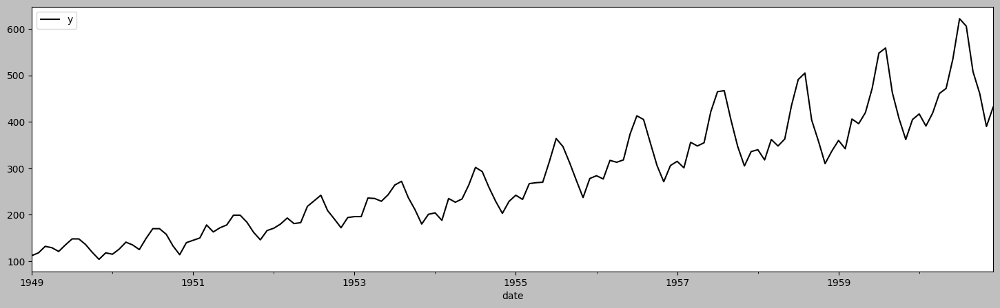

In [47]:
air.plot()

In [48]:
air_results_df = pd.DataFrame(air_results)
air_results_sorted = evaluate_results(air_results_df)
print(air_results_sorted.head(3))

                           Model Name       RMSE      MAPE      MASE
0                    Ridge Regression  39.358884  0.076121  1.390807
1                   Linear Regression  39.820148  0.077452  1.411072
2  Support Vector Regression (linear)  43.608249  0.079431  1.448104


<Axes: xlabel='Month'>

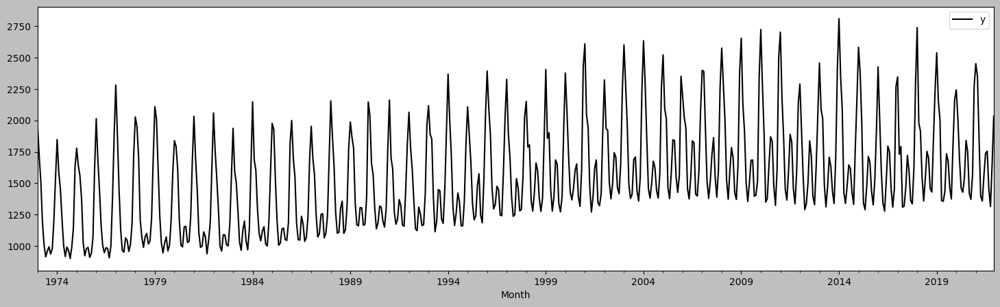

In [49]:
energy.plot()

In [50]:
en_results_df = pd.DataFrame(en_results)
en_results_sorted = evaluate_results(en_results_df)
print(en_results_sorted.head(3))

                        Model Name        RMSE      MAPE      MASE
0            Extra Tree Regression  102.595562  0.040710  0.321675
1    K-Nearest Neighbor Regression  109.006412  0.041790  0.334015
2  Support Vector Regression (RBF)  107.643507  0.045597  0.359839


<Axes: xlabel='DateTime'>

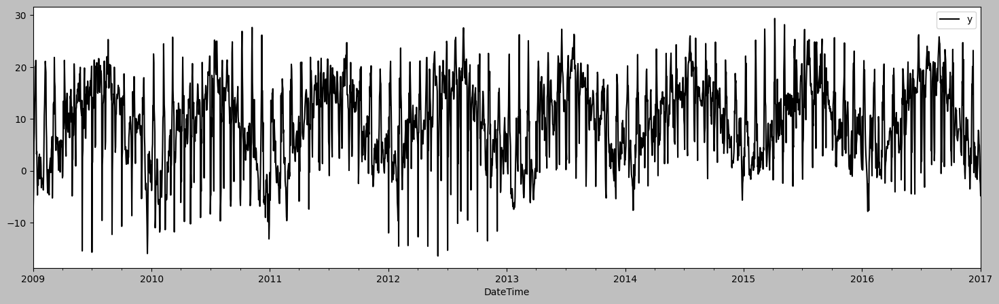

In [51]:
daily_temp.plot()

In [52]:
dw_results_df = pd.DataFrame(dw_results)
dw_results_sorted = evaluate_results(dw_results_df)
print(dw_results_sorted.head(3))

                        Model Name      RMSE      MAPE      MASE
0  Support Vector Regression (RBF)  4.654812  1.908226  0.891606
1            Extra Tree Regression  4.684577  1.852348  0.926661
2         Random Forest Regression  4.767740  1.625647  0.929047


#### Air Passengers Plots

In [53]:
from statsmodels.graphics.tsaplots import plot_acf

def plot_results(results, data_name):
    cols = ['yhat', 'resid', 'actual', 'Model Name']
    for row in results[cols].iterrows():
        yhat, resid, actual, name = row[1]
        plt.title(f'{data_name} - {name}')
        plt.plot(actual, 'k--', alpha=0.5)
        plt.plot(yhat, 'k')
        plt.legend(['actual', 'forecast'])
        plot_acf(resid, zero=False, 
                 title=f'{data_name} - {name} Residual ACF Plot')
        plt.show()


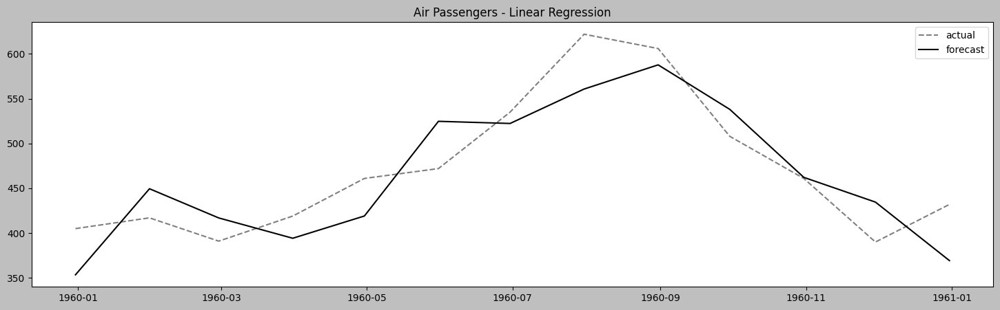

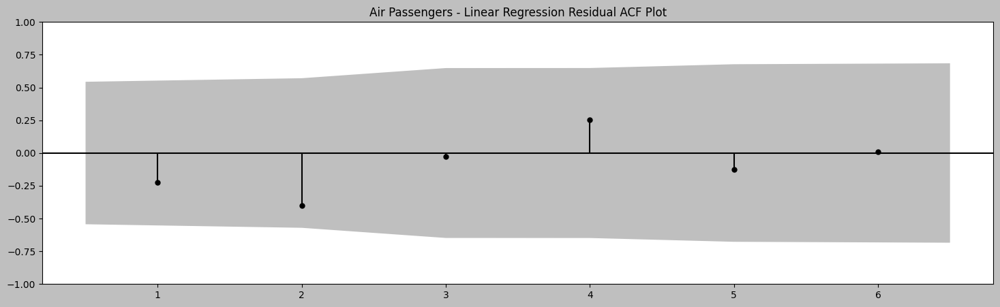

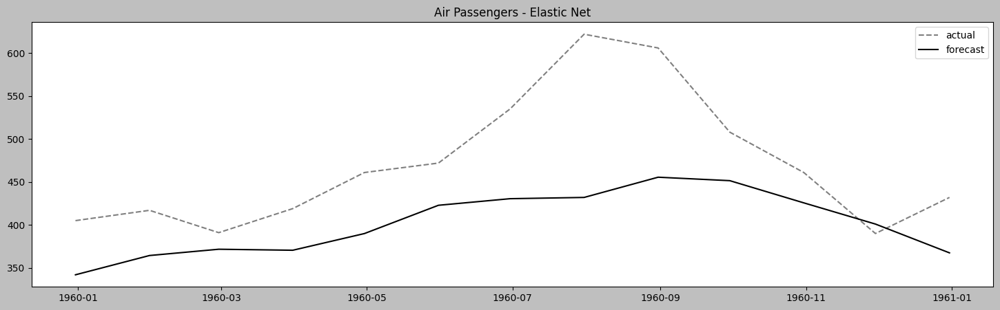

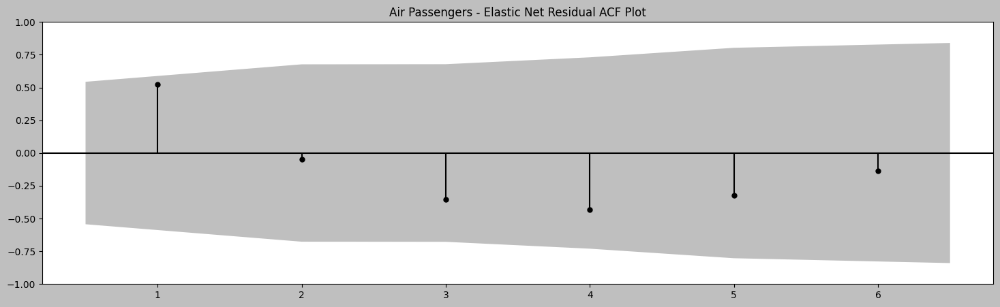

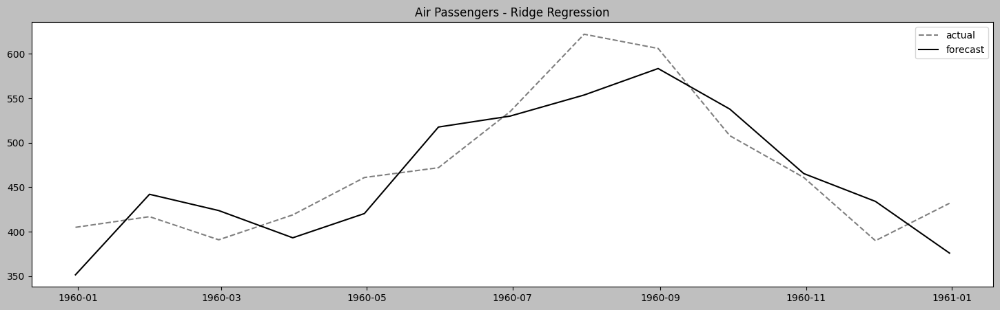

...

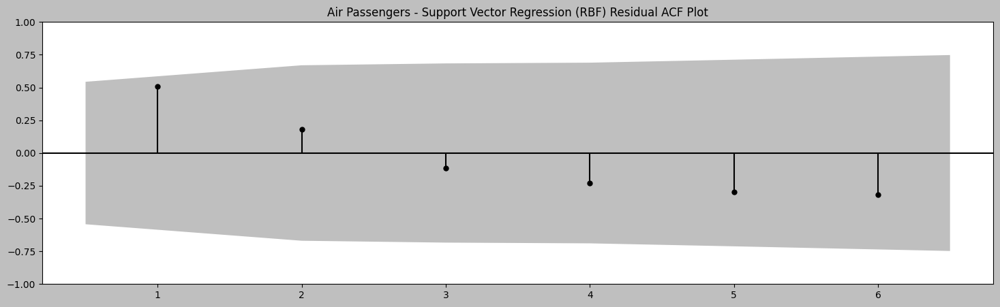

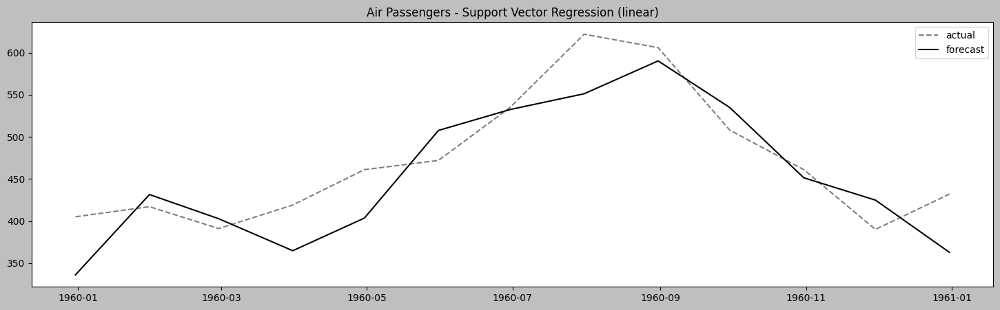

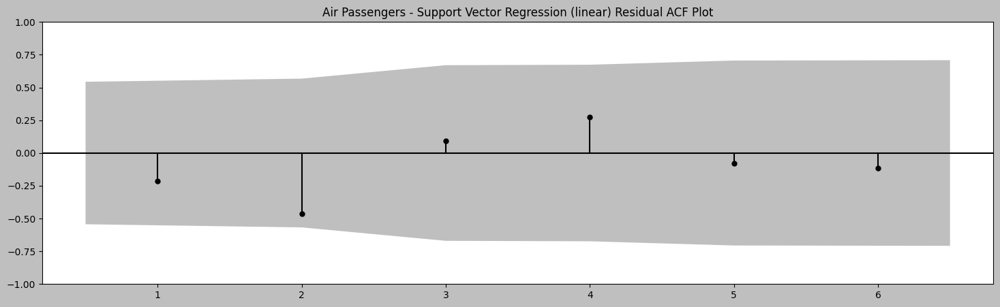

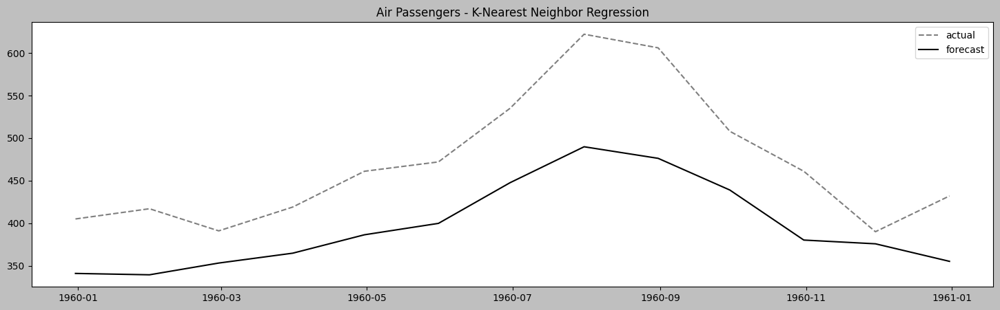

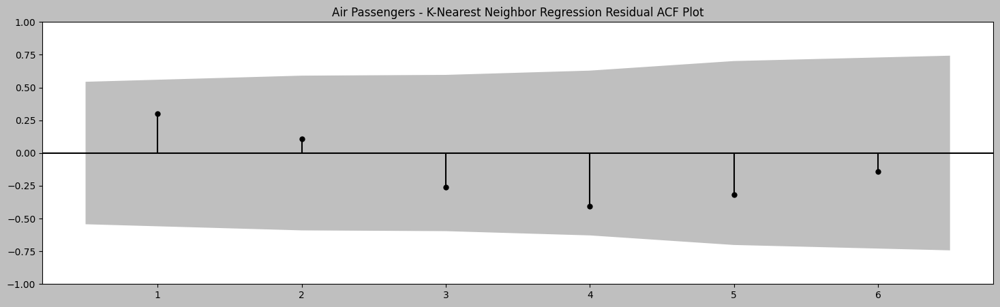

In [54]:
plot_results(air_results_df, 'Air Passengers')

#### Energy Consumption Plots

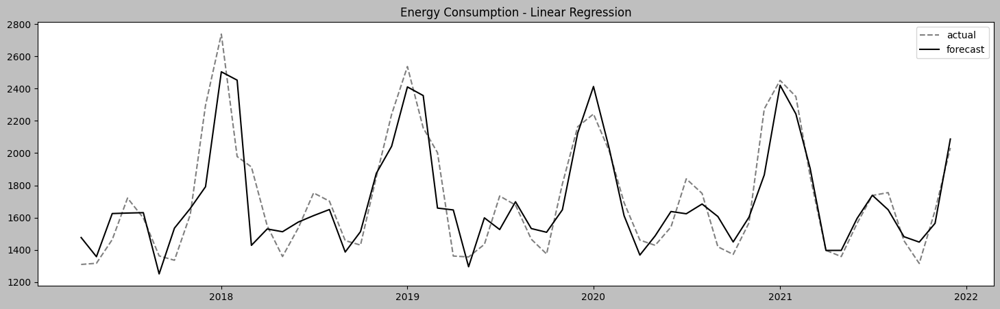

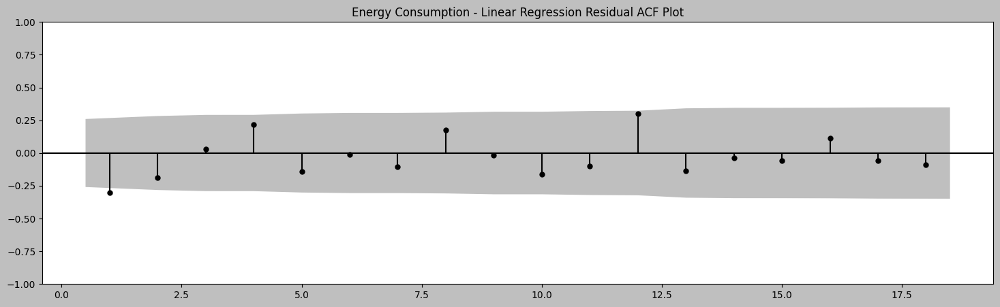

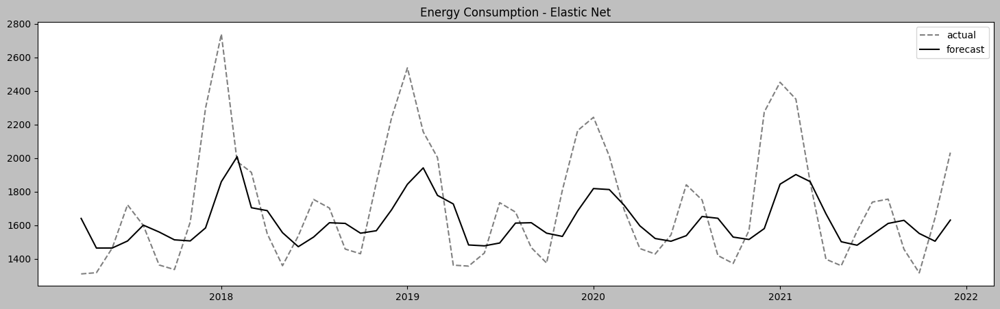

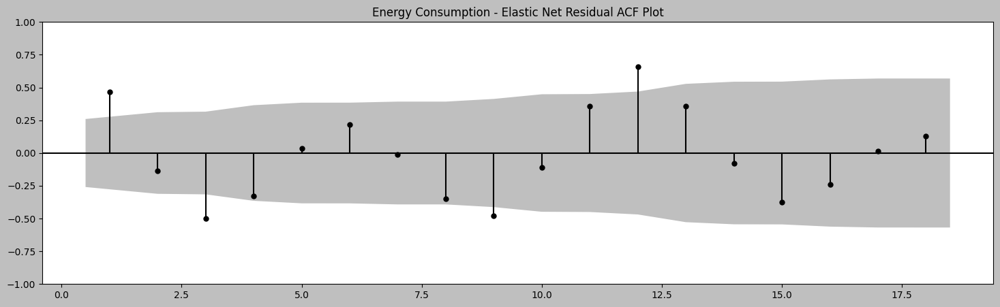

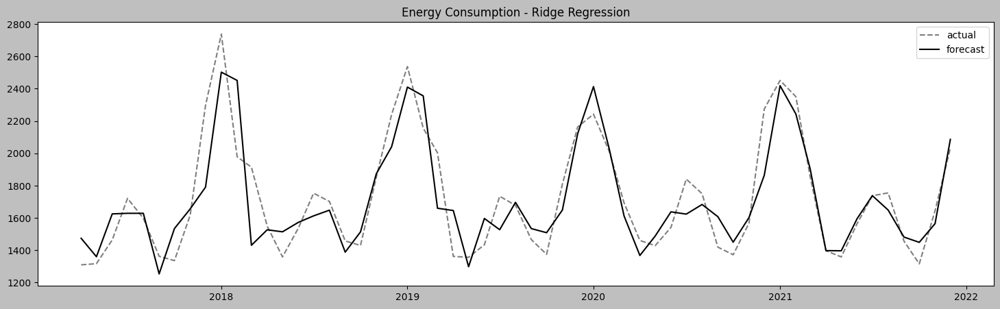

...

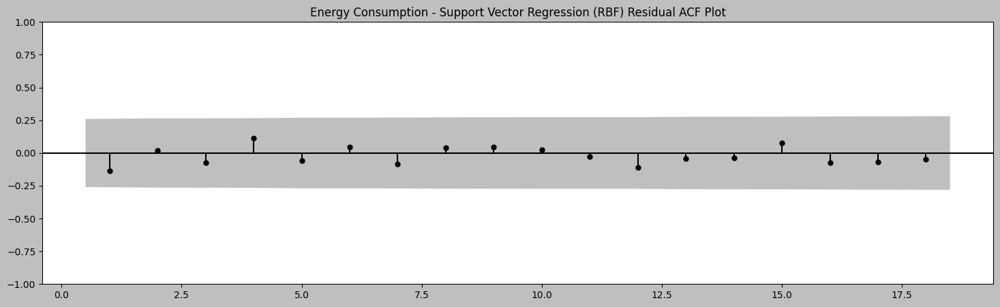

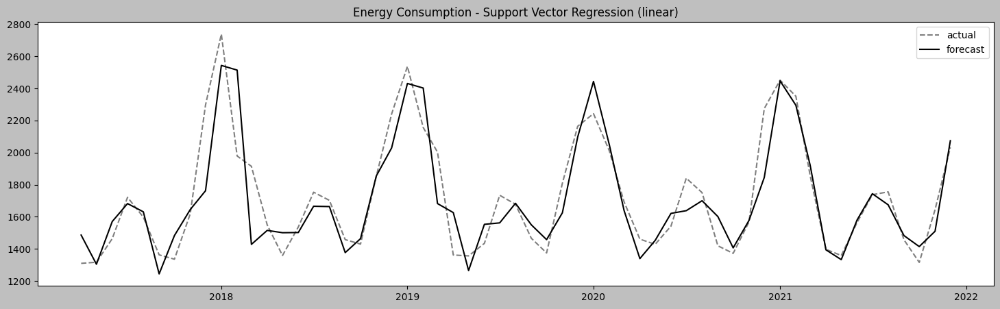

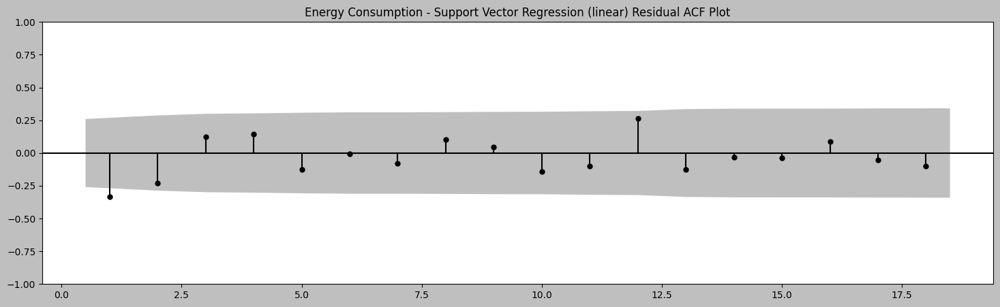

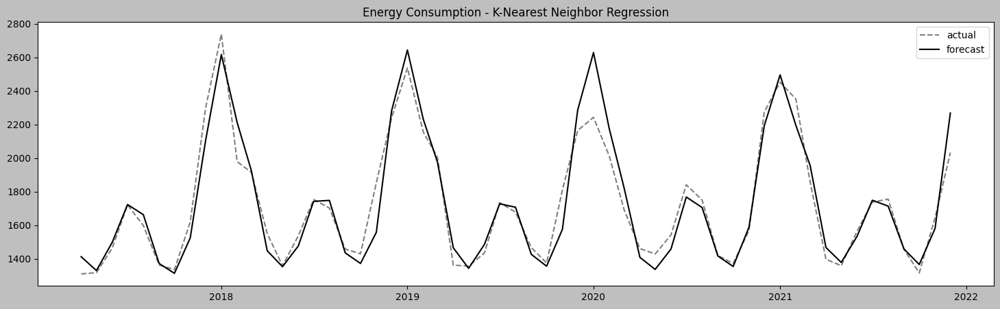

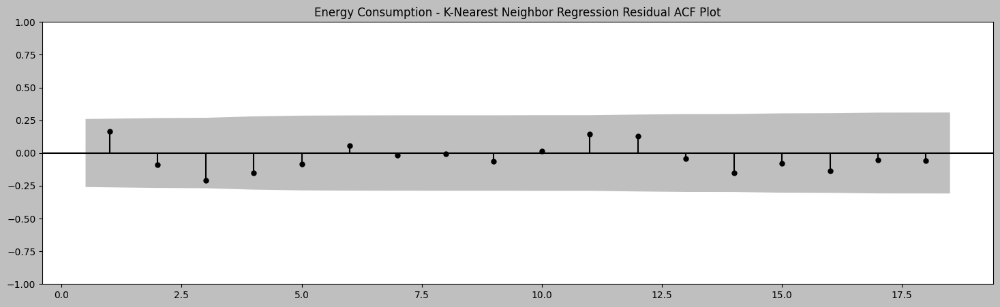

In [55]:
plot_results(en_results_df, 'Energy Consumption')

#### Daily Temperature Plots

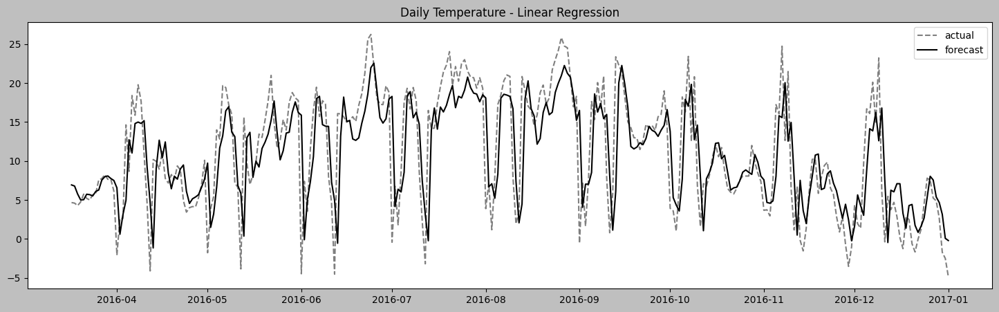

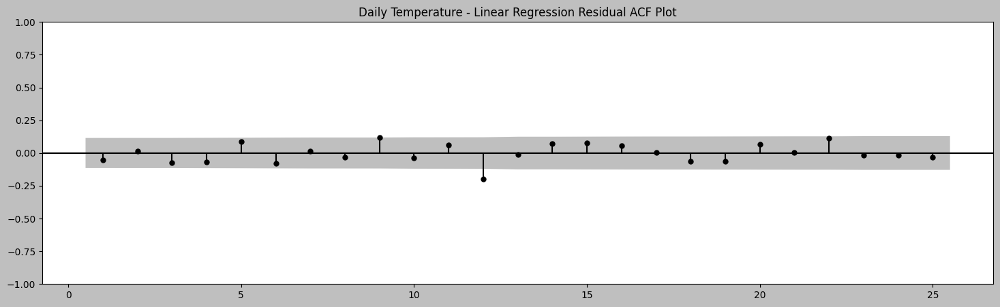

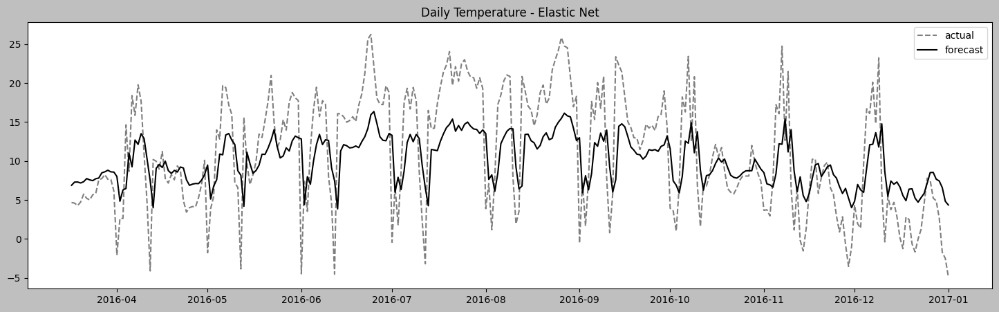

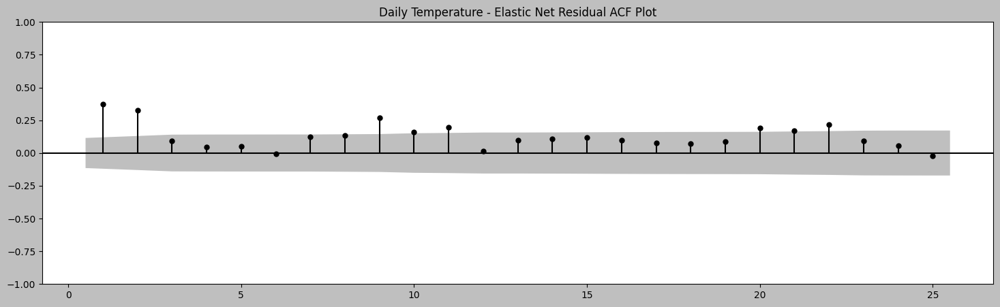

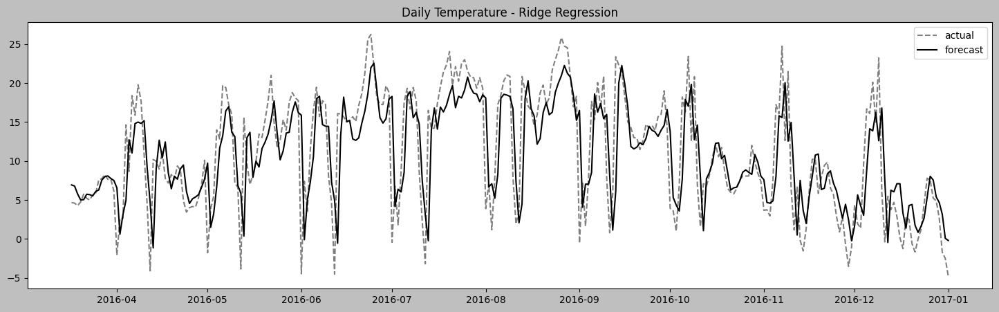

...

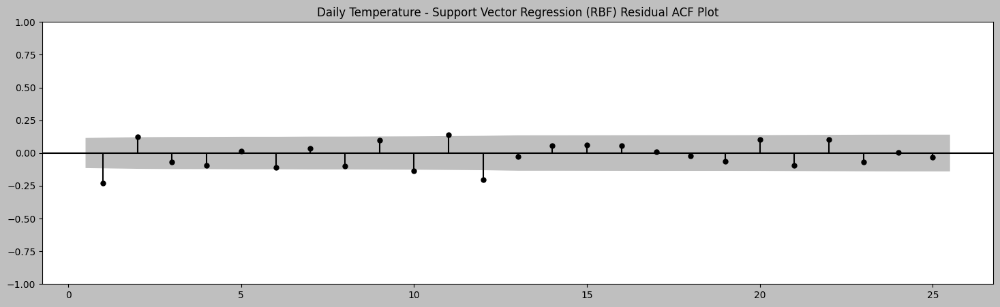

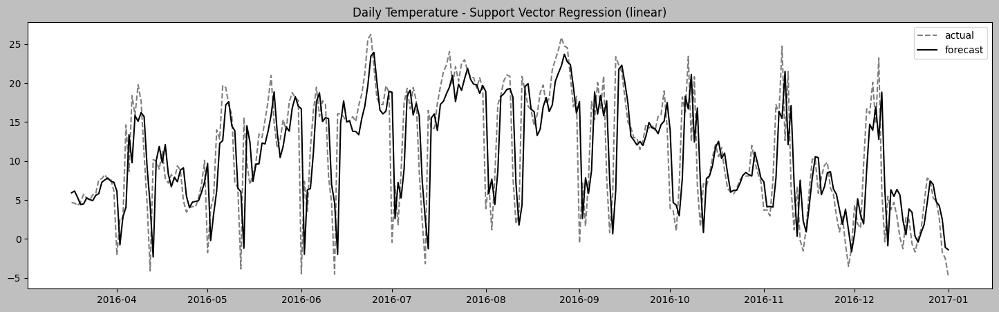

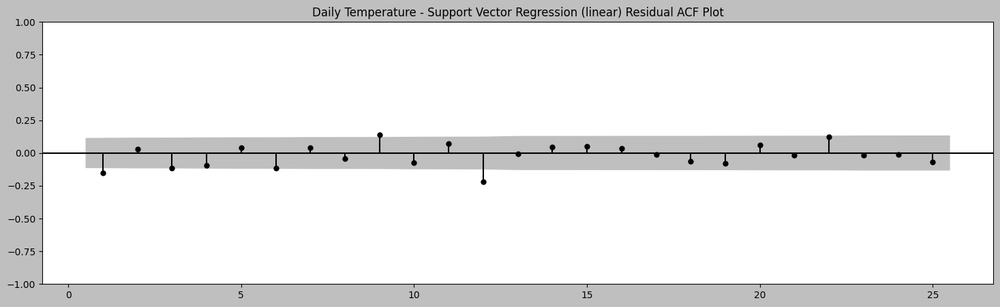

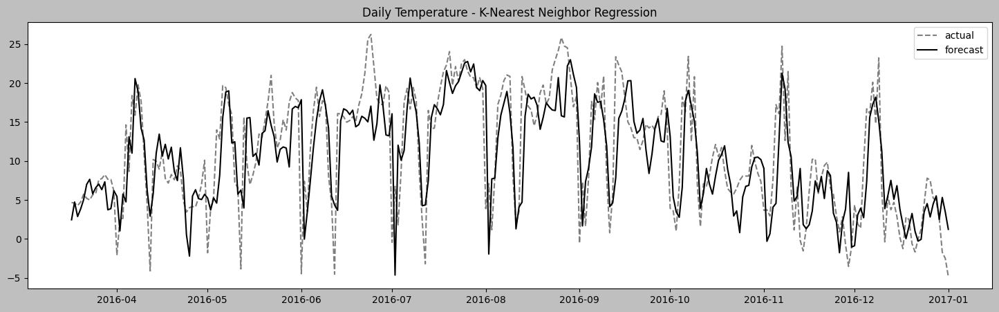

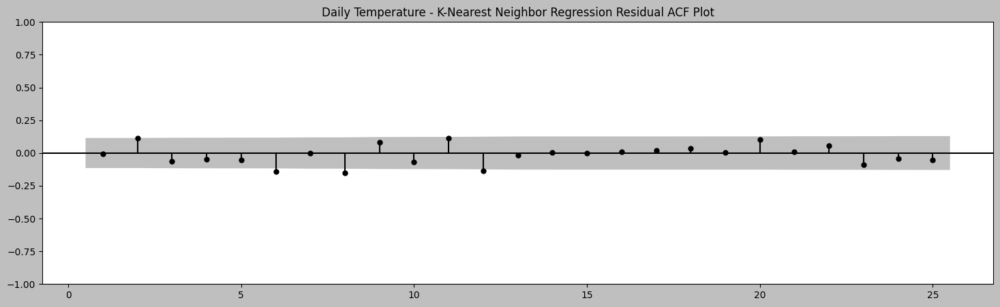

In [56]:
plot_results(dw_results_df, 'Daily Temperature')

## How it works

In [57]:
dw_results_df.head()

,Model Name,Model,RMSE,MAPE,MASE,MAE,yhat,resid,actual
0,Linear Regression,LinearRegression(),5.077762,1.670720,0.990057,3.614832,DateTime 2016-03-17 6.930019 2016-03-18 ...,"[-2.261755015721832, -2.1886512162522793, -1.4...",DateTime 2016-03-17 4.668264 2016-03-18 ...
1,Elastic Net,ElasticNet(alpha=0.5),5.794283,3.633642,1.300792,4.749366,DateTime 2016-03-17 6.885837 2016-03-18 ...,"[-2.217573029403093, -2.697755543000011, -3.02...",DateTime 2016-03-17 4.668264 2016-03-18 ...
2,Ridge Regression,Ridge(alpha=0.5),5.077692,1.671321,0.990085,3.614933,DateTime 2016-03-17 6.930442 2016-03-18 ...,"[-2.2621777587154748, -2.1894068014338686, -1....",DateTime 2016-03-17 4.668264 2016-03-18 ...
3,Lasso Regression,Lasso(alpha=0.5),6.396664,4.572397,1.468567,5.361935,DateTime 2016-03-17 7.866928 2016-03-18 ...,"[-3.198663874984807, -3.4939988116862217, -3.7...",DateTime 2016-03-17 4.668264 2016-03-18 ...
4,Huber Regression,HuberRegressor(),5.151917,1.281640,0.969541,3.539925,DateTime 2016-03-17 6.155529 2016-03-18 ...,"[-1.4872648969150566, -1.7076982507105374, -1....",DateTime 2016-03-17 4.668264 2016-03-18 ...


In [58]:
air_results_df.head()

,Model Name,Model,RMSE,MAPE,MASE,MAE,yhat,resid,actual
0,Linear Regression,LinearRegression(),39.820148,0.077452,1.411072,35.394382,date 1959-12-31 353.427406 1960-01-31 44...,"[51.57259411172794, -32.48705421463296, -25.89...",date 1959-12-31 405.0 1960-01-31 417.0 1...
1,Elastic Net,ElasticNet(alpha=0.5),85.620713,0.139963,2.808737,70.452495,date 1959-12-31 341.943738 1960-01-31 36...,"[63.056261610991726, 52.6151691830857, 19.3036...",date 1959-12-31 405.0 1960-01-31 417.0 1...
2,Ridge Regression,Ridge(alpha=0.5),39.358884,0.076121,1.390807,34.886068,date 1959-12-31 351.672968 1960-01-31 44...,"[53.32703229694539, -25.134325887626346, -32.8...",date 1959-12-31 405.0 1960-01-31 417.0 1...
3,Lasso Regression,Lasso(alpha=0.5),122.902761,0.227574,4.439302,111.352498,date 1959-12-31 313.304478 1960-01-31 33...,"[91.69552161325373, 84.29648492551638, 53.1241...",date 1959-12-31 405.0 1960-01-31 417.0 1...
4,Huber Regression,HuberRegressor(),44.031067,0.081506,1.473024,36.948363,date 1959-12-31 338.718828 1960-01-31 43...,"[66.28117237744692, -20.153832497376698, -10.8...",date 1959-12-31 405.0 1960-01-31 417.0 1...


In [59]:
air.head(15)

,y
date,
1949-01-31,112
1949-02-28,118
1949-03-31,132
1949-04-30,129
1949-05-31,121
1949-06-30,135
1949-07-31,148
1949-08-31,148
1949-09-30,136


In [60]:
air_ml.head()

,x_1,x_2,x_3,x_4,x_5,x_6,x_7,x_8,x_9,x_10,y
date,,,,,,,,,,,
1949-11-30,112,118,132,129,121,135,148,148,136,119,104
1949-12-31,118,132,129,121,135,148,148,136,119,104,118
1950-01-31,132,129,121,135,148,148,136,119,104,118,115
1950-02-28,129,121,135,148,148,136,119,104,118,115,126
1950-03-31,121,135,148,148,136,119,104,118,115,126,141


## There is more

In [61]:
air_models = air_results_df.iloc[0:4]

for row in air_models.iterrows():
    print(row[1]['Model Name'])
    print(row[1]['Model'].coef_)

Linear Regression
[ 0.26681178  0.23043566 -0.42770452  0.24811951 -0.19850306  0.36627057
 -0.34839752  0.17465605 -0.4063289   1.0808261 ]
Elastic Net
[0.18648073 0.0263418  0.         0.         0.         0.
 0.         0.         0.10713549 0.34068171]
Ridge Regression
[ 0.33843604  0.11322012 -0.30232719  0.12859953 -0.06811208  0.2329643
 -0.22611879  0.03192433 -0.22325426  0.95924758]
Lasso Regression
[0.00797701 0.         0.         0.         0.         0.
 0.         0.         0.         0.44080144]


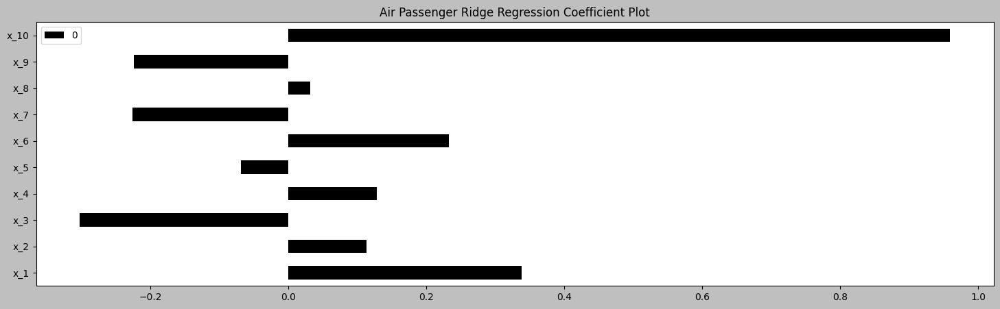

In [62]:
y_test = test_air['y']
X_test = test_air.drop(columns=['y'])

air_ridge = air_results_df.iloc[2]['Model'].coef_
title='Air Passenger Ridge Regression Coefficient Plot'
pd.DataFrame(air_ridge, X_test.columns).plot(kind='barh', 
                                             title=title);

In [63]:
en_results_df.iloc[7]

Model Name                                Extra Tree Regression
Model         (ExtraTreeRegressor(random_state=1915953826), ...
RMSE                                                 102.595562
MAPE                                                    0.04071
MASE                                                   0.321675
MAE                                                   73.350716
yhat          Month
2017-04-01    1454.62710
2017-05-01    1...
resid         [-144.8831, -11.79903000000013, -57.6073400000...
actual        Month
2017-04-01    1309.744
2017-05-01    131...
Name: 7, dtype: object

In [64]:
en_results_df.iloc[7]['Model'].feature_importances_

array([0.1257978 , 0.02869446, 0.05895378, 0.04026222, 0.03871364,
       0.03000401, 0.04028459, 0.05722261, 0.06686383, 0.51320306])

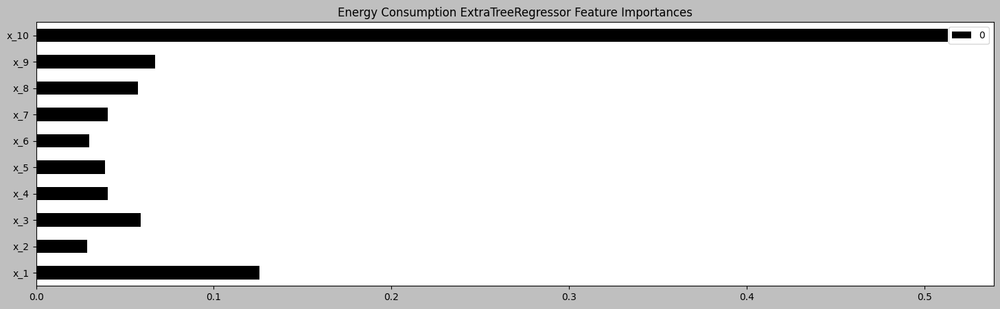

In [65]:
en_features = en_results_df.iloc[7]['Model'].feature_importances_
title = 'Energy Consumption ExtraTreeRegressor Feature Importances'
pd.DataFrame(en_features, X_test.columns).plot(kind='barh',
                                              title=title);

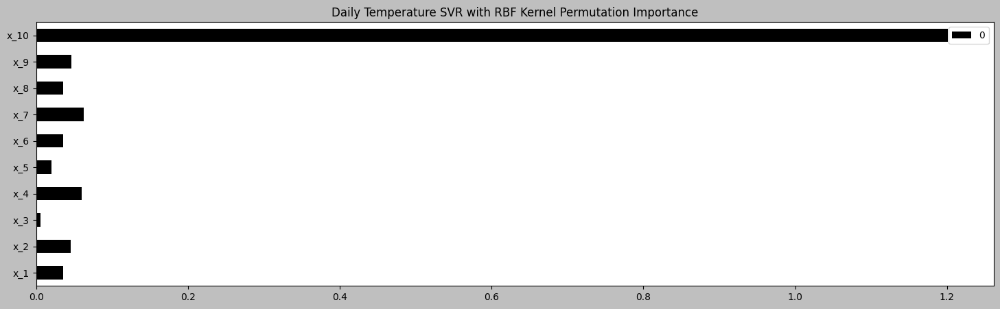

In [66]:
from sklearn.inspection import permutation_importance
svr_rbf = dw_results_df.iloc[8]['Model']

y_test = test_dw['y']
X_test = test_dw.drop(columns=['y'])

result = permutation_importance(svr_rbf, X_test, y_test, n_repeats=10, random_state=42)
perm_importance = result.importances_mean
title='Daily Temperature SVR with RBF Kernel Permutation Importance'
pd.DataFrame(perm_importance, X_test.columns).plot(kind='barh',
                                                  title=title);

# Recipe 3. Multi-Step Forecasting using Linear Regression Models with Scikit-Learn

In [67]:
air_results = train_different_models(train_air, test_air, regressors, scale_air)
en_results = train_different_models(train_en, test_en, regressors, scale_en)
dw_results = train_different_models(train_dw, test_dw, regressors, scale_dw)

air_results = pd.DataFrame(air_results)
en_results = pd.DataFrame(en_results)
dw_results = pd.DataFrame(dw_results)

training Linear Regression ...
1.4110717151495815
training Elastic Net ...
2.808737340461765
training Ridge Regression ...
1.3908067071978103
training Lasso Regression ...
4.439302258439553
training Huber Regression ...
1.47302442245999
training Random Forest Regression ...
2.1252542806031203
training Gradient Boosting Regression ...
1.7599350146844182
training Extra Tree Regression ...
1.8034347048300543
training Support Vector Regression (RBF) ...
2.9515866456912105
training Support Vector Regression (linear) ...
1.4481044950016662
training K-Nearest Neighbor Regression ...
2.9765397393304367
training Linear Regression ...
0.5609894729893562
training Elastic Net ...
1.013425499560542
training Ridge Regression ...
0.5604502891668799
training Lasso Regression ...
1.1080920284151956
training Huber Regression ...
0.5243995471723867
training Random Forest Regression ...
0.4008542768207836
training Gradient Boosting Regression ...
0.4809583096462575
training Extra Tree Regression ...
0.329

In [68]:
models = air_results[['Model Name','Model']]
models

,Model Name,Model
0,Linear Regression,LinearRegression()
1,Elastic Net,ElasticNet(alpha=0.5)
2,Ridge Regression,Ridge(alpha=0.5)
3,Lasso Regression,Lasso(alpha=0.5)
4,Huber Regression,HuberRegressor()
5,Random Forest Regression,"(DecisionTreeRegressor(max_features=1.0, rando..."
6,Gradient Boosting Regression,([DecisionTreeRegressor(criterion='friedman_ms...
7,Extra Tree Regression,"(ExtraTreeRegressor(random_state=229803566), E..."
8,Support Vector Regression (RBF),SVR()
9,Support Vector Regression (linear),SVR(kernel='linear')


In [69]:
#another version using NumPy
def recursive_forecast(data, model, steps=10):
    forecast = []
    # Avoid modifying the original data
    data = np.array(data, copy=True)  
    
    for i in range(steps):
        one_step_pred = model.predict(data.reshape(1, -1))[0]
        forecast.append(one_step_pred)
        
        # Update the input data for the next step
        data = np.roll(data, shift=-1) # Shift elements to the left
        data[-1] = one_step_pred # Replace the last element with the new prediction
    
    return np.array(forecast)

In [70]:
def recursive_forecast(data, model, steps=10):
    forecast = []
    # Avoid modifying the original data
    data = data.copy()
    
    for i in range(steps):
        one_step_pred = model.predict(np.array(data).reshape(1,-1))[0]
        forecast.append(one_step_pred)
        
        # Update the input data for the next step
        _ = data.pop(0) # Remove the oldest observation
        data.append(one_step_pred) # Add the latest prediction
        
    return np.array(forecast)

### Daily Temperature

In [71]:
# display(test_dw)
# test_dw.drop(columns=['y']).iloc[-1].tolist()

In [72]:
import warnings
warnings.filterwarnings(action='ignore', category=UserWarning)

frcst_dw = {}
models = dw_results[['Model Name','Model']]
dw_ms = test_dw.drop(columns=['y']).iloc[-1].tolist()

for i in models.iterrows():
    pred = recursive_forecast(dw_ms, model=i[1]['Model'], steps=10)
    # pred = scale_dw.inverse_y(pred)
    frcst_dw[i[1]['Model Name']] = pred    

### Air Passengers

In [73]:
models = air_results[['Model Name','Model']]
air_ms = test_air.drop(columns=['y']).iloc[-1].tolist()
frcst_air = {}
for i in models.iterrows():
    pred = recursive_forecast(air_ms, model=i[1]['Model'], steps=10)
    pred = scale_air.inverse_y(pred)
    frcst_air[i[1]['Model Name']] = pred   

### Energy Consumption

In [74]:
models = en_results[['Model Name','Model']]
en_ms = test_en.drop(columns=['y']).iloc[-1].tolist()
frcst_en = {}
for i in models.iterrows():
    pred = recursive_forecast(en_ms, model=i[1]['Model'], steps=10)
    pred = scale_en.inverse_y(pred)
    frcst_en[i[1]['Model Name']] = pred   

### Example plotting Air Passenger Data

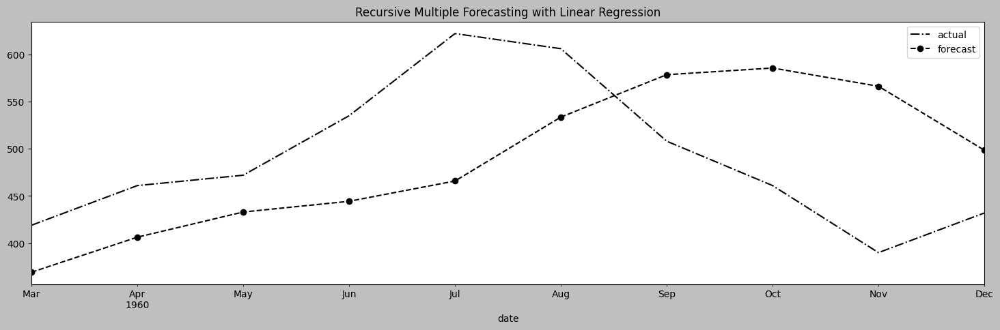

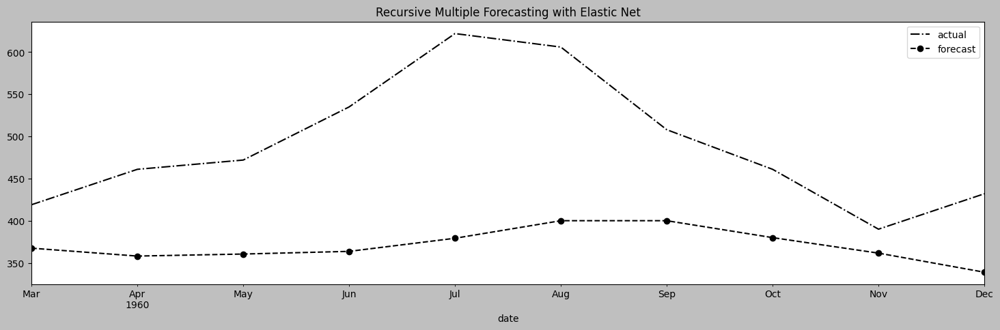

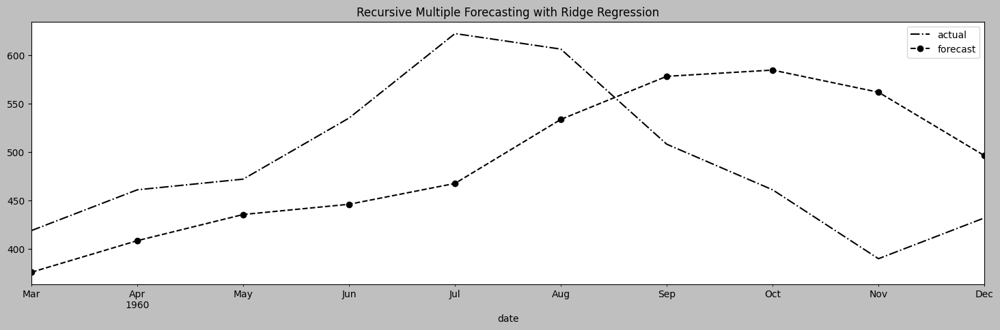

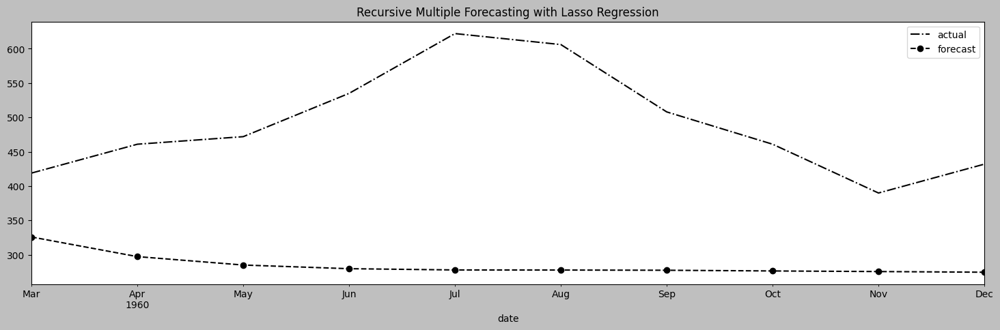

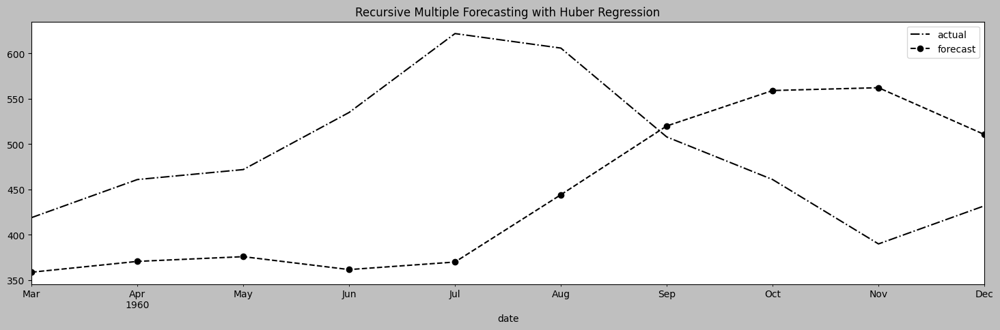

...

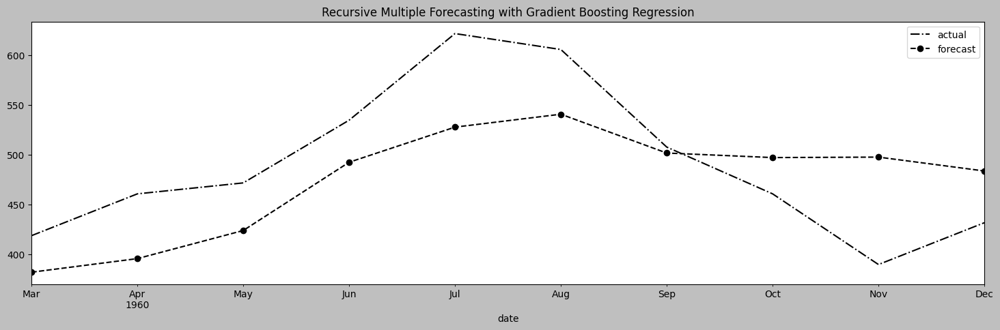

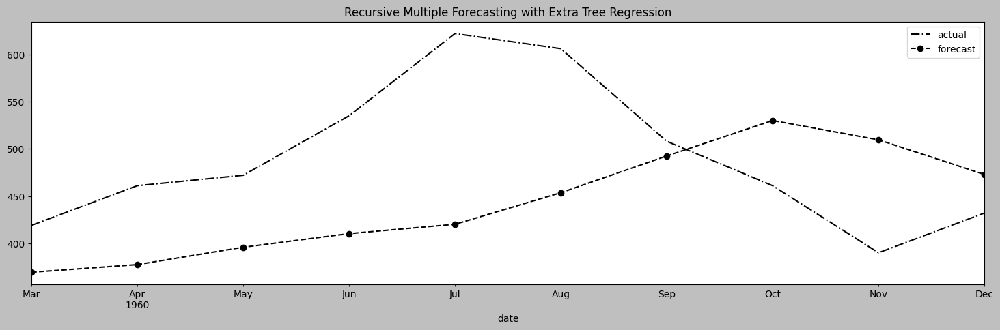

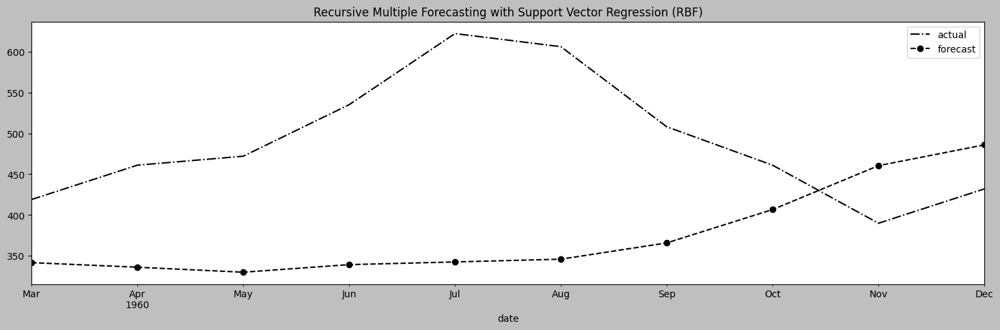

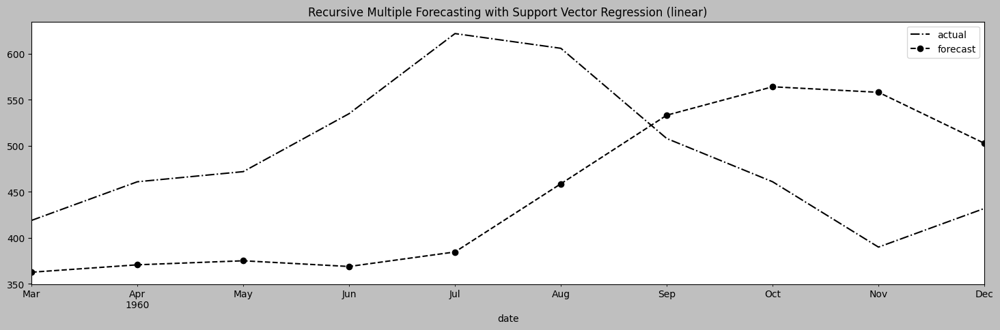

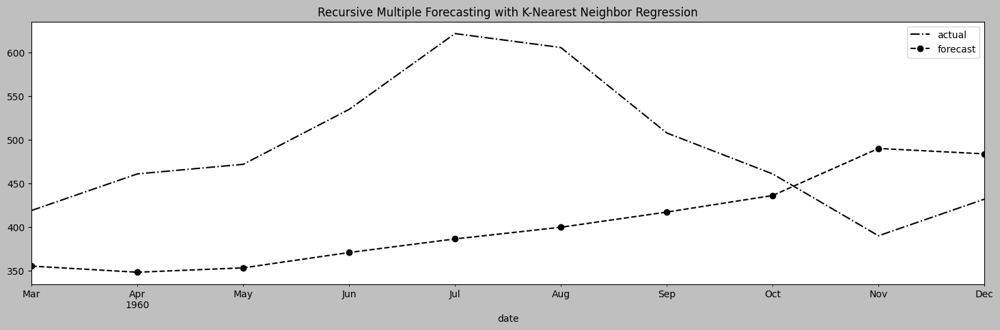

In [75]:
for name, pred in frcst_air.items():
    actual = air_cp.iloc[-10:]
    ax = actual.plot(style='k-.')
    pd.Series(pred, index=air_cp.index[-10:]).plot(style='k--o', ax=ax)
    plt.title(f'Recursive Multiple Forecasting with {name}')
    plt.legend(['actual', 'forecast'])
    plt.show()

## How it works

#### Example of longer forecast and issues with Recursive strategy

In [76]:
frcst_air = {}
models = air_results[['Model Name','Model']]
air_ms = test_air.drop(columns=['y']).iloc[-1].tolist()

for i in models.iterrows():
    pred = recursive_forecast(air_ms, steps=20, model=i[1]['Model'])
    pred = scale_air.inverse_y(pred)
    frcst_air[i[1]['Model Name']] = pred   

In [77]:
air_cp

,y
date,
1949-01-31,112
1949-02-28,118
1949-03-31,132
1949-04-30,129
1949-05-31,121
...,...
1960-08-31,606
1960-09-30,508
1960-10-31,461


In [78]:
last_date = air_cp.index[-1]

# Generate a date range for the next 10 months, with a monthly frequency ('M')
new_dates = pd.date_range(start=last_date + pd.DateOffset(months=1), periods=10, freq='ME')

# Concatenate the original index with the new dates
extended_index = air_cp.index.append(new_dates)
extended_index[-20:]

DatetimeIndex(['1960-03-31', '1960-04-30', '1960-05-31', '1960-06-30',
               '1960-07-31', '1960-08-31', '1960-09-30', '1960-10-31',
               '1960-11-30', '1960-12-31', '1961-01-31', '1961-02-28',
               '1961-03-31', '1961-04-30', '1961-05-31', '1961-06-30',
               '1961-07-31', '1961-08-31', '1961-09-30', '1961-10-31'],
              dtype='datetime64[ns]', freq='ME')

In [79]:
print(len(pred))
actual.shape

20


(10, 1)

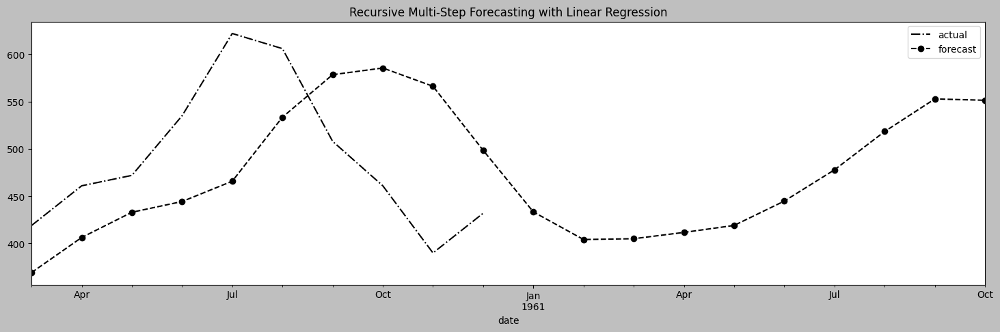

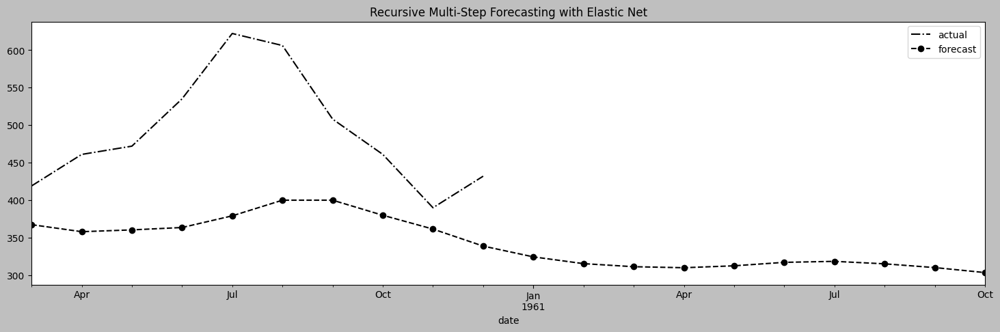

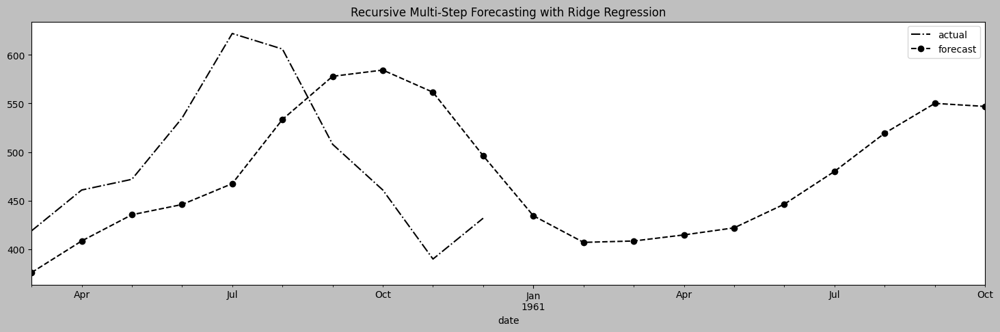

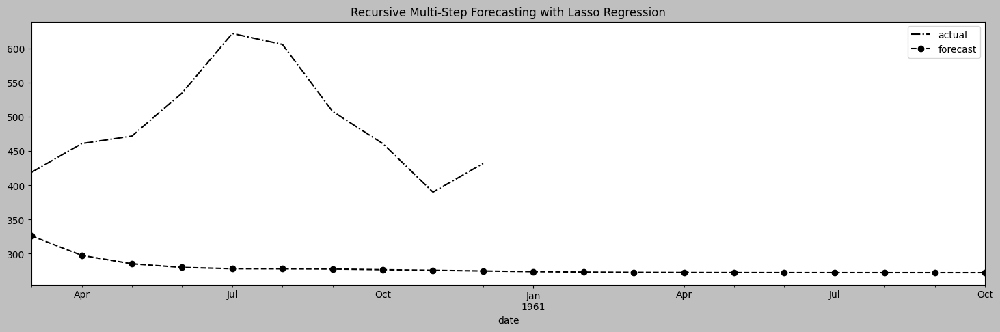

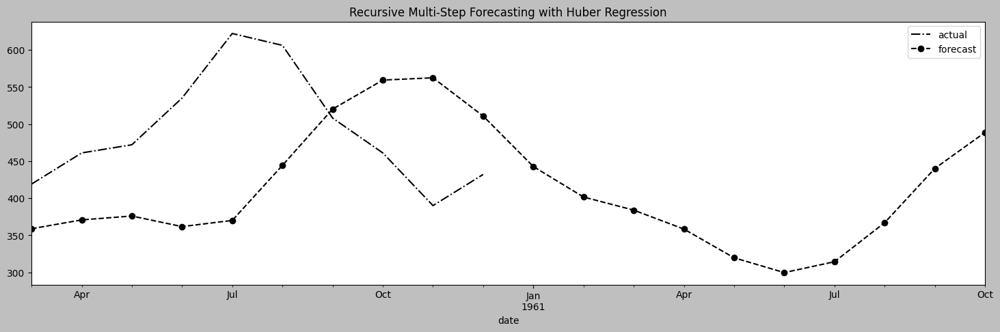

...

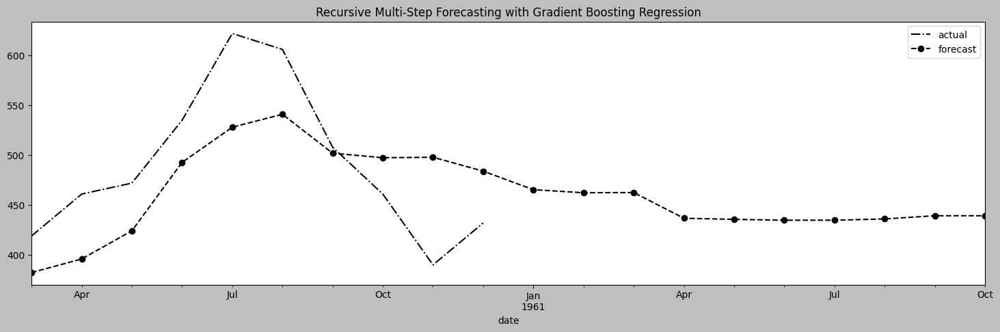

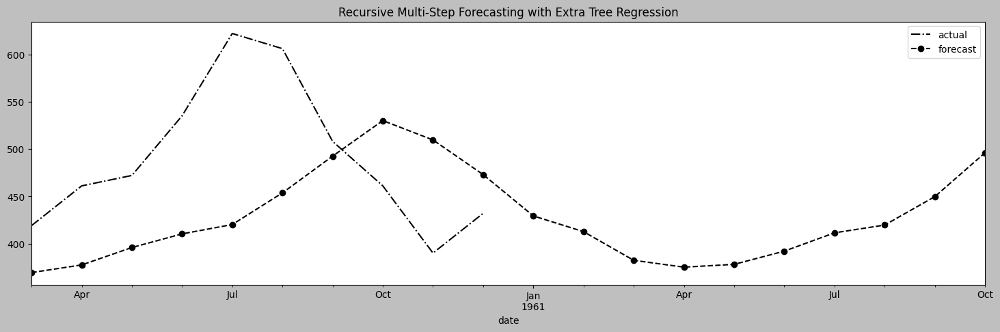

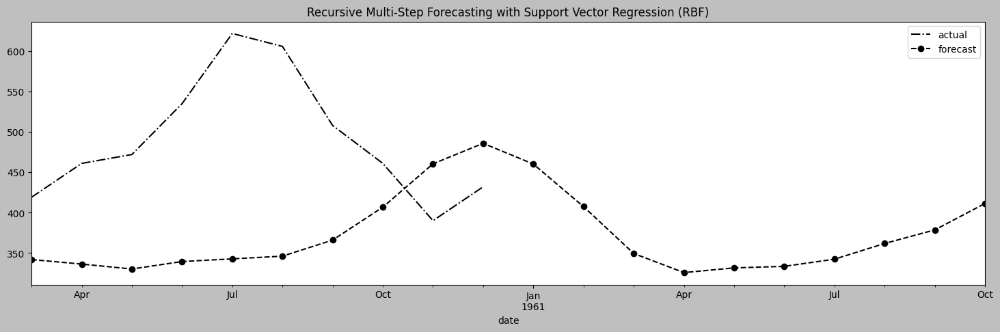

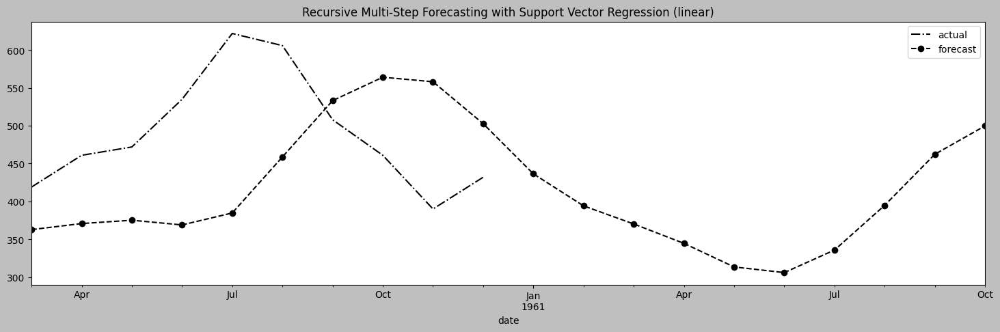

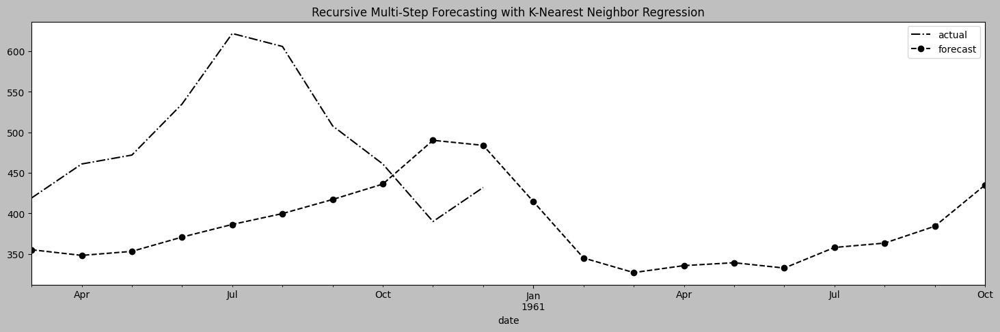

In [80]:
for name, pred in frcst_air.items():
    actual = air_cp.iloc[-10:]
    ax = actual.plot(style='k-.')
    pd.Series(pred, index=extended_index[-20:]).plot(style='k--o', ax=ax)
    plt.title(f'Recursive Multi-Step Forecasting with {name}')
    plt.legend(['actual', 'forecast'])
    plt.show()

## There is more

In [81]:
import numpy as np
import pandas as pd

def multiple_output_features(df, window_in, window_out):
    d = df.values.squeeze()

    x = np.lib.stride_tricks.sliding_window_view(d, window_shape=window_in)[:-window_out]
    y = np.lib.stride_tricks.sliding_window_view(d[window_in:], window_shape=window_out)

    cols_x = [f'x_{i}' for i in range(1, window_in + 1)]
    cols_y = [f'y_{i}' for i in range(1, window_out + 1)]
    
    df_xs = pd.DataFrame(x, columns=cols_x, index=df.index[window_in:len(df) - window_out + 1])
    df_ys = pd.DataFrame(y, columns=cols_y, index=df.index[window_in:len(df) - window_out + 1])

    return pd.concat([df_xs, df_ys], axis=1)



In [82]:
air_ml.head()

,x_1,x_2,x_3,x_4,x_5,x_6,x_7,x_8,x_9,x_10,y
date,,,,,,,,,,,
1949-11-30,112,118,132,129,121,135,148,148,136,119,104
1949-12-31,118,132,129,121,135,148,148,136,119,104,118
1950-01-31,132,129,121,135,148,148,136,119,104,118,115
1950-02-28,129,121,135,148,148,136,119,104,118,115,126
1950-03-31,121,135,148,148,136,119,104,118,115,126,141


In [83]:
win_in, win_out = 10, 10
air_mo = multiple_output_features(air_cp, win_in, win_out)
dw_mo = multiple_output_features(dw_cp, win_in, win_out)
en_mo = multiple_output_features(en_cp, win_in, win_out)

# train_air, test_air = split_data(air_mo, test_split=0.10)
# scaler_air = Standardize()
# train_air_sc, test_air_sc = scaler_air.fit_transform(train_air,test_air)

In [84]:
print(air_mo.columns)

Index(['x_1', 'x_2', 'x_3', 'x_4', 'x_5', 'x_6', 'x_7', 'x_8', 'x_9', 'x_10',
       'y_1', 'y_2', 'y_3', 'y_4', 'y_5', 'y_6', 'y_7', 'y_8', 'y_9', 'y_10'],
      dtype='object')


In [85]:
air_mo.head()

,x_1,x_2,x_3,x_4,x_5,x_6,x_7,x_8,x_9,x_10,y_1,y_2,y_3,y_4,y_5,y_6,y_7,y_8,y_9,y_10
date,,,,,,,,,,,,,,,,,,,,
1949-11-30,112,118,132,129,121,135,148,148,136,119,104,118,115,126,141,135,125,149,170,170
1949-12-31,118,132,129,121,135,148,148,136,119,104,118,115,126,141,135,125,149,170,170,158
1950-01-31,132,129,121,135,148,148,136,119,104,118,115,126,141,135,125,149,170,170,158,133
1950-02-28,129,121,135,148,148,136,119,104,118,115,126,141,135,125,149,170,170,158,133,114
1950-03-31,121,135,148,148,136,119,104,118,115,126,141,135,125,149,170,170,158,133,114,140


In [86]:
train_mo_air, test_mo_air = split_data(air_mo, test_split=0.10)
train_mo_en, test_mo_en = split_data(en_mo, test_split=0.10)
train_mo_dw, test_mo_dw = split_data(dw_mo, test_split=0.10)

In [87]:
from sklearn.metrics import mean_squared_error as mse, mean_absolute_error as mae
from sklearn.multioutput import MultiOutputRegressor
from sklearn.preprocessing import StandardScaler

def train_model_mo(train, test, regressor, reg_name, win_in, win_out):
    X_train, y_train = train.iloc[:, :win_in], train.iloc[:, win_in:]
    X_test, y_test = test.iloc[:, :win_in], test.iloc[:, win_in:]

    scaler_X = StandardScaler()
    scaler_y = StandardScaler()
    
    X_train_s = scaler_X.fit_transform(X_train)  
    y_train_s = scaler_y.fit_transform(y_train)  

    X_test_s = scaler_X.transform(X_test)
    y_test_s = scaler_y.transform(y_test)
    
    try:
        reg = regressor().fit(X_train_s, y_train_s) 
        print(f'Training {reg_name} ...')
    except:
        print(f'{reg_name} does not support multiple outputs')
        try:
            reg = MultiOutputRegressor(regressor()).fit(X_train_s, y_train_s)
            print(f'using sklearn MultipleOutput for {reg_name}')
        except Exception as e:
            print(f'Failed for {reg_name}: {e}')
        
    yhat = reg.predict(X_test_s)
    yhat = scaler_y.inverse_transform(yhat)
    actual = y_test.values

    # Compute evaluation metrics for multi-output, with multioutput='uniform_average'
    rmse_test = np.sqrt(mse(actual, yhat, multioutput='uniform_average'))
    mae_test = mae(actual, yhat, multioutput='uniform_average')
    mape_test = np.mean(np.abs((actual - yhat) / actual)) * 100 
    mase_test = mase(actual, yhat, y_train=y_train) 

    residuals = actual - yhat
    
    model_metadata = {
        'Model Name': reg_name, 
        'Model': reg, 
        'RMSE': rmse_test, 
        'MAPE': mape_test,
        'MASE': mase_test,
        'MAE': mae_test,
        'test': X_test,
        'yhat': pd.DataFrame(yhat, index=y_test.index, columns=y_test.columns), 
        'resid': pd.DataFrame(residuals, index=y_test.index, columns=y_test.columns),
        'actual': y_test
    }
    
    return model_metadata

def train_different_models(train, test, regressors, win_in, win_out):
    results = []
    for reg_name, regressor in regressors.items():
        result = train_model_mo(
            train=train, 
            test=test, 
            regressor=regressor, 
            reg_name=reg_name, 
            win_in=win_in, 
            win_out=win_out
        )
        results.append(result)
    return results


In [88]:
len(regressors)

11

In [89]:
air_results_mo = train_different_models(train_mo_air, test_mo_air, regressors, win_in=10, win_out=10)

Training Linear Regression ...
Training Elastic Net ...
Training Ridge Regression ...
Training Lasso Regression ...
Huber Regression does not support multiple outputs
using sklearn MultipleOutput for Huber Regression
Training Random Forest Regression ...
Gradient Boosting Regression does not support multiple outputs
using sklearn MultipleOutput for Gradient Boosting Regression
Training Extra Tree Regression ...
Support Vector Regression (RBF) does not support multiple outputs
using sklearn MultipleOutput for Support Vector Regression (RBF)
Support Vector Regression (linear) does not support multiple outputs
using sklearn MultipleOutput for Support Vector Regression (linear)
Training K-Nearest Neighbor Regression ...


In [90]:
en_results_mo = train_different_models(train_mo_en, test_mo_en, regressors, win_in=10, win_out=10)

Training Linear Regression ...
Training Elastic Net ...
Training Ridge Regression ...
Training Lasso Regression ...
Huber Regression does not support multiple outputs
using sklearn MultipleOutput for Huber Regression
Training Random Forest Regression ...
Gradient Boosting Regression does not support multiple outputs
using sklearn MultipleOutput for Gradient Boosting Regression
Training Extra Tree Regression ...
Support Vector Regression (RBF) does not support multiple outputs
using sklearn MultipleOutput for Support Vector Regression (RBF)
Support Vector Regression (linear) does not support multiple outputs
using sklearn MultipleOutput for Support Vector Regression (linear)
Training K-Nearest Neighbor Regression ...


In [91]:
dw_results_mo = train_different_models(train_mo_dw, test_mo_dw, regressors, win_in=10, win_out=10)

Training Linear Regression ...
Training Elastic Net ...
Training Ridge Regression ...
Training Lasso Regression ...
Huber Regression does not support multiple outputs
using sklearn MultipleOutput for Huber Regression
Training Random Forest Regression ...
Gradient Boosting Regression does not support multiple outputs
using sklearn MultipleOutput for Gradient Boosting Regression
Training Extra Tree Regression ...
Support Vector Regression (RBF) does not support multiple outputs
using sklearn MultipleOutput for Support Vector Regression (RBF)
Support Vector Regression (linear) does not support multiple outputs
using sklearn MultipleOutput for Support Vector Regression (linear)
Training K-Nearest Neighbor Regression ...


In [92]:
air_results_mo[0].keys()

dict_keys(['Model Name', 'Model', 'RMSE', 'MAPE', 'MASE', 'MAE', 'test', 'yhat', 'resid', 'actual'])

In [93]:
air_results_mo_df = pd.DataFrame(air_results_mo)
air_results_mo_sorted = evaluate_results(air_results_mo_df)
print(air_results_mo_sorted.head(3))

                           Model Name       RMSE      MAPE      MASE
0                    Huber Regression  25.349827  4.590653  0.816905
1  Support Vector Regression (linear)  25.908003  4.592281  0.821234
2                    Ridge Regression  26.316594  4.927290  0.884846


In [94]:
en_results_mo_df = pd.DataFrame(en_results_mo)
en_results_mo_sorted = evaluate_results(en_results_mo_df)
print(en_results_mo_sorted.head(3))

                        Model Name        RMSE      MAPE      MASE
0            Extra Tree Regression  115.376966  4.683947  0.370242
1    K-Nearest Neighbor Regression  126.100481  4.808844  0.387433
2  Support Vector Regression (RBF)  122.922862  5.126894  0.404319


In [95]:
dw_results_mo_df = pd.DataFrame(dw_results_mo)
dw_results_mo_sorted = evaluate_results(dw_results_mo_df)
print(dw_results_mo_sorted.head(3))

                        Model Name      RMSE        MAPE      MASE
0  Support Vector Regression (RBF)  6.070763  370.317016  1.310029
1            Extra Tree Regression  6.136499  339.185918  1.340275
2         Random Forest Regression  6.169881  382.549229  1.347150


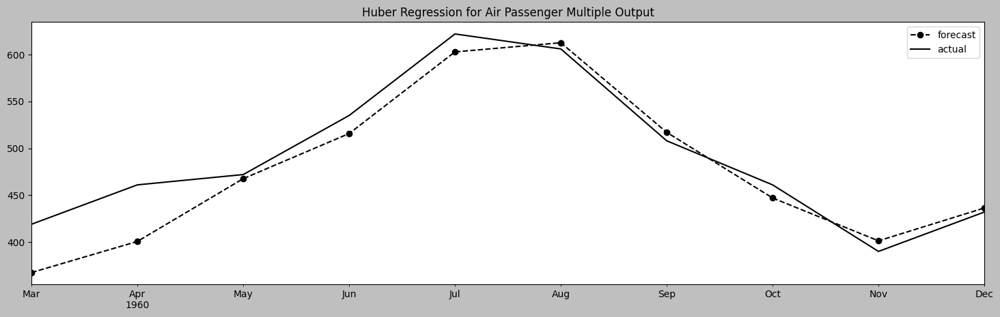

In [96]:
acutal = air_results_mo_df.loc[4]['test'].tail(1).T
forecast = air_results_mo_df.loc[4]['yhat'].tail(1).T
dates = pd.date_range(start='1960-03-31', periods=10, freq='ME')
actual.index = dates
forecast.index = dates
ax = forecast.plot(style='k--o')
actual.plot( ax=ax)
plt.title('Huber Regression for Air Passenger Multiple Output')
plt.legend(['forecast', 'actual'])
plt.show()

# Recipe 4. Forecasting with sktime

Loading required modules

In [97]:
# !conda list sktime
# !conda search sktime
from sktime.registry import all_estimators
all_estimators("forecaster", as_dataframe=True)

,name,object
0,ARCH,<class 'sktime.forecasting.arch._uarch.ARCH'>
1,ARDL,<class 'sktime.forecasting.ardl.ARDL'>
2,ARIMA,<class 'sktime.forecasting.arima._pmdarima.ARI...
3,AutoARIMA,<class 'sktime.forecasting.arima._pmdarima.Aut...
4,AutoETS,<class 'sktime.forecasting.ets.AutoETS'>
...,...,...
119,VAR,<class 'sktime.forecasting.var.VAR'>
120,VARMAX,<class 'sktime.forecasting.varmax.VARMAX'>
121,VARReduce,<class 'sktime.forecasting.var_reduce.VARReduce'>
122,VECM,<class 'sktime.forecasting.vecm.VECM'>


### Data Preparation Steps

In [98]:
from sklearn.ensemble import (RandomForestRegressor, 
                              GradientBoostingRegressor, 
                              ExtraTreesRegressor)
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline as sklearn_make_pipeline
from sktime.forecasting.model_selection import temporal_train_test_split
from sklearn.multioutput import MultiOutputRegressor
from sktime.performance_metrics.forecasting import (
    mean_absolute_error as mae,
    mean_absolute_percentage_error as mape,
    mean_absolute_scaled_error as mase,
    mean_squared_error as mse
)

from sktime.forecasting.compose import make_reduction
from sktime.forecasting.base import ForecastingHorizon
from sktime.utils import plotting

In [99]:
import sktime
sktime.__version__

'0.39.0'

Loading the dataset and inspecting the data

In [100]:
energy_df = energy.copy()
air_df = air.copy()
dw_df = daily_temp.copy()


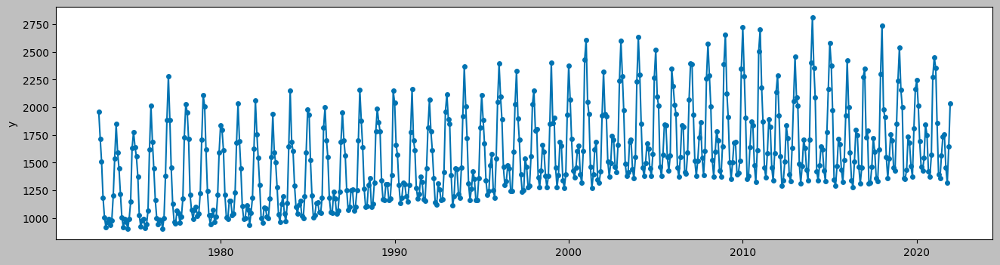

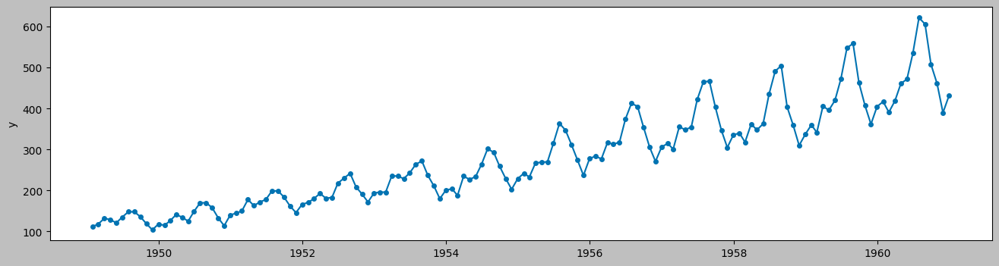

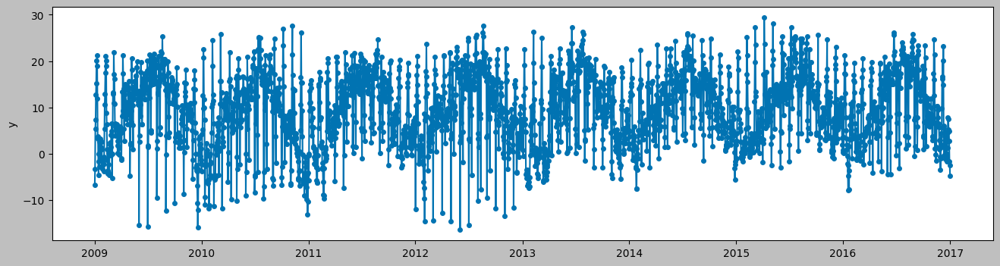

In [101]:
plotting.plot_series(energy_df)
plotting.plot_series(air_df)
plotting.plot_series(dw_df);

**Different ways to split your time series**


In [102]:
# train, test = split_data(df)

In [103]:
print(air_df.index.freq)
print(energy_df.index.freq)
print(dw_df.index.freq)

<MonthEnd>
<MonthBegin>
<Day>


In [104]:
144*0.10
288*0.10
2923*0.10

292.3

In [105]:
print(air_df.shape)
print(energy.shape)
print(dw_df.shape)

(144, 1)
(588, 1)
(2923, 1)


In [106]:
def handle_missing_data(df):
    n = df.isna().sum().values[0]
    if n > 0:
        print(f'found {n} missing observations...')
        df.ffill(inplace=True)

In [107]:
for df in [energy_df, air_df, dw_df]:
    handle_missing_data(df)

found 2 missing observations...


In [108]:
train_air, test_air = temporal_train_test_split(air_df,
                                                test_size=12)
train_en, test_en = temporal_train_test_split(energy_df, 
                                              test_size=24)
train_dw, test_dw = temporal_train_test_split(dw_df, 
                                              test_size=365)

In [109]:
print(train_air.shape)
print(train_en.shape)
print(train_dw.shape)

(132, 1)
(564, 1)
(2558, 1)


In [110]:
print(test_air.shape)
print(test_en.shape)
print(test_dw.shape)

(12, 1)
(24, 1)
(365, 1)


## Training 

In [111]:
regressors = { 
    'Linear Regression': LinearRegression,
    'Random Forest Regression': 
                lambda: RandomForestRegressor(random_state=42),
    'Gradient Boosting Regression': 
                lambda: GradientBoostingRegressor(random_state=42),
    'Extra Tree Regression': 
                lambda: ExtraTreesRegressor(random_state=42),
    'Support Vector Regression (RBF)': 
                lambda: SVR(kernel='rbf'),
    'Support Vector Regression (linear)': 
                lambda: SVR(kernel='linear'),
    'K-Nearest Neighbor Regression': 
                lambda: KNeighborsRegressor()
}

In [112]:
def train_model(train, test, reg, reg_name, strategy):
        
    fh = ForecastingHorizon(test.index, is_relative=False)
    sklearn_pipeline = sklearn_make_pipeline(StandardScaler(), reg)
    
    forecaster = make_reduction(estimator=sklearn_pipeline, 
                                window_length=10, 
                                strategy=strategy)
    print(f'training {reg_name} ...')
    forecaster.fit(train)
    yhat = forecaster.predict(fh)
    actual = test.copy()
    
    rmse_test = np.sqrt(mse(actual, yhat))
    mae_test = mae(actual, yhat)
    mape_test = mape(actual, yhat)
    mase_test = mase(actual, yhat, y_train=(train))

    model_metadata = {
        'Model Name': reg_name, 
        'Model': forecaster, 
        'RMSE': rmse_test, 
        'MAPE': mape_test,
        'MASE': mase_test,
        'MAE': mae_test,
        'yhat': yhat, 
        'actual': actual}
    
    return model_metadata

def train_different_models(train, test, regressors, strategy):
    results = []
    for reg_name, reg in regressors.items():
        results.append(train_model(train,
                                   test,
                                   reg(),
                                   reg_name,
                                   strategy))
    return results


In [113]:
%%time
air_results = train_different_models(train_air, 
                                     test_air, 
                                     regressors, 
                                     strategy="recursive")

training Linear Regression ...
training Random Forest Regression ...
training Gradient Boosting Regression ...
training Extra Tree Regression ...
training Support Vector Regression (RBF) ...
training Support Vector Regression (linear) ...
training K-Nearest Neighbor Regression ...
CPU times: user 268 ms, sys: 4.67 ms, total: 272 ms
Wall time: 280 ms


In [114]:
%%time
en_results = train_different_models(train_en, 
                                    test_en, 
                                    regressors, 
                                    strategy="recursive")

training Linear Regression ...
training Random Forest Regression ...
training Gradient Boosting Regression ...
training Extra Tree Regression ...
training Support Vector Regression (RBF) ...
training Support Vector Regression (linear) ...
training K-Nearest Neighbor Regression ...
CPU times: user 643 ms, sys: 7.05 ms, total: 650 ms
Wall time: 650 ms


In [115]:
%%time
dw_results = train_different_models(train_dw, 
                                    test_dw, 
                                    regressors, 
                                    strategy="recursive")

training Linear Regression ...
training Random Forest Regression ...
training Gradient Boosting Regression ...
training Extra Tree Regression ...
training Support Vector Regression (RBF) ...
training Support Vector Regression (linear) ...
training K-Nearest Neighbor Regression ...
CPU times: user 4.35 s, sys: 38.6 ms, total: 4.39 s
Wall time: 4.4 s


In [116]:
# pd.DataFrame(air_results)

## Evaluating Models

In [117]:
def evaluate_results(results, by='MASE'):
    cols = ['Model Name', by]
    df_sorted = results[cols].sort_values(by).reset_index(drop=True)
    return df_sorted

In [118]:
air_results_df = pd.DataFrame(air_results)
air_results_sorted = evaluate_results(air_results_df)
print(air_results_sorted.head(3))

                     Model Name      MASE
0             Linear Regression  1.580819
1  Gradient Boosting Regression  2.205693
2         Extra Tree Regression  2.425161


In [119]:
en_results_df = pd.DataFrame(en_results)
en_results_sorted = evaluate_results(en_results_df)
print(en_results_sorted.head(3))

                      Model Name      MASE
0          Extra Tree Regression  0.423111
1  K-Nearest Neighbor Regression  0.423276
2              Linear Regression  0.516344


In [120]:
dw_results_df = pd.DataFrame(dw_results)
dw_results_sorted = evaluate_results(dw_results_df)
print(dw_results_sorted.head(3))

                           Model Name      MASE
0     Support Vector Regression (RBF)  1.777303
1                   Linear Regression  1.806715
2  Support Vector Regression (linear)  1.815235


In [121]:
def plot_results(results, data_name):
    cols = ['yhat', 'actual', 'Model Name']
    for row in results[cols].iterrows():
        yhat, actual, name = row[1]
        plt.title(f'{data_name} - {name}')
        plt.plot(actual, 'k--', alpha=0.5)
        plt.plot(yhat, 'k')
        plt.legend(['actual', 'forecast'])
        plt.show()


In [122]:
air_results_df[['yhat', 'actual', 'Model Name']]

,yhat,actual,Model Name
0,y 1960-01-31 453.787055 ...,y 1960-01-31 417 1960-02-29 39...,Linear Regression
1,y 1960-01-31 390.23 1960-02-...,y 1960-01-31 417 1960-02-29 39...,Random Forest Regression
2,y 1960-01-31 400.416803 ...,y 1960-01-31 417 1960-02-29 39...,Gradient Boosting Regression
3,y 1960-01-31 409.15 1960-02-...,y 1960-01-31 417 1960-02-29 39...,Extra Tree Regression
4,y 1960-01-31 281.958799 ...,y 1960-01-31 417 1960-02-29 39...,Support Vector Regression (RBF)
5,y 1960-01-31 406.063744 ...,y 1960-01-31 417 1960-02-29 39...,Support Vector Regression (linear)
6,y 1960-01-31 356.8 1960-02-29...,y 1960-01-31 417 1960-02-29 39...,K-Nearest Neighbor Regression


## Plotting Forecasts

### Air Passenger Plots

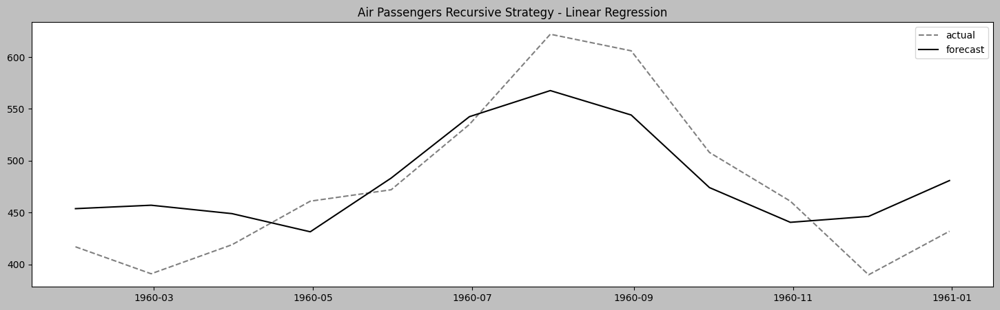

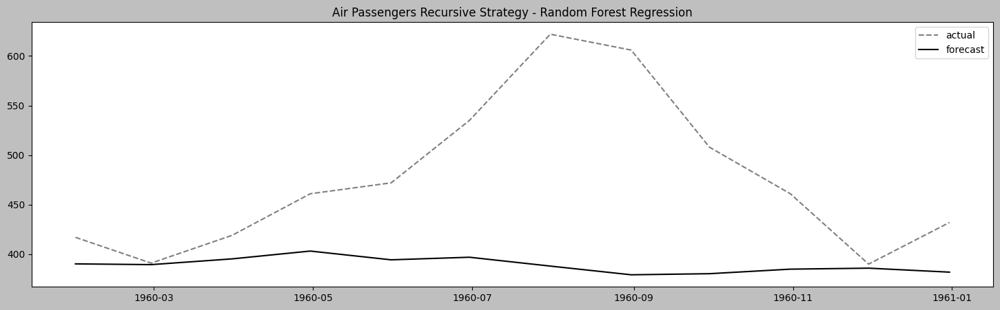

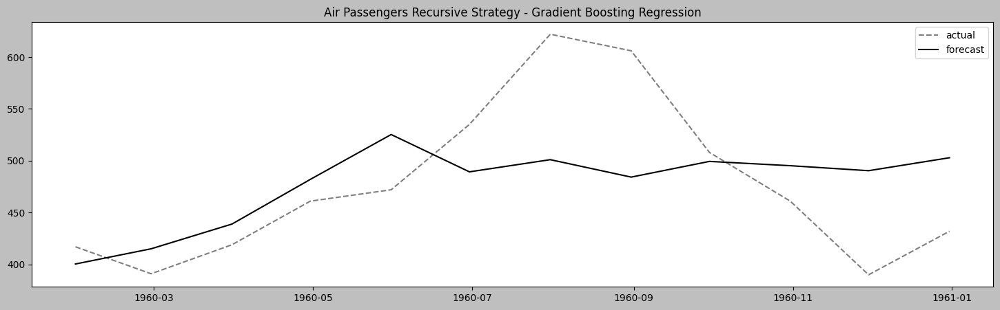

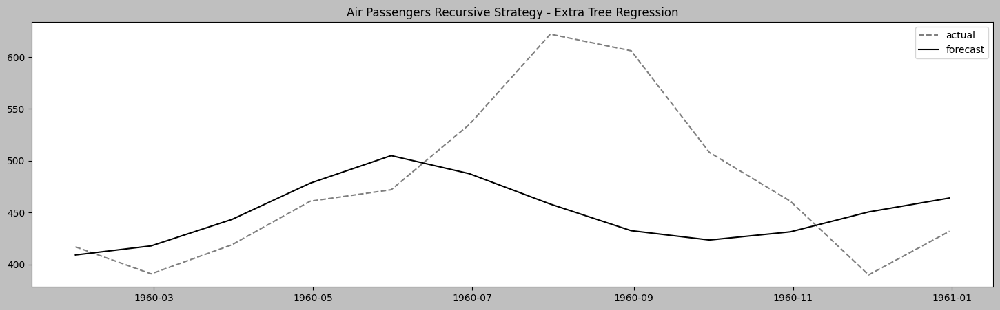

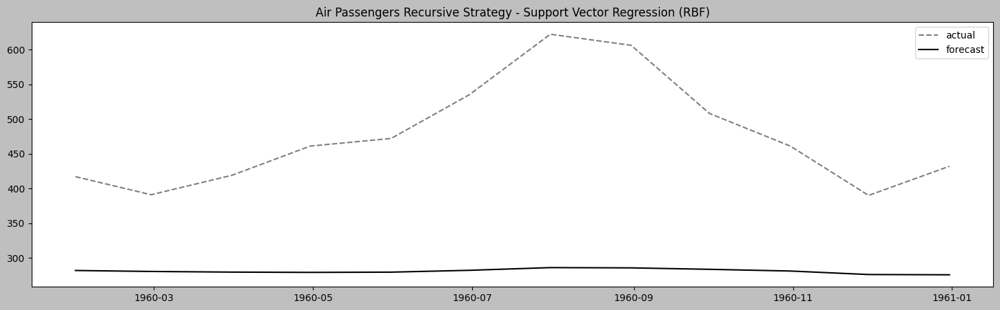

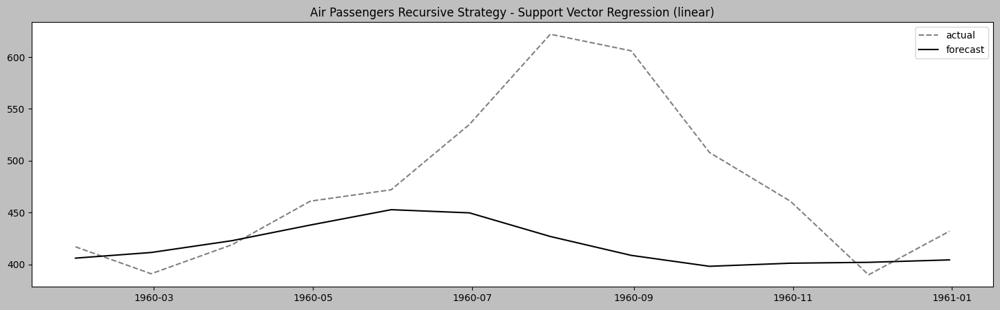

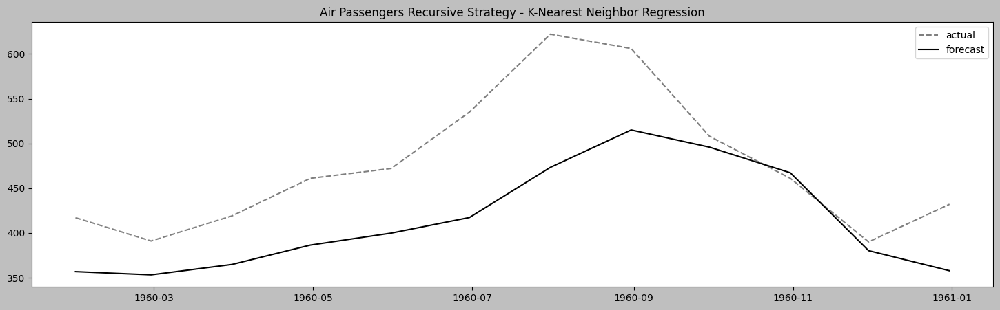

In [123]:
plot_results(air_results_df, 'Air Passengers Recursive Strategy')

### Energy Consumption Plots

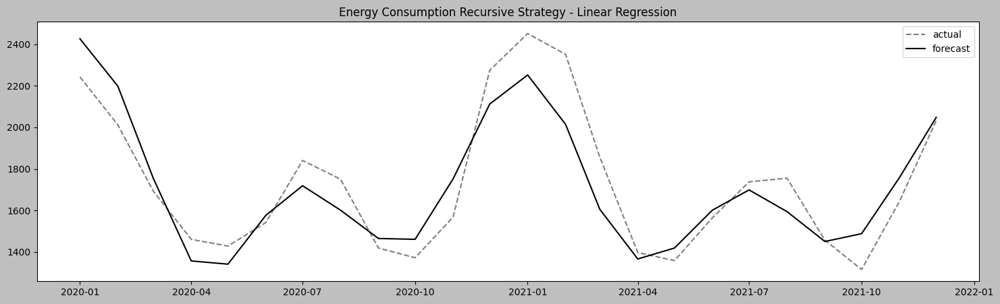

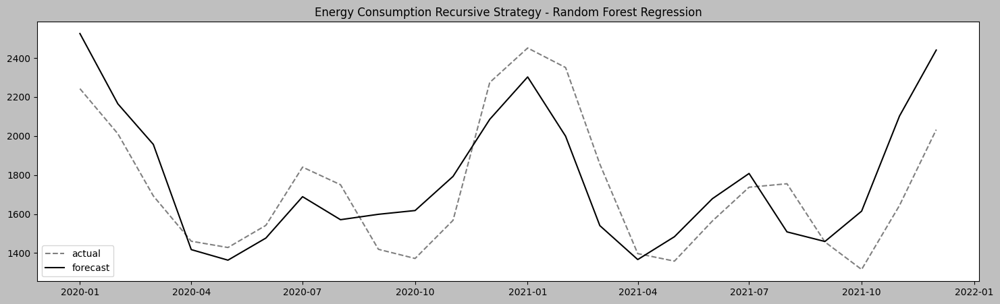

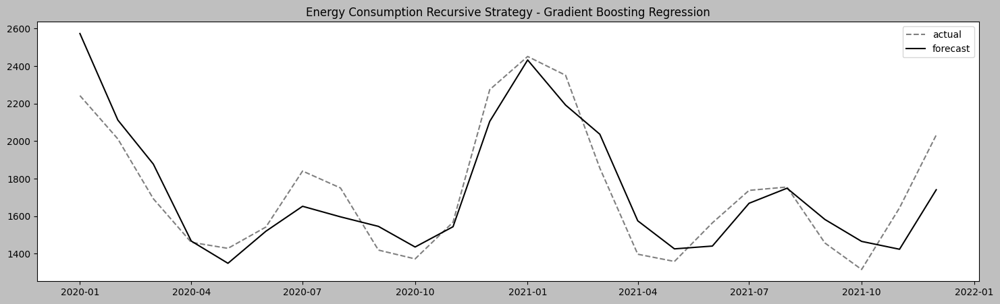

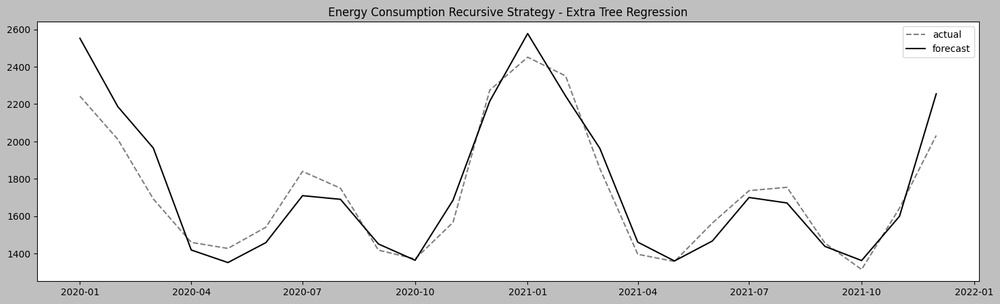

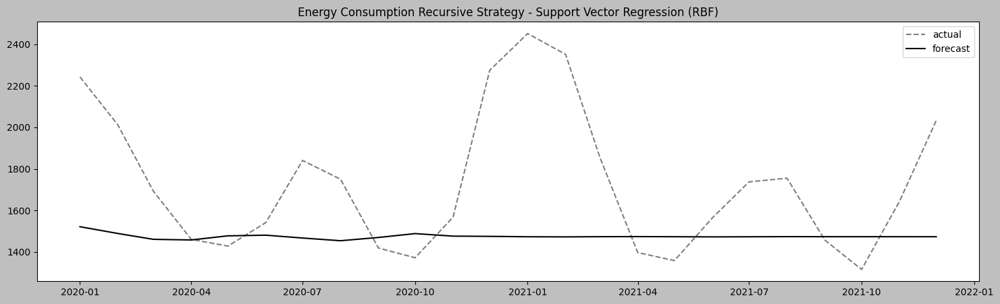

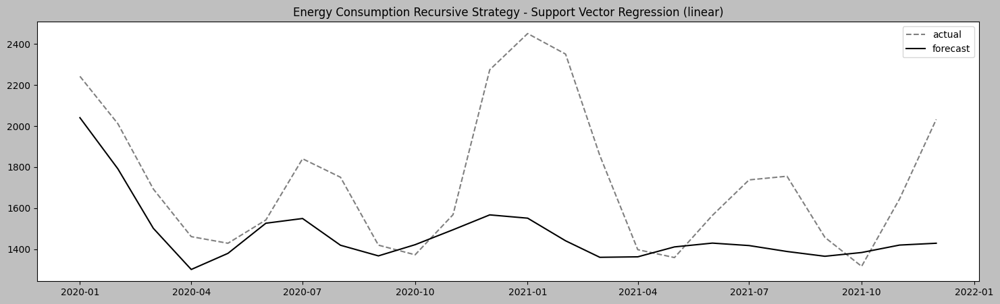

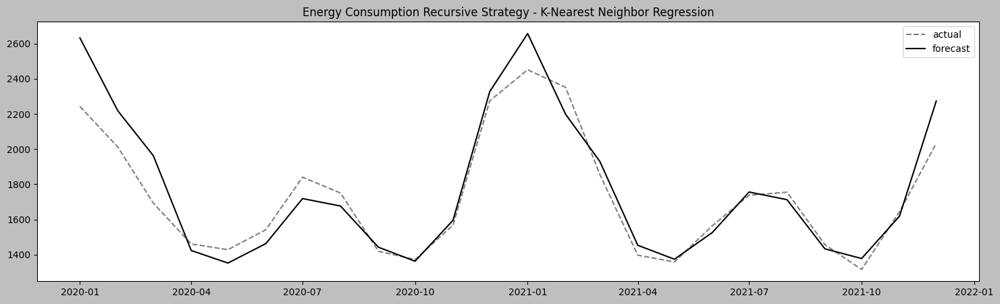

In [124]:
plot_results(en_results_df, 'Energy Consumption Recursive Strategy')

### Daily Temperature Plots

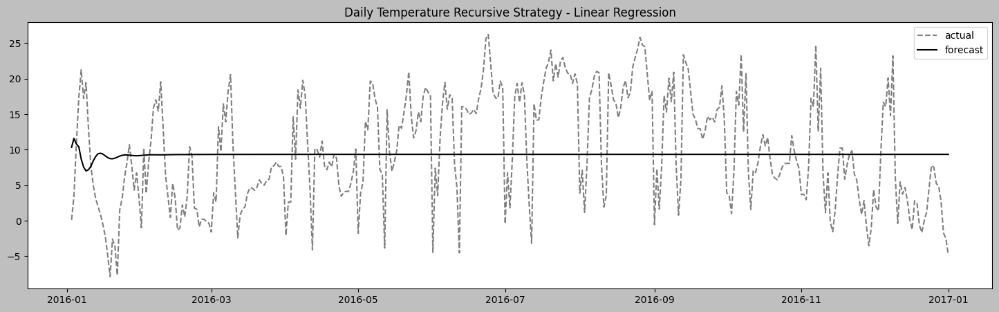

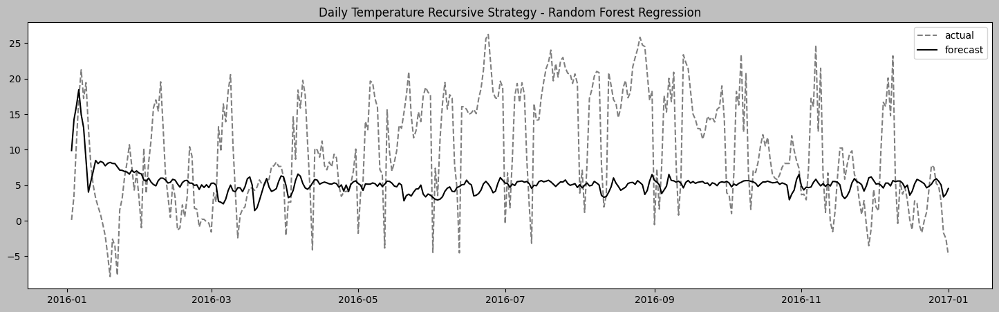

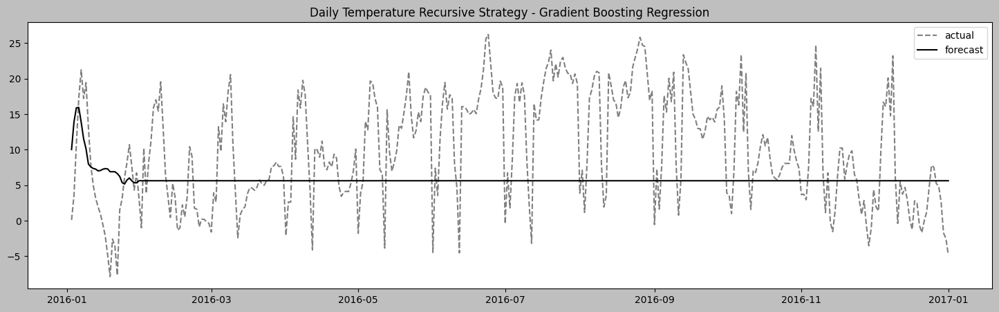

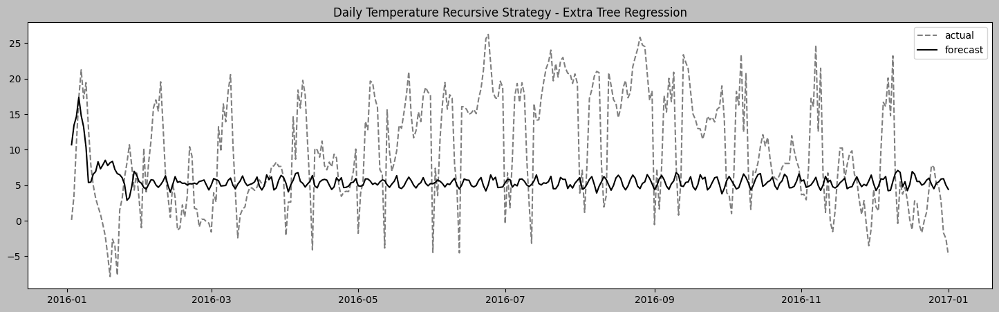

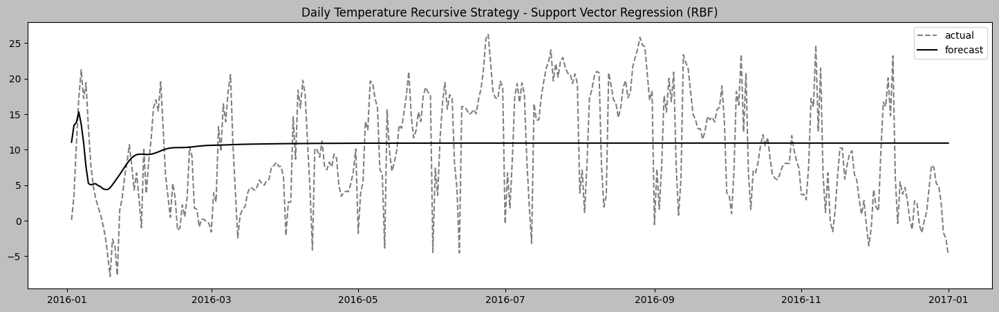

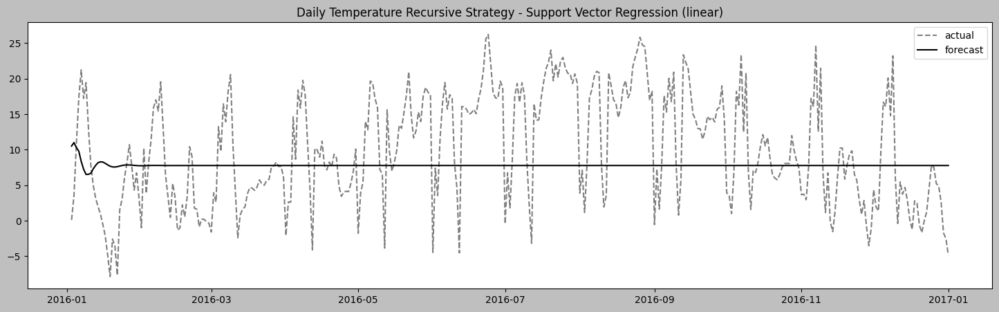

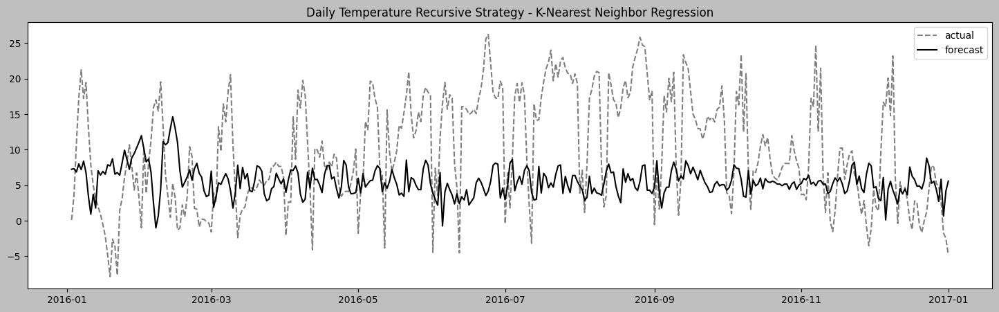

In [125]:
plot_results(dw_results_df, 'Daily Temperature Recursive Strategy')

## How it Works

### TabularRegressionForecaster Classes

In [126]:
make_reduction(RandomForestRegressor, strategy='recursive')

RecursiveTabularRegressionForecaster(estimator=<class 'sklearn.ensemble._forest.RandomForestRegressor'>)

In [127]:
make_reduction(RandomForestRegressor, strategy='multioutput')

MultioutputTabularRegressionForecaster(estimator=<class 'sklearn.ensemble._forest.RandomForestRegressor'>)

In [128]:
make_reduction(RandomForestRegressor, strategy='direct')

DirectTabularRegressionForecaster(estimator=<class 'sklearn.ensemble._forest.RandomForestRegressor'>)

```python
make_reduction(estimator, 
               strategy='recursive', 
               window_length=10, 
               scitype='infer')
```

## There is more

### Multioutput Strategy

In [129]:
# from sktime.forecasting.all import MultioutputTimeSeriesRegressionForecaster
from sklearn.multioutput import MultiOutputRegressor

def train_model(train, test, reg, reg_name, strategy):
    
        
    fh = ForecastingHorizon(test.index, is_relative=False)
    sklearn_pipeline = sklearn_make_pipeline(StandardScaler(), reg)
    
    try:
        forecaster = make_reduction(estimator=sklearn_pipeline, 
                                window_length=10, 
                                strategy=strategy)
        forecaster.fit(train, fh=fh)
        print(f'training {reg_name} ...')
    except:
        try:
            mo_reg = MultiOutputRegressor(sklearn_pipeline)
            forecaster = make_reduction(estimator=mo_reg, 
                                window_length=10, 
                                strategy=strategy)
            forecaster.fit(train, fh=fh)
            print(f'using MultiOutputRegressor for {reg_name} ...')
        except Exception as e:
            print(f'Failed for {reg_name}: {e}')
        
    yhat = forecaster.predict(fh)
    actual = test.copy()
    
    rmse_test = np.sqrt(mse(actual, yhat))
    mae_test = mae(actual, yhat)
    mape_test = mape(actual, yhat)
    mase_test = mase(actual, yhat, y_train=(train))

    model_metadata = {
        'Model Name': reg_name, 
        'Model': forecaster, 
        'RMSE': rmse_test, 
        'MAPE': mape_test,
        'MASE': mase_test,
        'MAE': mae_test,
        'yhat': yhat, 
        'actual': actual}
    
    return model_metadata

def train_different_models(train, test, regressors, strategy):
    results = []
    for reg_name, regressor in regressors.items():
        reg = regressor()
        results.append(train_model(train,
                                   test,
                                   reg,
                                   reg_name,
                                   strategy))
    return results

In [130]:
regressors

{'Linear Regression': sklearn.linear_model._base.LinearRegression,
 'Random Forest Regression': <function __main__.<lambda>()>,
 'Gradient Boosting Regression': <function __main__.<lambda>()>,
 'Extra Tree Regression': <function __main__.<lambda>()>,
 'Support Vector Regression (RBF)': <function __main__.<lambda>()>,
 'Support Vector Regression (linear)': <function __main__.<lambda>()>,
 'K-Nearest Neighbor Regression': <function __main__.<lambda>()>}

### Train multioutput

In [131]:
%%time
air_results_mo = train_different_models(train_air, 
                                        test_air, 
                                        regressors, 
                                        "multioutput")

training Linear Regression ...
training Random Forest Regression ...
using MultiOutputRegressor for Gradient Boosting Regression ...
training Extra Tree Regression ...
using MultiOutputRegressor for Support Vector Regression (RBF) ...
using MultiOutputRegressor for Support Vector Regression (linear) ...
training K-Nearest Neighbor Regression ...
CPU times: user 599 ms, sys: 5.93 ms, total: 605 ms
Wall time: 605 ms


In [132]:
%%time
en_results_mo = train_different_models(train_en, 
                                       test_en, 
                                       regressors, 
                                       "multioutput")

training Linear Regression ...
training Random Forest Regression ...
using MultiOutputRegressor for Gradient Boosting Regression ...
training Extra Tree Regression ...
using MultiOutputRegressor for Support Vector Regression (RBF) ...
using MultiOutputRegressor for Support Vector Regression (linear) ...
training K-Nearest Neighbor Regression ...
CPU times: user 3.85 s, sys: 33.8 ms, total: 3.89 s
Wall time: 3.92 s


In [133]:
%%time
dw_results_mo = train_different_models(train_dw, 
                                       test_dw, 
                                       regressors, 
                                       "multioutput")

training Linear Regression ...
training Random Forest Regression ...
using MultiOutputRegressor for Gradient Boosting Regression ...
training Extra Tree Regression ...
using MultiOutputRegressor for Support Vector Regression (RBF) ...
using MultiOutputRegressor for Support Vector Regression (linear) ...
training K-Nearest Neighbor Regression ...
CPU times: user 4min 32s, sys: 2.09 s, total: 4min 34s
Wall time: 4min 35s


### Evaluate

In [134]:
air_results_mo_df = pd.DataFrame(air_results_mo)
air_results_mo_sorted = evaluate_results(air_results_mo_df)
print(air_results_mo_sorted.head(3))

                           Model Name      MASE
0                   Linear Regression  0.800119
1  Support Vector Regression (linear)  1.169109
2        Gradient Boosting Regression  1.654544


In [135]:
en_results_mo_df = pd.DataFrame(en_results_mo)
en_results_mo_sorted = evaluate_results(en_results_mo_df)
print(en_results_mo_sorted.head(3))

                      Model Name      MASE
0       Random Forest Regression  0.328362
1          Extra Tree Regression  0.344888
2  K-Nearest Neighbor Regression  0.384354


In [136]:
dw_results_mo_df = pd.DataFrame(dw_results_mo)
dw_results_mo_sorted = evaluate_results(dw_results_mo_df)
print(dw_results_mo_sorted.head(3))

                        Model Name      MASE
0            Extra Tree Regression  1.492585
1  Support Vector Regression (RBF)  1.507306
2         Random Forest Regression  1.608000


### Plotting Forecasts

#### Air Passenger Plot

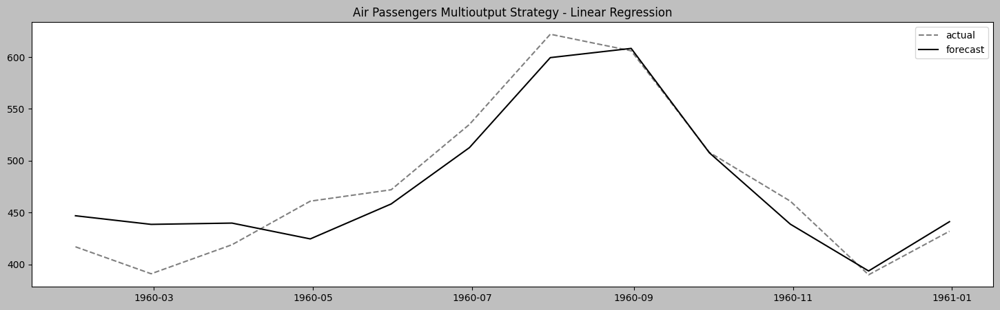

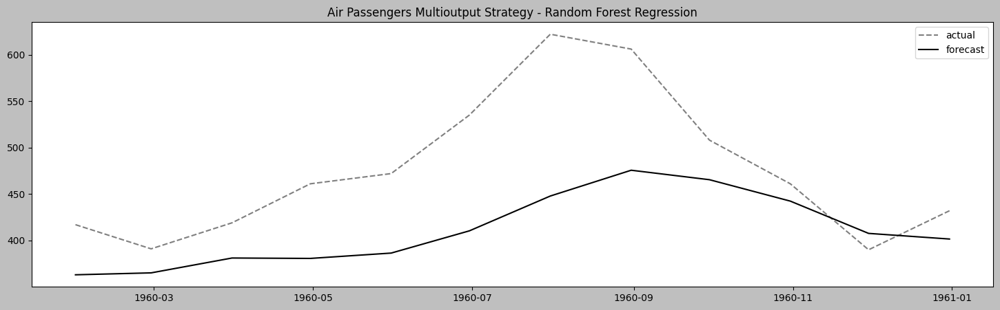

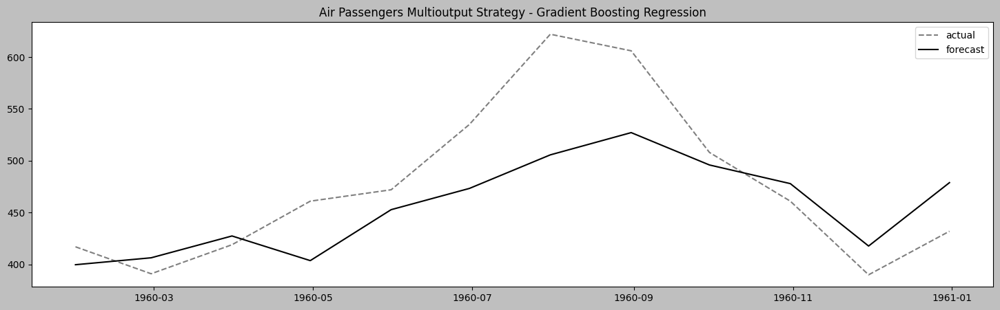

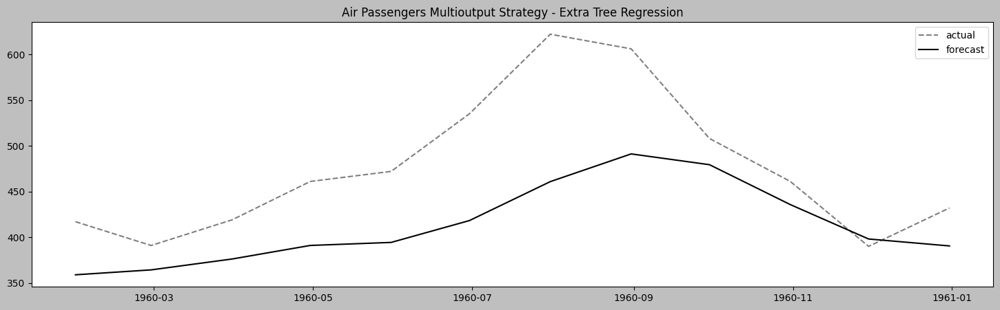

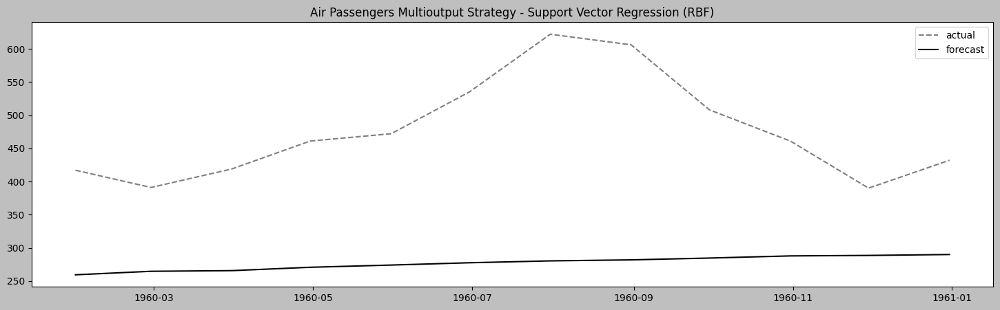

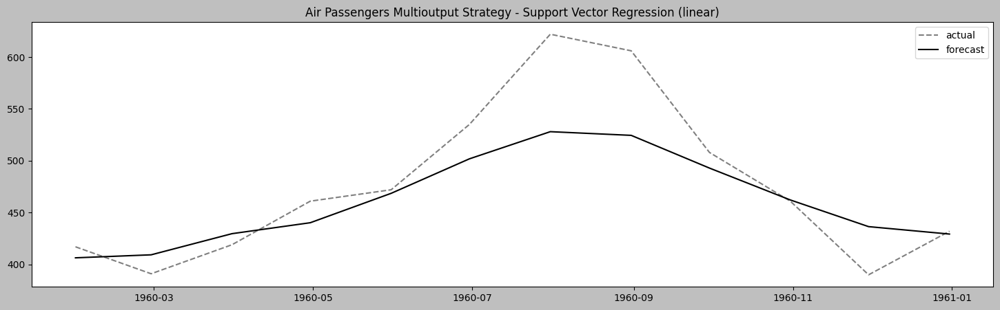

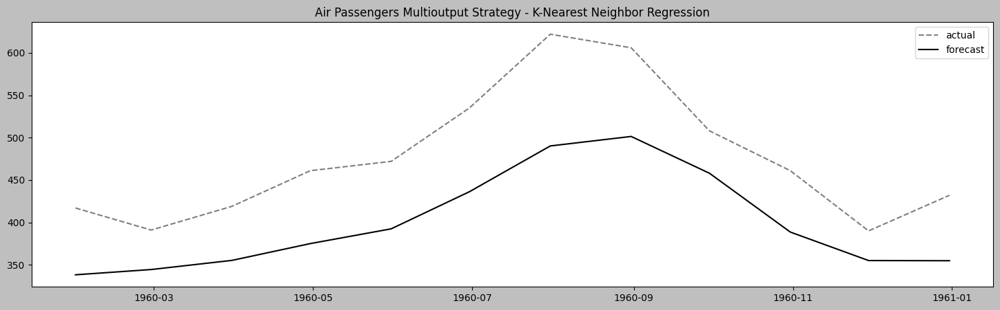

In [137]:
plot_results(air_results_mo_df, 'Air Passengers Multioutput Strategy')

#### Energy Consumption Plots

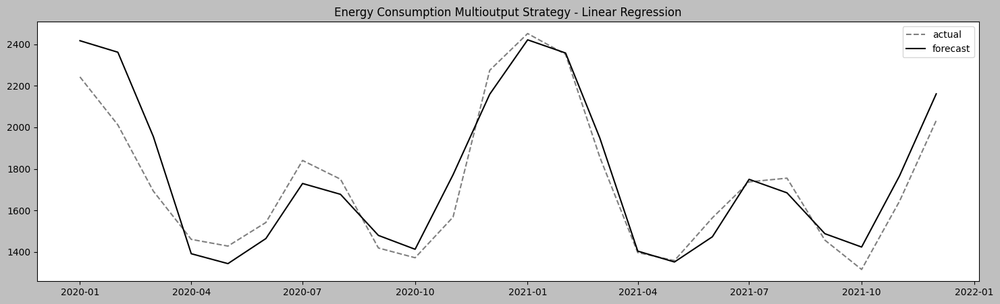

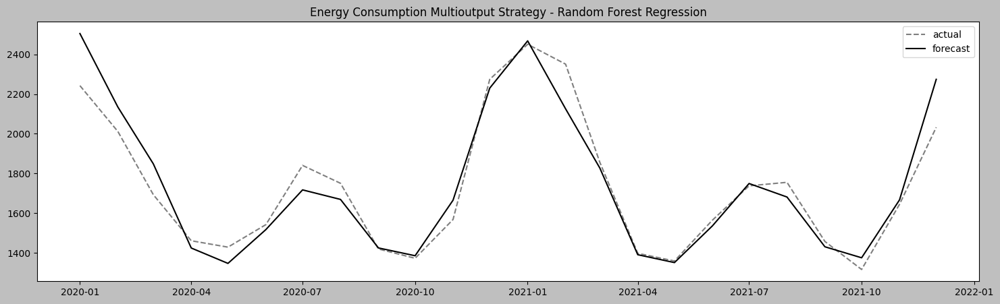

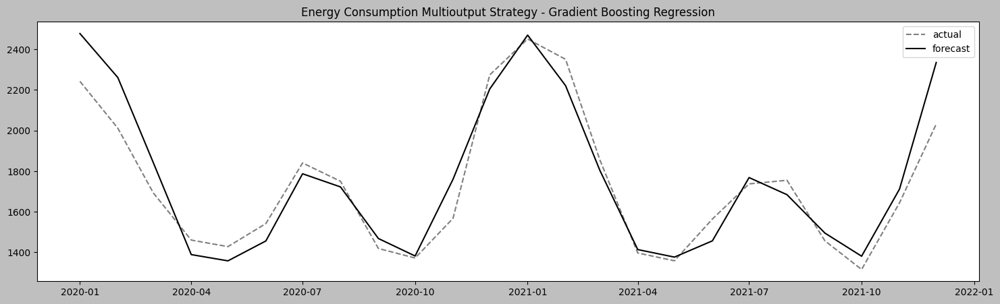

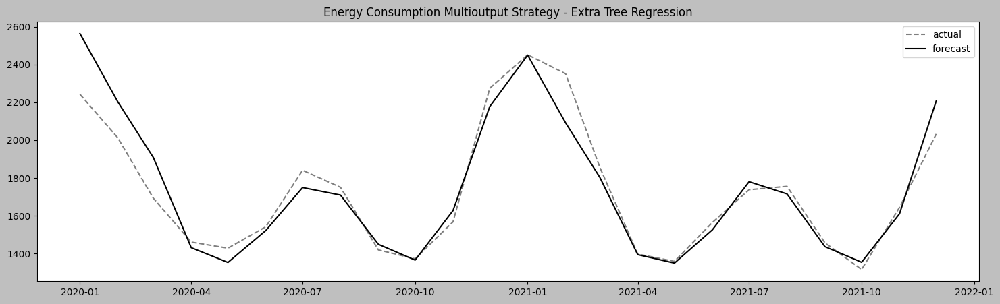

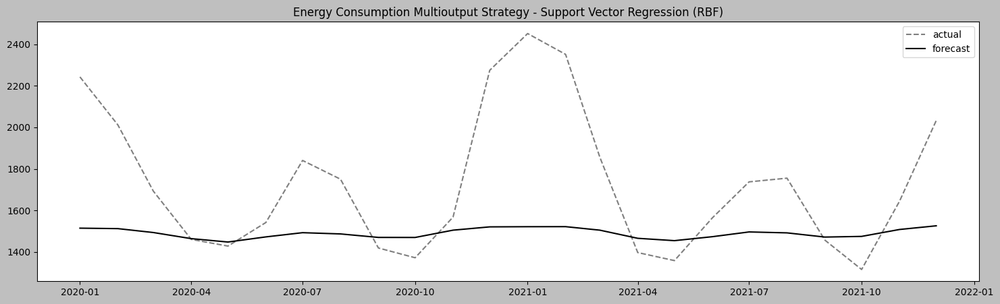

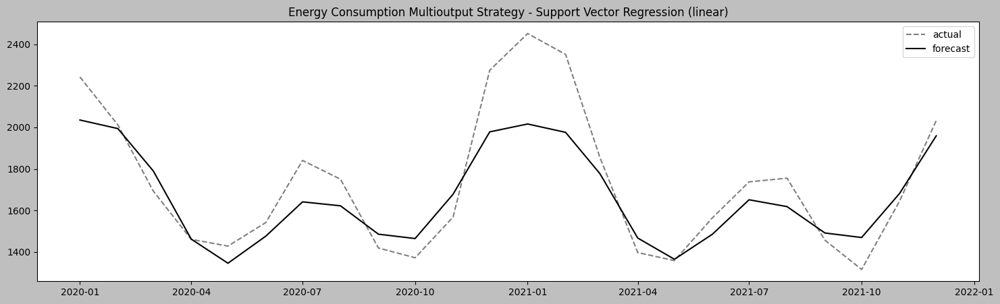

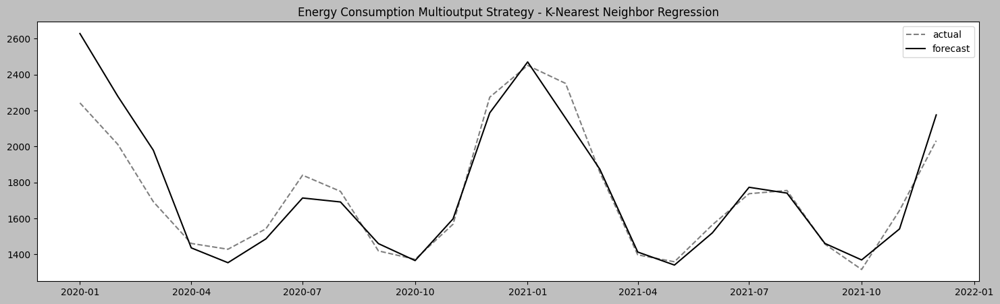

In [138]:
plot_results(en_results_mo_df, 'Energy Consumption Multioutput Strategy')

#### Daily Temperature Plots

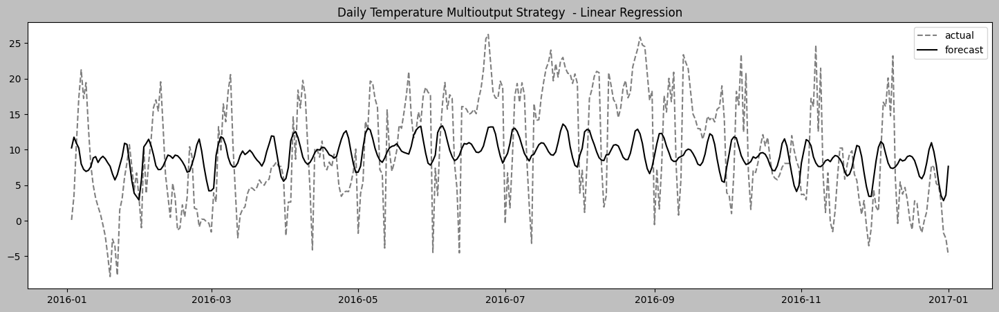

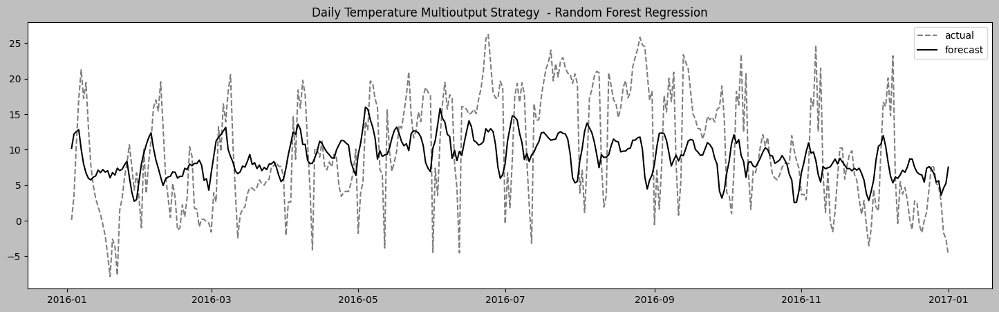

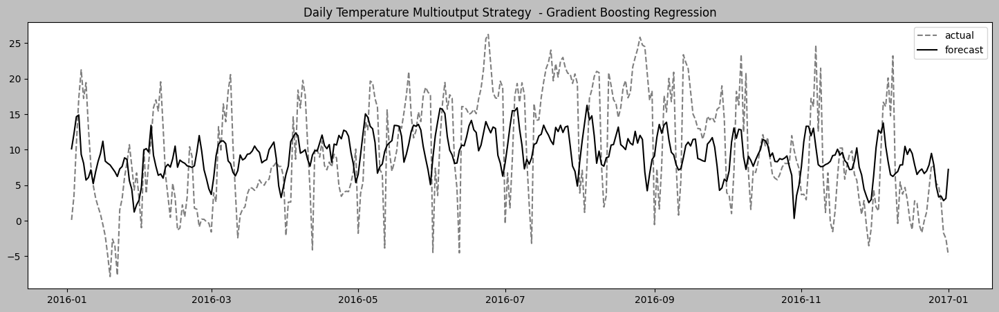

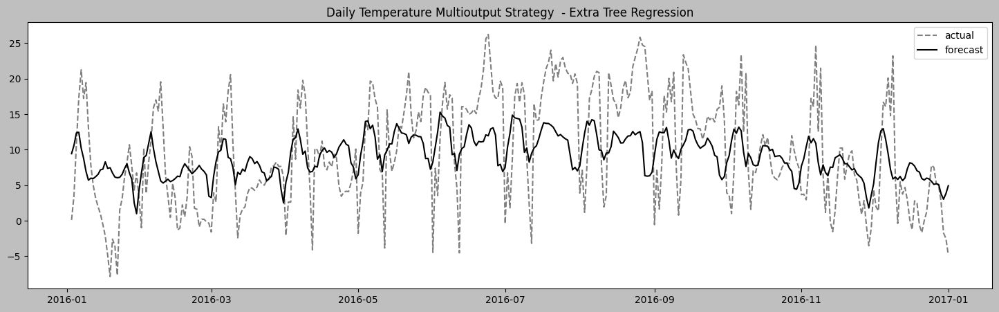

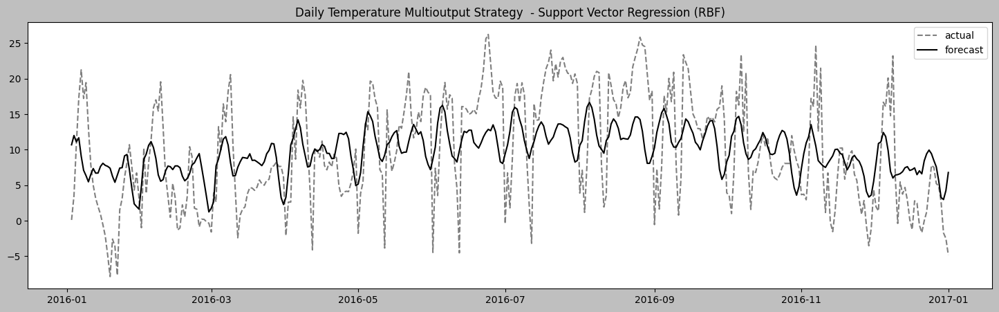

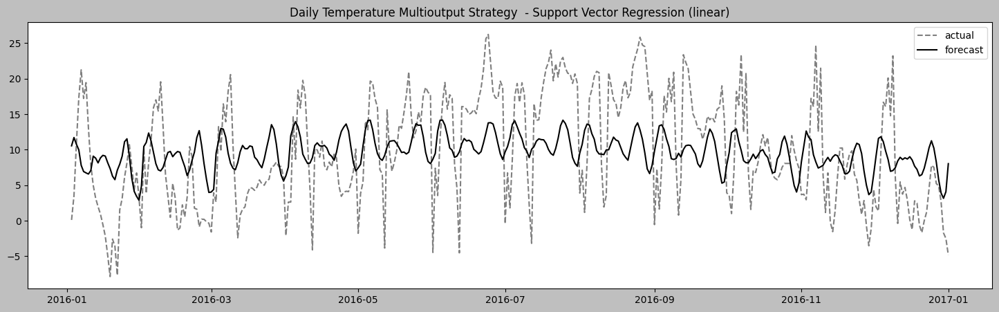

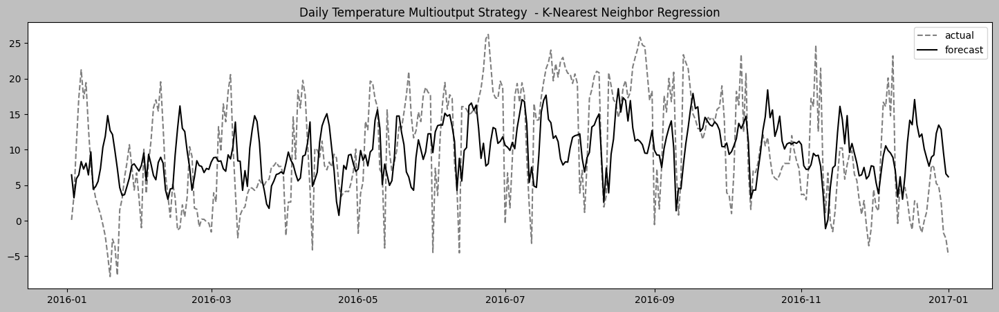

In [139]:
plot_results(dw_results_mo_df, 'Daily Temperature Multioutput Strategy ')

### Direct Strategy

### Train Direct

In [140]:
%%time
air_results_dir = train_different_models(train_air, 
                                         test_air, 
                                         regressors, 
                                         "direct")

training Linear Regression ...
training Random Forest Regression ...
training Gradient Boosting Regression ...
training Extra Tree Regression ...
training Support Vector Regression (RBF) ...
training Support Vector Regression (linear) ...
training K-Nearest Neighbor Regression ...
CPU times: user 1.73 s, sys: 18.4 ms, total: 1.75 s
Wall time: 1.76 s


In [141]:
%%time
dw_results_dir = train_different_models(train_dw, 
                                        test_dw, 
                                        regressors, 
                                        "direct")

training Linear Regression ...
training Random Forest Regression ...
training Gradient Boosting Regression ...
training Extra Tree Regression ...
training Support Vector Regression (RBF) ...
training Support Vector Regression (linear) ...
training K-Nearest Neighbor Regression ...
CPU times: user 14min 14s, sys: 8.53 s, total: 14min 23s
Wall time: 14min 26s


In [142]:
%%time
en_results_dir = train_different_models(train_en, 
                                        test_en, 
                                        regressors, 
                                        "direct")

training Linear Regression ...
training Random Forest Regression ...
training Gradient Boosting Regression ...
training Extra Tree Regression ...
training Support Vector Regression (RBF) ...
training Support Vector Regression (linear) ...
training K-Nearest Neighbor Regression ...
CPU times: user 11.3 s, sys: 117 ms, total: 11.4 s
Wall time: 11.5 s


In [143]:
air_results_dir_df = pd.DataFrame(air_results_dir)
air_results_dir_sorted = evaluate_results(air_results_dir_df)
print(air_results_dir_sorted.head(3))

                           Model Name      MASE
0                   Linear Regression  0.800119
1  Support Vector Regression (linear)  1.169109
2               Extra Tree Regression  1.434945


In [144]:
en_results_dir_df = pd.DataFrame(en_results_dir)
en_results_dir_sorted = evaluate_results(en_results_dir_df)
print(en_results_dir_sorted.head(3))

                      Model Name      MASE
0       Random Forest Regression  0.380342
1  K-Nearest Neighbor Regression  0.384354
2   Gradient Boosting Regression  0.398006


In [145]:
dw_results_dir_df = pd.DataFrame(dw_results_dir)
dw_results_dir_sorted = evaluate_results(dw_results_dir_df)
print(dw_results_dir_sorted.head(3))

                        Model Name      MASE
0  Support Vector Regression (RBF)  1.507306
1     Gradient Boosting Regression  1.630985
2            Extra Tree Regression  1.637348


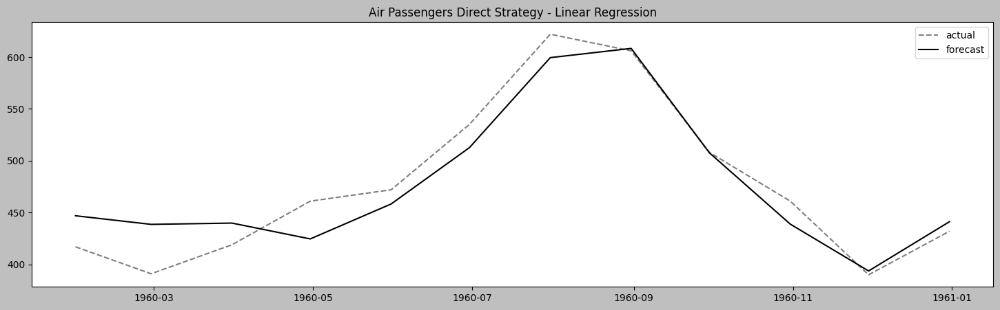

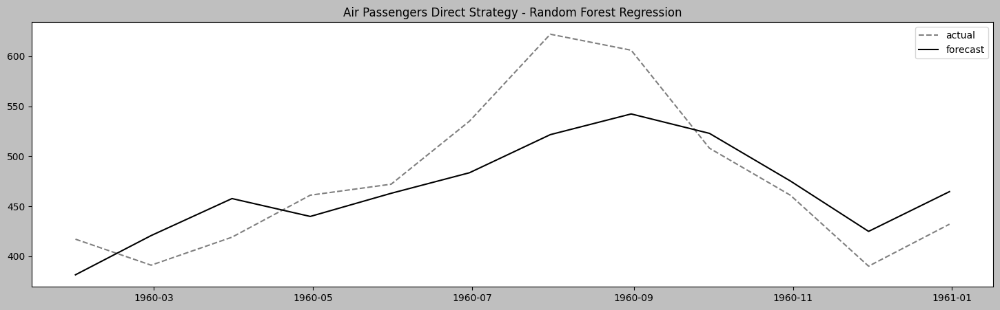

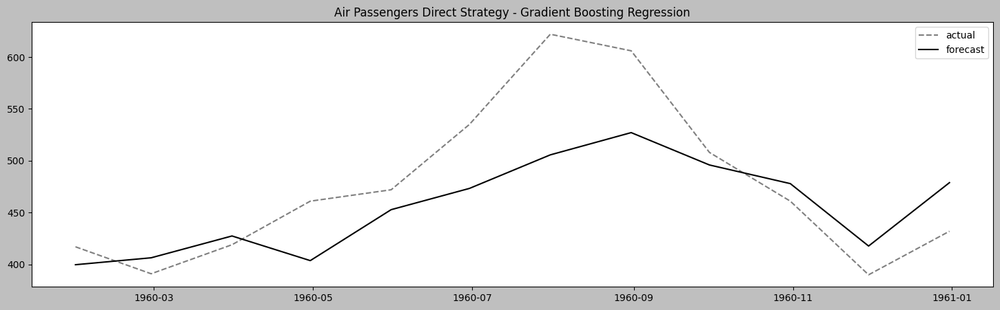

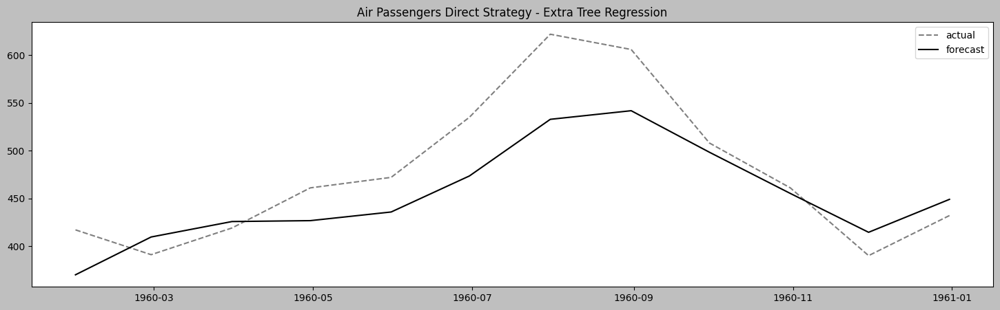

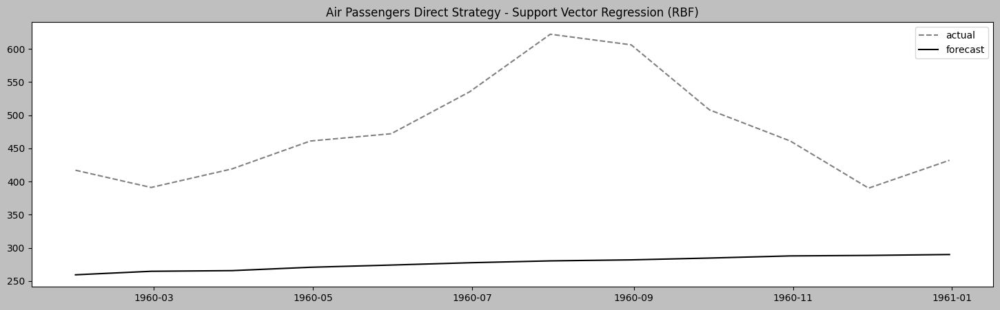

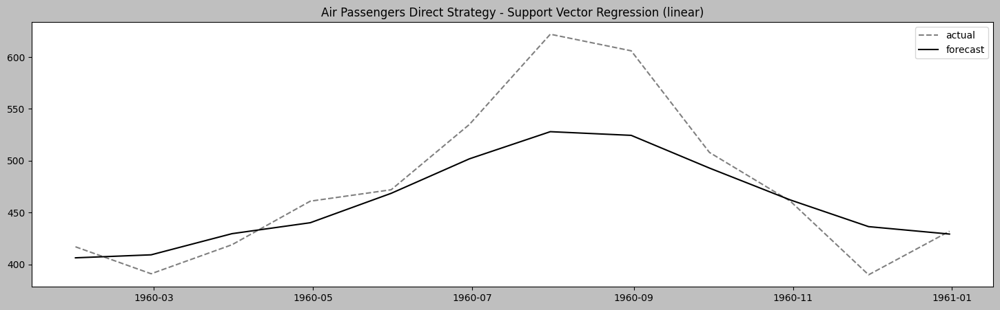

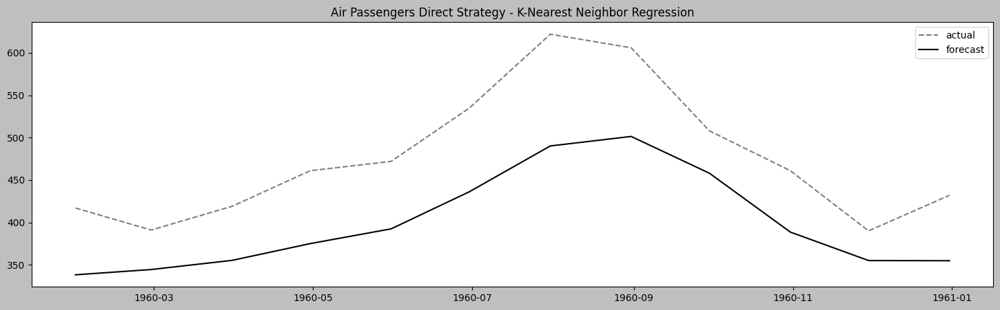

In [146]:
plot_results(air_results_dir_df, 'Air Passengers Direct Strategy')

# Recipe 5. Hyperparameter Tuning with sktime

In [147]:
from sktime.forecasting.all import (ForecastingGridSearchCV, 
                                    ExpandingWindowSplitter)

### Load Data
Assuming you ran the data preparation steps from previous recipe

In [188]:
# energy_df = energy.copy()
# air_df = air.copy()
# dw_df = daily_temp.copy()

# for df in [energy_df, air_df, dw_df]:
#     handle_missing_data(df)

# train_air, test_air = temporal_train_test_split(air_df,
#                                                 test_size=12)
# train_en, test_en = temporal_train_test_split(energy_df, 
#                                               test_size=24)
# train_dw, test_dw = temporal_train_test_split(dw_df, 
#                                               test_size=365)

In [148]:
print(f'Air Passengers train {len(train_air)} test {len(test_air)}')
print(f'Energy Consumption train {len(train_en)} test {len(test_en)}')
print(f'Daily Temperature {len(train_dw)} test {len(test_dw)}')

Air Passengers train 132 test 12
Energy Consumption train 564 test 24
Daily Temperature 2558 test 365


### Define the Grid Search
Example

In [149]:
# Random Forest parameters
rf_param_grid = {"n_estimators" : [100, 200],
                "max_depth": [10, 15],
                "min_samples_split": [2, 5, 10]}


# K-Nearest Neighbors parameters 
knn_param_grid = {"n_neighbors" : [3, 5, 7, 10],
                "weights": ['uniform', 'distance'],
                "p": [1, 2]}


# Support Vector Regressor parameters
svr_param_grid = {"kernel": ['linear', 'rbf', 'sigmoid']}


### Define the Regressors

In [150]:
regressors = { 
    'Random Forest Regressor': [RandomForestRegressor, rf_param_grid],
    'K-Nearest Neighbor Regressor': [KNeighborsRegressor, knn_param_grid],
    'Support Vector Regression': [SVR, svr_param_grid]
}

In [151]:
ForecastingHorizon(test_air.index, is_relative=False)

ForecastingHorizon(['1960-01-31', '1960-02-29', '1960-03-31', '1960-04-30',
               '1960-05-31', '1960-06-30', '1960-07-31', '1960-08-31',
               '1960-09-30', '1960-10-31', '1960-11-30', '1960-12-31'],
              dtype='datetime64[ns]', freq='ME', is_relative=False)

## Training

In [152]:
def train_model(train, test, reg, reg_name, param_grid):

    # Full forecasting horizon for prediction
    fh = ForecastingHorizon(test.index, is_relative=False)
    
    # Multi-step horizon for CV
    fh_cv = np.arange(1, min(30, len(test) + 1))
    
    sklearn_pipeline = sklearn_make_pipeline(StandardScaler(), reg)

    # Define a 3-fold expanding window CV cross-validation strategy
    initial_window = max(50, len(train) // 3)
    remaining_length = len(train) - initial_window
    step_length = max(1, (remaining_length - len(test)) // 2)  
    
    cv = ExpandingWindowSplitter(initial_window=initial_window, 
                                 step_length=step_length, 
                                 fh=fh_cv)
    
    try:
        # Wrap the regressor in a MultiOutputRegressor
        m_reg = MultiOutputRegressor(sklearn_pipeline)
        forecaster = make_reduction(estimator=m_reg, 
                                window_length=10, # 10 lags, adjustable
                                strategy="multioutput")

        # Perform grid search with cross-validation
        gscv = ForecastingGridSearchCV(
                        forecaster=forecaster,
                        param_grid=param_grid,
                        cv=cv,
                        verbose=1)

        gscv.fit(train, fh=fh)
        print(f'Grid Search CV using MultiOutputRegressor for {reg_name} ...')
    except Exception as e:
        print(f'Failed for {reg_name}: {e}')
        return
    
    # Generate predictions and evaluate
    yhat = gscv.predict(fh)
    actual = test.copy()
    
    # Evaluate model performance using various metrics     
    rmse_test = np.sqrt(mse(actual, yhat))
    mae_test = mae(actual, yhat)
    mape_test = mape(actual, yhat)
    mase_test = mase(actual, yhat, y_train=(train))

    model_metadata = {
        'Model Name': reg_name, 
        'Model': gscv, 
        'RMSE': rmse_test, 
        'MAPE': mape_test,
        'MASE': mase_test,
        'MAE': mae_test,
        'yhat': yhat, 
        'actual': actual}
    
    return model_metadata

def train_different_models(train, test, regressors):
    results = []
    for reg_name, regressor in regressors.items():
        reg = regressor[0]()
        param_grid = regressor[1]
        results.append(train_model(train,
                                   test,
                                   reg,
                                   reg_name, 
                                   param_grid))
    return results

In [153]:
%%time
air_results_gs = train_different_models(train_air, 
                                        test_air, 
                                        regressors)

Fitting 3 folds for each of 12 candidates, totalling 36 fits


/Users/tarekatwan/Repos/MyWork/Write/Time-Series-Analysis-with-Python-Cookbook-Second-Edition/code/Ch12/dev1/lib/python3.13/site-packages/sktime/forecasting/base/_fh.py:860: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  return r * to_offset(fh.freq)
/Users/tarekatwan/Repos/MyWork/Write/Time-Series-Analysis-with-Python-Cookbook-Second-Edition/code/Ch12/dev1/lib/python3.13/site-packages/sktime/forecasting/base/_fh.py:874: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  absolute = pd.DatetimeIndex(absolute, freq=fh.freq)
/Users/tarekatwan/Repos/MyWork/Write/Time-Series-Analysis-with-Python-Cookbook-Second-Edition/code/Ch12/dev1/lib/python3.13/site-packages/sktime/forecasting/base/_fh.py:860: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  return r * to_offset(fh.freq)
/Users/tarekatwan/Repos/MyWork/Write/Time-Series-Analysis-with-

Grid Search CV using MultiOutputRegressor for Random Forest Regressor ...
Fitting 3 folds for each of 16 candidates, totalling 48 fits


/Users/tarekatwan/Repos/MyWork/Write/Time-Series-Analysis-with-Python-Cookbook-Second-Edition/code/Ch12/dev1/lib/python3.13/site-packages/sktime/forecasting/base/_fh.py:860: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  return r * to_offset(fh.freq)
/Users/tarekatwan/Repos/MyWork/Write/Time-Series-Analysis-with-Python-Cookbook-Second-Edition/code/Ch12/dev1/lib/python3.13/site-packages/sktime/forecasting/base/_fh.py:874: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  absolute = pd.DatetimeIndex(absolute, freq=fh.freq)
/Users/tarekatwan/Repos/MyWork/Write/Time-Series-Analysis-with-Python-Cookbook-Second-Edition/code/Ch12/dev1/lib/python3.13/site-packages/sktime/forecasting/base/_fh.py:860: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  return r * to_offset(fh.freq)
/Users/tarekatwan/Repos/MyWork/Write/Time-Series-Analysis-with-

Grid Search CV using MultiOutputRegressor for K-Nearest Neighbor Regressor ...
Fitting 3 folds for each of 3 candidates, totalling 9 fits
Grid Search CV using MultiOutputRegressor for Support Vector Regression ...
CPU times: user 1.61 s, sys: 365 ms, total: 1.98 s
Wall time: 9.66 s


/Users/tarekatwan/Repos/MyWork/Write/Time-Series-Analysis-with-Python-Cookbook-Second-Edition/code/Ch12/dev1/lib/python3.13/site-packages/sktime/forecasting/base/_fh.py:860: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  return r * to_offset(fh.freq)
/Users/tarekatwan/Repos/MyWork/Write/Time-Series-Analysis-with-Python-Cookbook-Second-Edition/code/Ch12/dev1/lib/python3.13/site-packages/sktime/forecasting/base/_fh.py:874: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  absolute = pd.DatetimeIndex(absolute, freq=fh.freq)
/Users/tarekatwan/Repos/MyWork/Write/Time-Series-Analysis-with-Python-Cookbook-Second-Edition/code/Ch12/dev1/lib/python3.13/site-packages/sktime/forecasting/base/_fh.py:860: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  return r * to_offset(fh.freq)
/Users/tarekatwan/Repos/MyWork/Write/Time-Series-Analysis-with-

In [154]:
%%time
en_results_gs = train_different_models(train_en, 
                                       test_en, 
                                       regressors)

Fitting 3 folds for each of 12 candidates, totalling 36 fits
Grid Search CV using MultiOutputRegressor for Random Forest Regressor ...
Fitting 3 folds for each of 16 candidates, totalling 48 fits
Grid Search CV using MultiOutputRegressor for K-Nearest Neighbor Regressor ...
Fitting 3 folds for each of 3 candidates, totalling 9 fits
Grid Search CV using MultiOutputRegressor for Support Vector Regression ...
CPU times: user 11 s, sys: 202 ms, total: 11.2 s
Wall time: 43.1 s


In [156]:
%%time
dw_results_gs = train_different_models(train_dw, 
                                       test_dw, 
                                       regressors)

Fitting 3 folds for each of 12 candidates, totalling 36 fits
Grid Search CV using MultiOutputRegressor for Random Forest Regressor ...
Fitting 3 folds for each of 16 candidates, totalling 48 fits
Grid Search CV using MultiOutputRegressor for K-Nearest Neighbor Regressor ...
Fitting 3 folds for each of 3 candidates, totalling 9 fits
Grid Search CV using MultiOutputRegressor for Support Vector Regression ...
CPU times: user 22min 47s, sys: 10.3 s, total: 22min 57s
Wall time: 26min 20s


## Evaluating models and inspect parameters

In [157]:
# gscv = ForecastingGridSearchCV(
#     forecaster=forecaster,
#     param_grid=param_grid,
#     cv=cv,
#     verbose=1)

In [158]:
def get_best_params(df):
    for row in df.iterrows():
        print(row[1]['Model Name'])
        display(row[1]['Model'])
        print(row[1]['Model'].best_params_)
        display(row[1]['Model'].best_forecaster_)

In [159]:
air_results_gs_df = pd.DataFrame(air_results_gs)
get_best_params(air_results_gs_df)

Random Forest Regressor


ForecastingGridSearchCV(cv=ExpandingWindowSplitter(fh=array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12]),
                                                   initial_window=50,
                                                   step_length=35),
                        forecaster=MultioutputTabularRegressionForecaster(estimator=MultiOutputRegressor(estimator=Pipeline(steps=[('standardscaler',
                                                StandardScaler()),
                                               ('randomforestregressor',
                                                RandomForestRegressor())]))),
                        param_grid={'max_depth': [10, 15],
                                    'min_samples_split': [2, 5, 10],
                                    'n_estimators': [100, 200]},
                        verbose=1)

{'max_depth': 15, 'min_samples_split': 2, 'n_estimators': 100}


MultioutputTabularRegressionForecaster(estimator=MultiOutputRegressor(estimator=Pipeline(steps=[('standardscaler',
                                                StandardScaler()),
                                               ('randomforestregressor',
                                                RandomForestRegressor(max_depth=15))])))

K-Nearest Neighbor Regressor


ForecastingGridSearchCV(cv=ExpandingWindowSplitter(fh=array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12]),
                                                   initial_window=50,
                                                   step_length=35),
                        forecaster=MultioutputTabularRegressionForecaster(estimator=MultiOutputRegressor(estimator=Pipeline(steps=[('standardscaler',
                                                StandardScaler()),
                                               ('kneighborsregressor',
                                                KNeighborsRegressor())]))),
                        param_grid={'n_neighbors': [3, 5, 7, 10], 'p': [1, 2],
                                    'weights': ['uniform', 'distance']},
                        verbose=1)

{'n_neighbors': 3, 'p': 1, 'weights': 'distance'}


MultioutputTabularRegressionForecaster(estimator=MultiOutputRegressor(estimator=Pipeline(steps=[('standardscaler',
                                                StandardScaler()),
                                               ('kneighborsregressor',
                                                KNeighborsRegressor(n_neighbors=3,
                                                                    p=1,
                                                                    weights='distance'))])))

Support Vector Regression


ForecastingGridSearchCV(cv=ExpandingWindowSplitter(fh=array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12]),
                                                   initial_window=50,
                                                   step_length=35),
                        forecaster=MultioutputTabularRegressionForecaster(estimator=MultiOutputRegressor(estimator=Pipeline(steps=[('standardscaler',
                                                StandardScaler()),
                                               ('svr', SVR())]))),
                        param_grid={'kernel': ['linear', 'rbf', 'sigmoid']},
                        verbose=1)

{'kernel': 'linear'}


MultioutputTabularRegressionForecaster(estimator=MultiOutputRegressor(estimator=Pipeline(steps=[('standardscaler',
                                                StandardScaler()),
                                               ('svr', SVR(kernel='linear'))])))

In [160]:
en_results_gs_df = pd.DataFrame(en_results_gs)
get_best_params(en_results_gs_df)

Random Forest Regressor


ForecastingGridSearchCV(cv=ExpandingWindowSplitter(fh=array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24]),
                                                   initial_window=188,
                                                   step_length=176),
                        forecaster=MultioutputTabularRegressionForecaster(estimator=MultiOutputRegressor(estimator=Pipeline(steps=[('standardscaler',
                                                StandardScaler()),
                                               ('randomforestregressor',
                                                RandomForestRegressor())]))),
                        param_grid={'max_depth': [10, 15],
                                    'min_samples_split': [2, 5, 10],
                                    'n_estimators': [100, 200]},
                        verbose=1)

{'max_depth': 15, 'min_samples_split': 2, 'n_estimators': 100}


MultioutputTabularRegressionForecaster(estimator=MultiOutputRegressor(estimator=Pipeline(steps=[('standardscaler',
                                                StandardScaler()),
                                               ('randomforestregressor',
                                                RandomForestRegressor(max_depth=15))])))

K-Nearest Neighbor Regressor


ForecastingGridSearchCV(cv=ExpandingWindowSplitter(fh=array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24]),
                                                   initial_window=188,
                                                   step_length=176),
                        forecaster=MultioutputTabularRegressionForecaster(estimator=MultiOutputRegressor(estimator=Pipeline(steps=[('standardscaler',
                                                StandardScaler()),
                                               ('kneighborsregressor',
                                                KNeighborsRegressor())]))),
                        param_grid={'n_neighbors': [3, 5, 7, 10], 'p': [1, 2],
                                    'weights': ['uniform', 'distance']},
                        verbose=1)

{'n_neighbors': 3, 'p': 2, 'weights': 'distance'}


MultioutputTabularRegressionForecaster(estimator=MultiOutputRegressor(estimator=Pipeline(steps=[('standardscaler',
                                                StandardScaler()),
                                               ('kneighborsregressor',
                                                KNeighborsRegressor(n_neighbors=3,
                                                                    weights='distance'))])))

Support Vector Regression


ForecastingGridSearchCV(cv=ExpandingWindowSplitter(fh=array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24]),
                                                   initial_window=188,
                                                   step_length=176),
                        forecaster=MultioutputTabularRegressionForecaster(estimator=MultiOutputRegressor(estimator=Pipeline(steps=[('standardscaler',
                                                StandardScaler()),
                                               ('svr', SVR())]))),
                        param_grid={'kernel': ['linear', 'rbf', 'sigmoid']},
                        verbose=1)

{'kernel': 'linear'}


MultioutputTabularRegressionForecaster(estimator=MultiOutputRegressor(estimator=Pipeline(steps=[('standardscaler',
                                                StandardScaler()),
                                               ('svr', SVR(kernel='linear'))])))

In [161]:
dw_results_gs_df = pd.DataFrame(dw_results_gs)
get_best_params(dw_results_gs_df)

Random Forest Regressor


ForecastingGridSearchCV(cv=ExpandingWindowSplitter(fh=array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29]),
                                                   initial_window=852,
                                                   step_length=670),
                        forecaster=MultioutputTabularRegressionForecaster(estimator=MultiOutputRegressor(estimator=Pipeline(steps=[('standardscaler',
                                                StandardScaler()),
                                               ('randomforestregressor',
                                                RandomForestRegressor())]))),
                        param_grid={'max_depth': [10, 15],
                                    'min_samples_split': [2, 5, 10],
                                    'n_estimators': [100, 200]},
                        verbose=1)

{'max_depth': 10, 'min_samples_split': 2, 'n_estimators': 200}


MultioutputTabularRegressionForecaster(estimator=MultiOutputRegressor(estimator=Pipeline(steps=[('standardscaler',
                                                StandardScaler()),
                                               ('randomforestregressor',
                                                RandomForestRegressor(max_depth=10,
                                                                      n_estimators=200))])))

K-Nearest Neighbor Regressor


ForecastingGridSearchCV(cv=ExpandingWindowSplitter(fh=array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29]),
                                                   initial_window=852,
                                                   step_length=670),
                        forecaster=MultioutputTabularRegressionForecaster(estimator=MultiOutputRegressor(estimator=Pipeline(steps=[('standardscaler',
                                                StandardScaler()),
                                               ('kneighborsregressor',
                                                KNeighborsRegressor())]))),
                        param_grid={'n_neighbors': [3, 5, 7, 10], 'p': [1, 2],
                                    'weights': ['uniform', 'distance']},
                        verbose=1)

{'n_neighbors': 7, 'p': 1, 'weights': 'uniform'}


MultioutputTabularRegressionForecaster(estimator=MultiOutputRegressor(estimator=Pipeline(steps=[('standardscaler',
                                                StandardScaler()),
                                               ('kneighborsregressor',
                                                KNeighborsRegressor(n_neighbors=7,
                                                                    p=1))])))

Support Vector Regression


ForecastingGridSearchCV(cv=ExpandingWindowSplitter(fh=array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29]),
                                                   initial_window=852,
                                                   step_length=670),
                        forecaster=MultioutputTabularRegressionForecaster(estimator=MultiOutputRegressor(estimator=Pipeline(steps=[('standardscaler',
                                                StandardScaler()),
                                               ('svr', SVR())]))),
                        param_grid={'kernel': ['linear', 'rbf', 'sigmoid']},
                        verbose=1)

{'kernel': 'rbf'}


MultioutputTabularRegressionForecaster(estimator=MultiOutputRegressor(estimator=Pipeline(steps=[('standardscaler',
                                                StandardScaler()),
                                               ('svr', SVR())])))

In [162]:
def evaluate_results(results, by='MASE'):
    cols = ['Model Name', by]
    df_sorted = results[cols].sort_values(by).reset_index(drop=True)
    return df_sorted

In [163]:
air_results_gs_sorted = evaluate_results(air_results_gs_df)
print(air_results_gs_sorted)

                     Model Name      MASE
0     Support Vector Regression  1.169109
1       Random Forest Regressor  1.577225
2  K-Nearest Neighbor Regressor  2.672546


In [164]:
en_results_gs_sorted = evaluate_results(en_results_gs_df)
print(en_results_gs_sorted)

                     Model Name      MASE
0       Random Forest Regressor  0.392807
1  K-Nearest Neighbor Regressor  0.480424
2     Support Vector Regression  0.534361


In [165]:
dw_results_gs_sorted = evaluate_results(dw_results_gs_df)
print(dw_results_gs_sorted)

                     Model Name      MASE
0     Support Vector Regression  1.507306
1  K-Nearest Neighbor Regressor  1.630997
2       Random Forest Regressor  1.661739


### Air Passenger Plot

In [166]:
def plot_results(results, data_name):
    cols = ['yhat', 'actual', 'Model Name']
    for row in results[cols].iterrows():
        yhat, actual, name = row[1]
        plt.title(f'{data_name} - {name}')
        plt.plot(actual, 'k--', alpha=0.5)
        plt.plot(yhat, 'k')
        plt.legend(['actual', 'forecast'])
        plt.show()

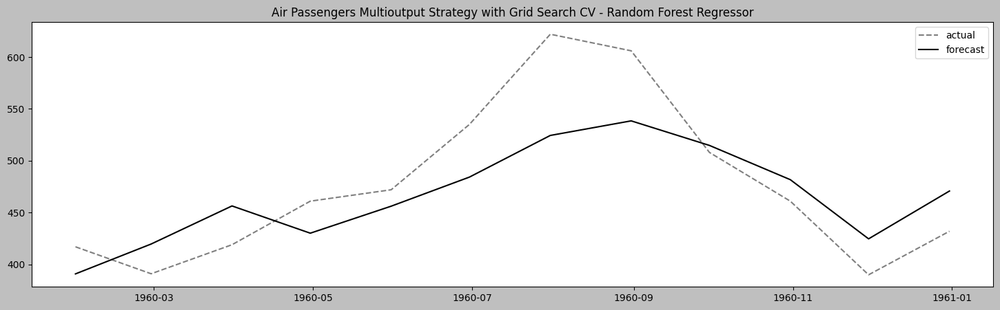

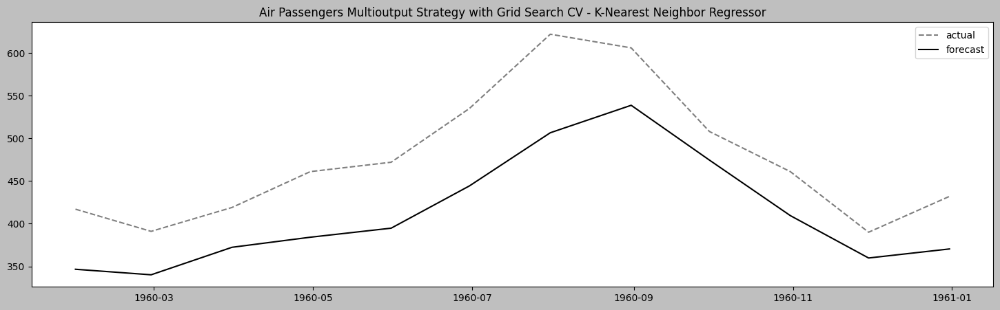

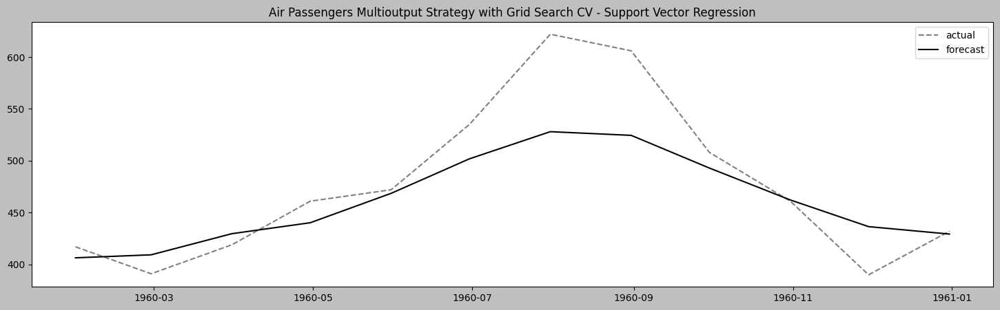

In [167]:
plot_results(air_results_gs_df, 'Air Passengers Multioutput Strategy with Grid Search CV')

### Energy Consumption Plot

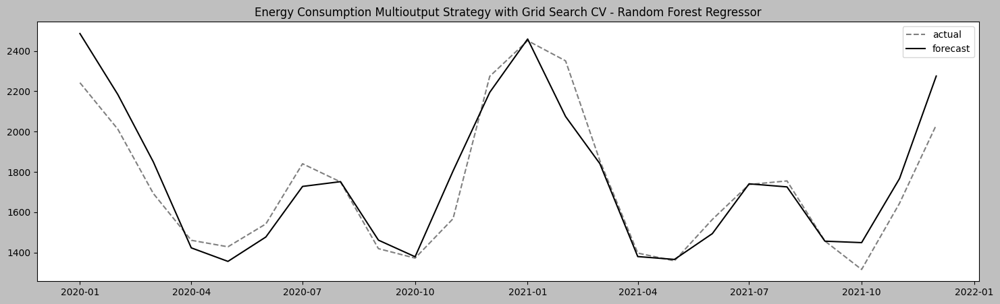

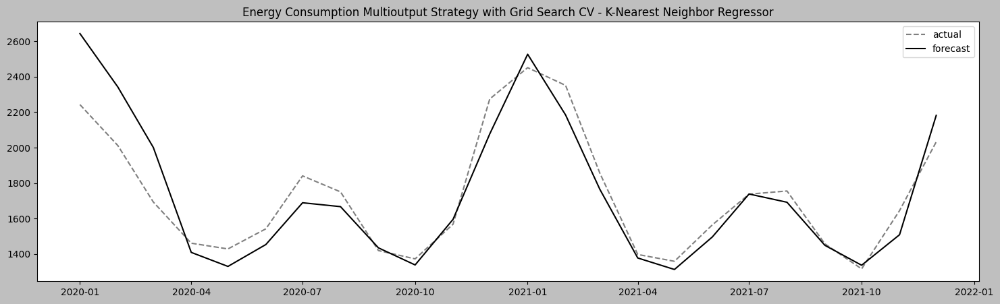

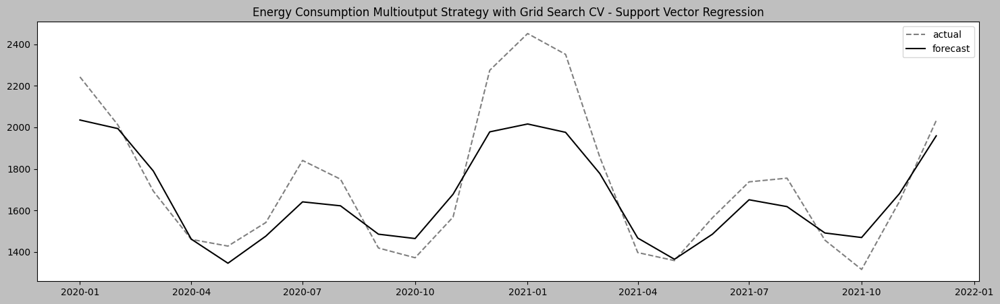

In [168]:
plot_results(en_results_gs_df, 'Energy Consumption Multioutput Strategy with Grid Search CV')

### Daily Temperature

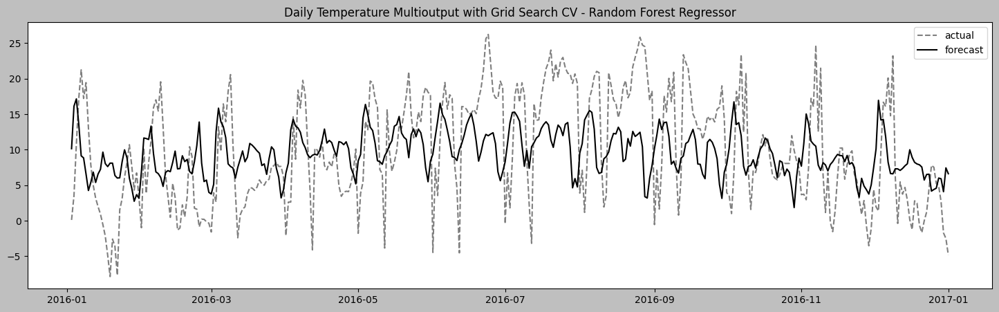

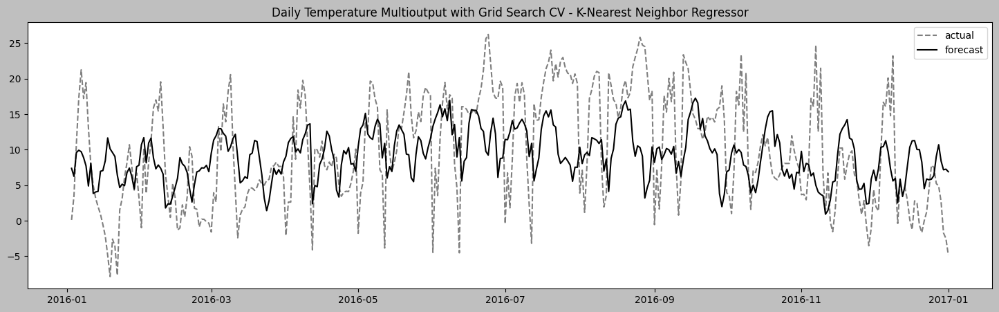

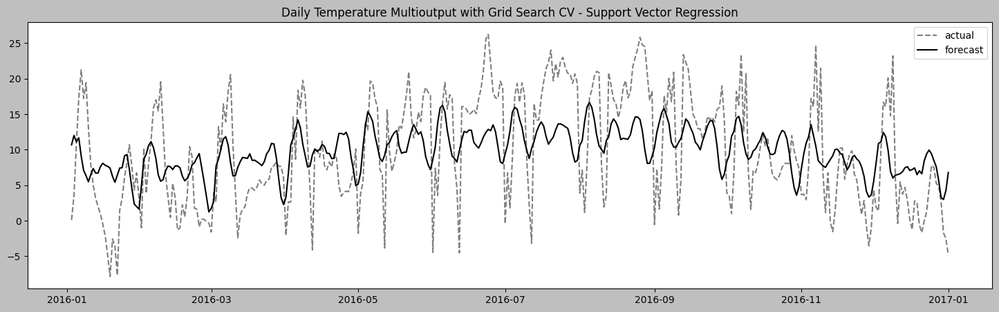

In [169]:
plot_results(dw_results_gs_df, 'Daily Temperature Multioutput with Grid Search CV')

## There is more

```python
from sktime.performance_metrics.forecasting import MeanSquaredError


gscv = ForecastingGridSearchCV(
    forecaster=forecaster,
    param_grid=param_grid,
    cv=cv,
    scoring=mse,
    verbose=1)
```

In [170]:
from sktime.registry import all_estimators
all_estimators("forecaster", as_dataframe=True)

,name,object
0,ARCH,<class 'sktime.forecasting.arch._uarch.ARCH'>
1,ARDL,<class 'sktime.forecasting.ardl.ARDL'>
2,ARIMA,<class 'sktime.forecasting.arima._pmdarima.ARI...
3,AutoARIMA,<class 'sktime.forecasting.arima._pmdarima.Aut...
4,AutoETS,<class 'sktime.forecasting.ets.AutoETS'>
...,...,...
119,VAR,<class 'sktime.forecasting.var.VAR'>
120,VARMAX,<class 'sktime.forecasting.varmax.VARMAX'>
121,VARReduce,<class 'sktime.forecasting.var_reduce.VARReduce'>
122,VECM,<class 'sktime.forecasting.vecm.VECM'>


In [171]:
all_estimators("metric", as_dataframe=True)

,name,object
0,AUCalibration,<class 'sktime.performance_metrics.forecasting...
1,CRPS,<class 'sktime.performance_metrics.forecasting...
2,ConstraintViolation,<class 'sktime.performance_metrics.forecasting...
3,DetectionCount,<class 'sktime.performance_metrics.detection._...
4,DirectedChamfer,<class 'sktime.performance_metrics.detection._...
5,DirectedHausdorff,<class 'sktime.performance_metrics.detection._...
6,EmpiricalCoverage,<class 'sktime.performance_metrics.forecasting...
7,GeometricMeanAbsoluteError,<class 'sktime.performance_metrics.forecasting...
8,GeometricMeanRelativeAbsoluteError,<class 'sktime.performance_metrics.forecasting...
9,GeometricMeanRelativeSquaredError,<class 'sktime.performance_metrics.forecasting...


In [172]:
from sktime.performance_metrics.forecasting import MeanAbsoluteError as mae
from sktime.performance_metrics.forecasting import mean_absolute_error

# gscv = ForecastingGridSearchCV(
#     forecaster=forecaster,
#     param_grid=param_grid,
#     cv=cv,
#     scoring=mae,
#     verbose=1)


In [173]:
mae

sktime.performance_metrics.forecasting._mae.MeanAbsoluteError

In [174]:
mean_absolute_error

<function sktime.performance_metrics.forecasting._functions.mean_absolute_error(y_true, y_pred, horizon_weight=None, multioutput='uniform_average', **kwargs)>

# Recipe 6. Multivariate Forecasting and Ensemble Learning with sktime

In [175]:
from sktime.forecasting.all import (EnsembleForecaster, 
                                    NaiveForecaster)
from sktime.forecasting.base import ForecastingHorizon
from sktime.utils.plotting import plot_series
from sktime.performance_metrics.forecasting import mean_absolute_scaled_error as mase
from sktime.split import temporal_train_test_split
from sktime.forecasting.compose import make_reduction
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import (RandomForestRegressor, 
                             GradientBoostingRegressor)
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.multioutput import MultiOutputRegressor

from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline as sklearn_make_pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder

## How to do it

In [176]:
energy_ens = energy.copy()

In [178]:
import holidays

# US holidays (you'd need to adjust for your region)
us_holidays = holidays.US(years=energy_ens.index.year.unique())

# Create a function to check if a month contains a holiday
def contains_holiday(year, month):
    for date, name in sorted(us_holidays.items()):
        if date.year == year and date.month == month:
            return 1
    return 0



In [179]:
month_to_season = {
    1: 'Winter', 2: 'Winter', 12: 'Winter',
    3: 'Spring', 4: 'Spring', 5: 'Spring',
    6: 'Summer', 7: 'Summer', 8: 'Summer',
    9: 'Fall', 10: 'Fall', 11: 'Fall'
}

In [180]:
energy_ens['month'] = energy_ens.index.month
energy_ens['year'] = energy_ens.index.year
# Cyclical encoding for month
energy_ens['month_sin'] = np.sin(2 * np.pi * energy_ens.index.month / 12)
energy_ens['month_cos'] = np.cos(2 * np.pi * energy_ens.index.month / 12)
energy_ens['season'] = energy_ens['month'].map(month_to_season)
energy_ens['time'] = np.arange(1, len(energy_ens)+1)
energy_ens['holiday'] = energy_ens.apply(lambda row: contains_holiday(row['year'], row['month']), axis=1)
energy_ens

,y,month,year,month_sin,month_cos,season,time,holiday
Month,,,,,,,,
1973-01-01,1957.641,1,1973,5.000000e-01,8.660254e-01,Winter,1,1
1973-02-01,1712.143,2,1973,8.660254e-01,5.000000e-01,Winter,2,1
1973-03-01,1510.079,3,1973,1.000000e+00,6.123234e-17,Spring,3,0
1973-04-01,1183.421,4,1973,8.660254e-01,-5.000000e-01,Spring,4,0
1973-05-01,1006.326,5,1973,5.000000e-01,-8.660254e-01,Spring,5,1
...,...,...,...,...,...,...,...,...
2021-08-01,1755.212,8,2021,-8.660254e-01,-5.000000e-01,Summer,584,0
2021-09-01,1456.901,9,2021,-1.000000e+00,-1.836970e-16,Fall,585,1
2021-10-01,1315.799,10,2021,-8.660254e-01,5.000000e-01,Fall,586,1


<Axes: xlabel='Month'>

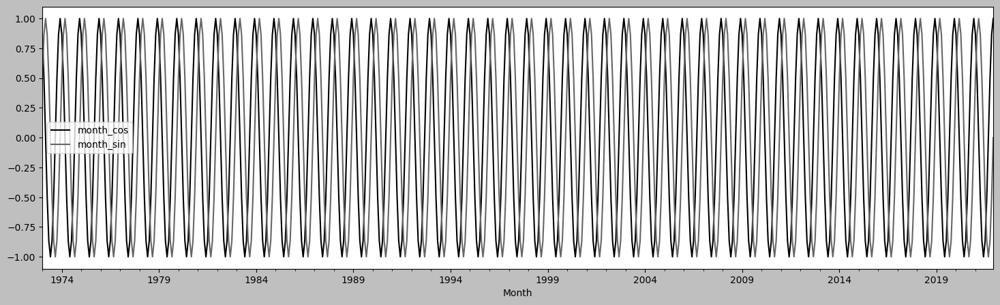

In [181]:
energy_ens[['month_cos', 'month_sin']].plot()

In [182]:
# y = econ_df['unemp']
# exog = econ_df.drop(columns=['unemp'])
y = energy_ens['y']
exog = energy_ens.drop(columns=['y'])

In [183]:
print(y.head())

Month
1973-01-01    1957.641
1973-02-01    1712.143
1973-03-01    1510.079
1973-04-01    1183.421
1973-05-01    1006.326
Freq: MS, Name: y, dtype: float64


In [184]:
print(exog.head())

            month  year  month_sin     month_cos  season  time  holiday
Month                                                                  
1973-01-01      1  1973   0.500000  8.660254e-01  Winter     1        1
1973-02-01      2  1973   0.866025  5.000000e-01  Winter     2        1
1973-03-01      3  1973   1.000000  6.123234e-17  Spring     3        0
1973-04-01      4  1973   0.866025 -5.000000e-01  Spring     4        0
1973-05-01      5  1973   0.500000 -8.660254e-01  Spring     5        1


In [185]:
train, test, exog_train, exog_test = temporal_train_test_split(
                                                        y=y, 
                                                        X=exog, 
                                                        test_size=30)

In [186]:
train.shape

(558,)

In [187]:
exog_train.shape

(558, 7)

In [188]:
# Define categorical and numerical features for exogenous data
exog_categorical_features = ['month', 'season']
exog_numerical_features = ['year', 'month_sin', 'month_cos', 'time', 'holiday']
    
# Create a transformer for exogenous data
exog_transformer = ColumnTransformer(
        transformers=[
            ('cat', OneHotEncoder(drop='first'), exog_categorical_features),
            ('num', StandardScaler(), exog_numerical_features)
        ],
        remainder='passthrough')

# Fit and transform exogenous data
exog_transformer.fit(exog_train)
exog_train_encoded = pd.DataFrame(exog_transformer.transform(exog_train),
                                  index=exog_train.index)
exog_test_encoded = pd.DataFrame(exog_transformer.transform(exog_test),
                                  index=exog_test.index)

In [189]:
regressors = {
    "Linear Regression": LinearRegression(),
    "Random Forest Regression": RandomForestRegressor(random_state=42),
    "Support Vector Regression (RBF)": SVR(),
    "K-Nearest Neighbor Regression": KNeighborsRegressor(),
    "Gradient Boosting Regression": GradientBoostingRegressor(random_state=42)}


In [190]:
energy_ens.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 588 entries, 1973-01-01 to 2021-12-01
Freq: MS
Data columns (total 8 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   y          588 non-null    float64
 1   month      588 non-null    int32  
 2   year       588 non-null    int32  
 3   month_sin  588 non-null    float64
 4   month_cos  588 non-null    float64
 5   season     588 non-null    object 
 6   time       588 non-null    int64  
 7   holiday    588 non-null    int64  
dtypes: float64(3), int32(2), int64(2), object(1)
memory usage: 52.9+ KB


In [191]:
def create_forecaster(reg, window_length=12, strategy='multioutput'):
    
    if isinstance(reg, (SVR, KNeighborsRegressor, GradientBoostingRegressor)):
        mo_reg = MultiOutputRegressor(reg)
        forecaster = make_reduction(estimator=mo_reg, 
                              window_length=window_length, 
                              strategy=strategy)
    else:
        # Linear, RandomForest support multioutput natively
        forecaster = make_reduction(estimator=reg, 
                              window_length=window_length, 
                              strategy=strategy)
    return forecaster
        

In [192]:
updated_regressors = []
for reg_name, regressor in regressors.items():
    reg = create_forecaster(regressor)
    updated_regressors.append((reg_name, reg))
    

In [193]:
updated_regressors

[('Linear Regression',
  MultioutputTabularRegressionForecaster(estimator=LinearRegression(),
                                         window_length=12)),
 ('Random Forest Regression',
  MultioutputTabularRegressionForecaster(estimator=RandomForestRegressor(random_state=42),
                                         window_length=12)),
 ('Support Vector Regression (RBF)',
  MultioutputTabularRegressionForecaster(estimator=MultiOutputRegressor(estimator=SVR()),
                                         window_length=12)),
 ('K-Nearest Neighbor Regression',
  MultioutputTabularRegressionForecaster(estimator=MultiOutputRegressor(estimator=KNeighborsRegressor()),
                                         window_length=12)),
 ('Gradient Boosting Regression',
  MultioutputTabularRegressionForecaster(estimator=MultiOutputRegressor(estimator=GradientBoostingRegressor(random_state=42)),
                                         window_length=12))]

In [194]:
# regressors = [
#     ("Linear Regression", make_reduction(LinearRegression(), strategy='direct')),
#     ("Random Forest Regression", make_reduction(RandomForestRegressor(), strategy='direct')),
#     ("Support Vector Regression (RBF)", make_reduction(SVR(), strategy='direct')),
#     ("K-Nearest Neighbor Regression", make_reduction(KNeighborsRegressor(), strategy='direct')),
#     ("Gradient Boosting Regression", make_reduction(GradientBoostingRegressor(), strategy='direct'))]

In [195]:
ensemble = EnsembleForecaster(updated_regressors, aggfunc='mean')
naive = NaiveForecaster()
rf = make_reduction(RandomForestRegressor(), strategy='recursive')

In [196]:
ensemble 

EnsembleForecaster(forecasters=[('Linear Regression',
                                 MultioutputTabularRegressionForecaster(estimator=LinearRegression(),
                                                                        window_length=12)),
                                ('Random Forest Regression',
                                 MultioutputTabularRegressionForecaster(estimator=RandomForestRegressor(random_state=42),
                                                                        window_length=12)),
                                ('Support Vector Regression (RBF)',
                                 MultioutputTabularRegressionForecaster(estimat...()),
                                                                        window_length=12)),
                                ('K-Nearest Neighbor Regression',
                                 MultioutputTabularRegressionForecaster(estimator=MultiOutputRegressor(estimator=KNeighborsRegressor()),
                                                                        window_length=12)),
                                ('Gradient Boosting Regression',
                                 MultioutputTabularRegressionForecaster(estimator=MultiOutputRegressor(estimator=GradientBoostingRegressor(random_state=42)),
                                                                        window_length=12))])

In [197]:
fh = ForecastingHorizon(test.index, is_relative=None)

In [198]:
train.shape

(558,)

In [199]:
%%time
ensemble.fit(y=train, X=exog_train_encoded, fh=fh)

CPU times: user 14.8 s, sys: 143 ms, total: 14.9 s
Wall time: 15 s


EnsembleForecaster(forecasters=[('Linear Regression',
                                 MultioutputTabularRegressionForecaster(estimator=LinearRegression(),
                                                                        window_length=12)),
                                ('Random Forest Regression',
                                 MultioutputTabularRegressionForecaster(estimator=RandomForestRegressor(random_state=42),
                                                                        window_length=12)),
                                ('Support Vector Regression (RBF)',
                                 MultioutputTabularRegressionForecaster(estimat...()),
                                                                        window_length=12)),
                                ('K-Nearest Neighbor Regression',
                                 MultioutputTabularRegressionForecaster(estimator=MultiOutputRegressor(estimator=KNeighborsRegressor()),
                                                                        window_length=12)),
                                ('Gradient Boosting Regression',
                                 MultioutputTabularRegressionForecaster(estimator=MultiOutputRegressor(estimator=GradientBoostingRegressor(random_state=42)),
                                                                        window_length=12))])

In [200]:
%%time
naive.fit(y=train, X=exog_train_encoded)
rf.fit(y=train, X=exog_train_encoded)

CPU times: user 790 ms, sys: 5.78 ms, total: 796 ms
Wall time: 821 ms


RecursiveTabularRegressionForecaster(estimator=RandomForestRegressor())

In [201]:
y_hat = pd.DataFrame(test)
y_hat['EnsembleForecaster'] = ensemble.predict(fh=fh, X=exog_test_encoded)
y_hat['NaiveForecaster'] = naive.predict(fh=fh, X=exog_test_encoded)
y_hat['RandomForest'] = rf.predict(fh=fh, X=exog_test_encoded)
print(y_hat.head())

                   y  EnsembleForecaster  NaiveForecaster  RandomForest
Month                                                                  
2019-07-01  1734.089         1666.746604         1434.287    1719.42633
2019-08-01  1677.960         1644.616569         1434.287    1712.40632
2019-09-01  1466.196         1457.223813         1434.287    1457.94170
2019-10-01  1374.674         1413.301493         1434.287    1365.55800
2019-11-01  1809.114         1624.772899         1434.287    1632.89759


In [202]:
print('NaiveForecaster', mase(test, y_hat['NaiveForecaster'], 
                              y_train=train))
print('EnsembleForecaster', mase(test, y_hat['EnsembleForecaster'], 
                                 y_train=train))
print('RandomForestRegression', mase(test, y_hat['RandomForest'], 
                                     y_train=train))

NaiveForecaster 1.3822824614250524
EnsembleForecaster 0.3295993672557957
RandomForestRegression 0.3371767098829842


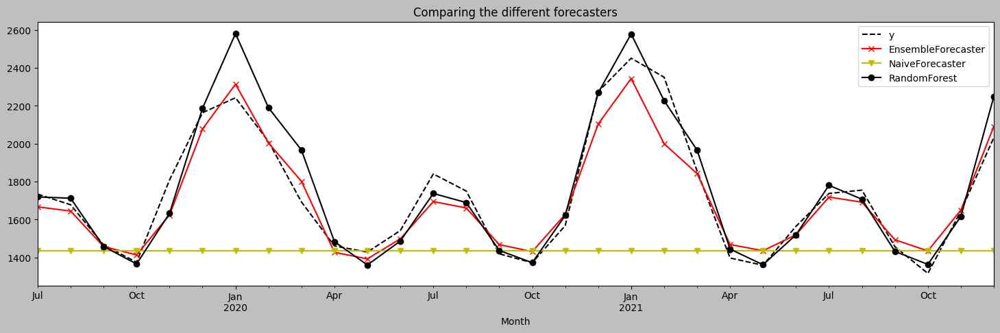

In [203]:
styles = ['k--','rx-','yv-', '-o']
for col, s in zip(y_hat, styles):
    y_hat[col].plot(style=s, label=col, 
                    title='Comparing the different forecasters')
plt.legend()
plt.show()
#plt.savefig('../../../Packt-Time-Series-Cookbook/Chapters/Ch12/images/fig_12.18.png', bbox_inches='tight', dpi=600)

## There is more

In [204]:
regressors

{'Linear Regression': LinearRegression(),
 'Random Forest Regression': RandomForestRegressor(random_state=42),
 'Support Vector Regression (RBF)': SVR(),
 'K-Nearest Neighbor Regression': KNeighborsRegressor(),
 'Gradient Boosting Regression': GradientBoostingRegressor(random_state=42)}

In [205]:
train

Month
1973-01-01    1957.641
1973-02-01    1712.143
1973-03-01    1510.079
1973-04-01    1183.421
1973-05-01    1006.326
                ...   
2019-02-01    2156.175
2019-03-01    2002.936
2019-04-01    1361.874
2019-05-01    1356.223
2019-06-01    1434.287
Freq: MS, Name: y, Length: 558, dtype: float64

In [206]:
%%time
from sktime.forecasting.compose import AutoEnsembleForecaster

auto = AutoEnsembleForecaster(forecasters=updated_regressors,
                              method='feature-importance')
auto.fit(y=train, X=exog_train_encoded, fh=fh)

CPU times: user 50.2 s, sys: 1.52 s, total: 51.7 s
Wall time: 50.1 s


AutoEnsembleForecaster(forecasters=[('Linear Regression',
                                     MultioutputTabularRegressionForecaster(estimator=LinearRegression(),
                                                                            window_length=12)),
                                    ('Random Forest Regression',
                                     MultioutputTabularRegressionForecaster(estimator=RandomForestRegressor(random_state=42),
                                                                            window_length=12)),
                                    ('Support Vector Regression (RBF)',
                                     MultioutputTabularRegressionForecaster(est...()),
                                                                            window_length=12)),
                                    ('K-Nearest Neighbor Regression',
                                     MultioutputTabularRegressionForecaster(estimator=MultiOutputRegressor(estimator=KNeighborsRegressor()),
                                                                            window_length=12)),
                                    ('Gradient Boosting Regression',
                                     MultioutputTabularRegressionForecaster(estimator=MultiOutputRegressor(estimator=GradientBoostingRegressor(random_state=42)),
                                                                            window_length=12))])

In [207]:
auto.weights_

[np.float64(0.19791109958550593),
 np.float64(0.380405348414319),
 np.float64(0.0726049413919022),
 np.float64(0.3149041860111037),
 np.float64(0.03417442459716923)]

In [208]:
updated_regressors

[('Linear Regression',
  MultioutputTabularRegressionForecaster(estimator=LinearRegression(),
                                         window_length=12)),
 ('Random Forest Regression',
  MultioutputTabularRegressionForecaster(estimator=RandomForestRegressor(random_state=42),
                                         window_length=12)),
 ('Support Vector Regression (RBF)',
  MultioutputTabularRegressionForecaster(estimator=MultiOutputRegressor(estimator=SVR()),
                                         window_length=12)),
 ('K-Nearest Neighbor Regression',
  MultioutputTabularRegressionForecaster(estimator=MultiOutputRegressor(estimator=KNeighborsRegressor()),
                                         window_length=12)),
 ('Gradient Boosting Regression',
  MultioutputTabularRegressionForecaster(estimator=MultiOutputRegressor(estimator=GradientBoostingRegressor(random_state=42)),
                                         window_length=12))]

In [210]:
for reg, w in zip(updated_regressors, auto.weights_):
    print(f'{reg[0]} weight = {w}')

Linear Regression weight = 0.19791109958550593
Random Forest Regression weight = 0.380405348414319
Support Vector Regression (RBF) weight = 0.0726049413919022
K-Nearest Neighbor Regression weight = 0.3149041860111037
Gradient Boosting Regression weight = 0.03417442459716923


In [211]:
y_hat['AutoEnsembleForecaster'] = auto.predict(fh=fh, X=exog_test_encoded)

In [212]:
fh

ForecastingHorizon(['2019-07-01', '2019-08-01', '2019-09-01', '2019-10-01',
               '2019-11-01', '2019-12-01', '2020-01-01', '2020-02-01',
               '2020-03-01', '2020-04-01', '2020-05-01', '2020-06-01',
               '2020-07-01', '2020-08-01', '2020-09-01', '2020-10-01',
               '2020-11-01', '2020-12-01', '2021-01-01', '2021-02-01',
               '2021-03-01', '2021-04-01', '2021-05-01', '2021-06-01',
               '2021-07-01', '2021-08-01', '2021-09-01', '2021-10-01',
               '2021-11-01', '2021-12-01'],
              dtype='datetime64[ns]', name='Month', freq='MS', is_relative=False)

In [213]:
cols = ['y', 'EnsembleForecaster', 'AutoEnsembleForecaster']
print(y_hat[cols].head())

                   y  EnsembleForecaster  AutoEnsembleForecaster
Month                                                           
2019-07-01  1734.089         1666.746604             1703.337876
2019-08-01  1677.960         1644.616569             1675.229811
2019-09-01  1466.196         1457.223813             1453.412571
2019-10-01  1374.674         1413.301493             1395.770161
2019-11-01  1809.114         1624.772899             1629.203249


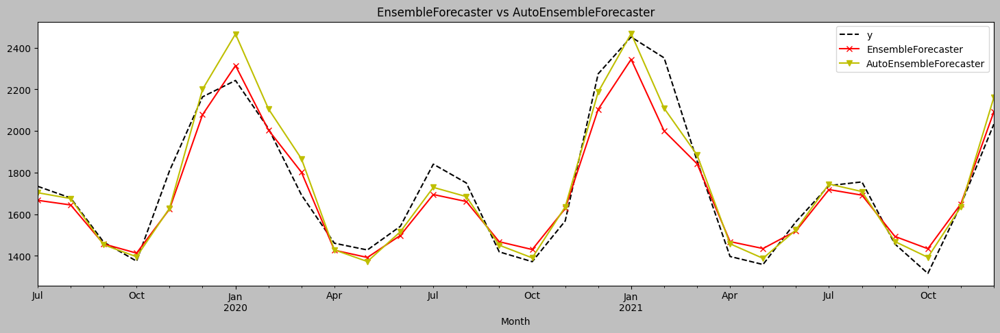

In [214]:
styles = ['k--','rx-','yv-']
forecasts = y_hat[cols]

for model_name, style in zip(forecasts, styles):
    forecasts[model_name].plot(style=style, label=model_name, 
                    title='EnsembleForecaster vs AutoEnsembleForecaster')
plt.legend()
plt.show()

In [215]:
print('AutoEnsembleForecaster', 
      mase(test, forecasts['AutoEnsembleForecaster'], y_train=train))
print('EnsembleForecaster', 
      mase(test, forecasts['EnsembleForecaster'], y_train=train))

AutoEnsembleForecaster 0.28724963496201755
EnsembleForecaster 0.3295993672557957


# Recipe 7: Forecasting with XGBoost

In [17]:
from sktime.forecasting.darts import DartsXGBModel
from sktime.forecasting.base import ForecastingHorizon
from sktime.split import temporal_train_test_split
from sktime.performance_metrics.forecasting import mean_absolute_scaled_error as mase



In [18]:
energy_ens = energy.copy()

In [19]:
# Split the data into train and test sets
y_train, y_test = temporal_train_test_split(energy_ens, test_size=30)
print(f"Training data: {y_train.shape[0]} observations")
print(f"Test data: {y_test.shape[0]} observations")


Training data: 558 observations
Test data: 30 observations


In [20]:
fh = ForecastingHorizon(y_test.index, is_relative=False)
xgb_model = DartsXGBModel(lags=12, output_chunk_length=len(y_test), multi_models=True)
xgb_model.fit(y_train, fh=fh)

DartsXGBModel(lags=12, output_chunk_length=30)

In [21]:
y_pred = xgb_model.predict(fh)

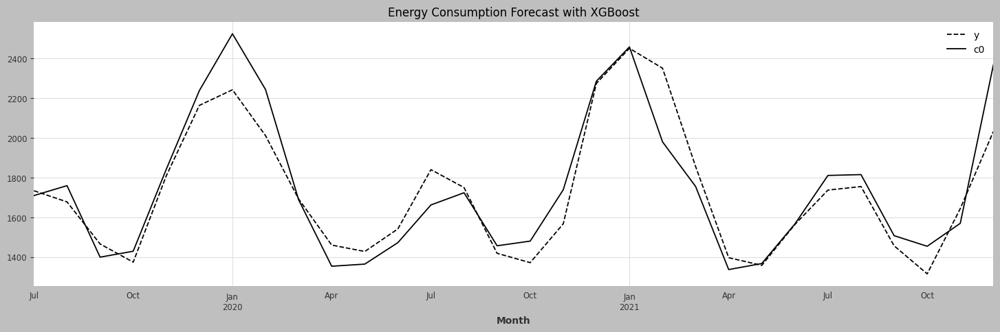

In [22]:
ax = y_test.plot(title='Energy Consumption Forecast with XGBoost', style='k--')
y_pred.plot(ax=ax, style='k-');

In [23]:
# Calculate MASE for XGBoost forecast
mase_score = mase(y_true=y_test, y_pred=y_pred, y_train=y_train)
print(f"MASE: {mase_score}")

MASE: 0.4244915760114761


## There is more

In [24]:
from darts.dataprocessing.transformers import Scaler

encoders = {
    'cyclic': {
        'past': ['month', 'quarter'],
        'future': ['month', 'quarter']
    },
    'datetime_attribute': {
        'past': ['month', 'quarter'],
        'future': ['month', 'quarter']
    },
    'position': {
        'past': ['relative'],
        'future': ['relative']
    },
    'transformer': Scaler(),
}


In [25]:
# Define the XGBoost model with time series features
xgb_model = DartsXGBModel(
    # Specify lagged values to use as features
    lags=12,  # Use the last 12 months as features
    # Enable past covariates by specifying lags
    lags_past_covariates=12,  # Use 12 lags of past covariates
    # Enable future covariates by specifying lags
    lags_future_covariates=[0],  # [0] means use current future values
    output_chunk_length=len(y_test),
    multi_models=False,
    
    # Add automatic encoders for time features
    add_encoders=encoders,
    
    # Enable probabilistic forecasting
    likelihood="quantile",
    quantiles=[0.1, 0.5, 0.9],
    
    # XGBoost parameters
    kwargs={
        'n_estimators': 100,
        'max_depth': 5,
        'learning_rate': 0.1,
        'subsample': 0.8
    }
)


In [26]:
# Create a forecasting horizon
fh = ForecastingHorizon(y_test.index, is_relative=False)
# Fit the model
xgb_model.fit(y=y_train, fh=fh)

DartsXGBModel(add_encoders={'cyclic': {'future': ['month', 'quarter'],
                                       'past': ['month', 'quarter']},
                            'datetime_attribute': {'future': ['month',
                                                              'quarter'],
                                                   'past': ['month',
                                                            'quarter']},
                            'position': {'future': ['relative'],
                                         'past': ['relative']},
                            'transformer': Scaler},
              kwargs={'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 100,
                      'subsample': 0.8},
              lags=12, lags_future_covariates=[0], lags_past_covariates=12,
              likelihood='quantile', multi_models=False, output_chunk_length=30,
              quantiles=[0.1, 0.5, 0.9])

In [27]:
print(xgb_model)

DartsXGBModel(add_encoders={'cyclic': {'future': ['month', 'quarter'],
                                       'past': ['month', 'quarter']},
                            'datetime_attribute': {'future': ['month',
                                                              'quarter'],
                                                   'past': ['month',
                                                            'quarter']},
                            'position': {'future': ['relative'],
                                         'past': ['relative']},
                            'transformer': Scaler},
              kwargs={'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 100,
                      'subsample': 0.8},
              lags=12, lags_future_covariates=[0], lags_past_covariates=12,
              likelihood='quantile', multi_models=False, output_chunk_length=30,
              quantiles=[0.1, 0.5, 0.9])


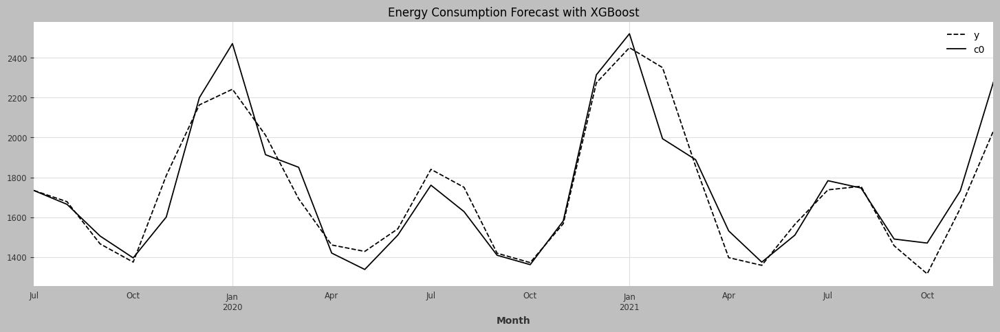

In [28]:
# Generate forecast
y_pred = xgb_model.predict(fh)

# plot the forecast
ax = y_test.plot(title='Energy Consumption Forecast with XGBoost', style='k--')
y_pred.plot(ax=ax, style='k-');

In [29]:
# Calculate forecast error using MASE
from sktime.performance_metrics.forecasting import mean_absolute_scaled_error

# Calculate MASE for XGBoost forecast
mase_score = mean_absolute_scaled_error(
    y_true=y_test,
    y_pred=y_pred,
    y_train=y_train
)
print(f"MASE: {mase_score:.4}")

MASE: 0.3622


In [30]:
xgb_model.get_param_defaults()

{'past_covariates': None,
 'num_samples': 1000,
 'lags': None,
 'lags_past_covariates': None,
 'lags_future_covariates': None,
 'output_chunk_length': 1,
 'add_encoders': None,
 'likelihood': None,
 'quantiles': None,
 'random_state': None,
 'multi_models': True,
 'use_static_covariates': True,
 'kwargs': None}

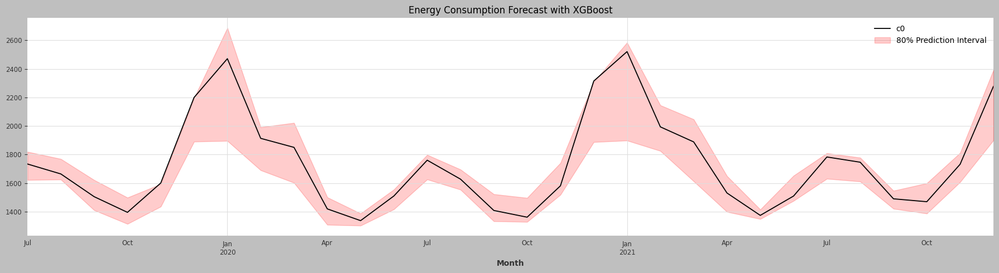

In [31]:
# Generate prediction intervals
pred_intervals = xgb_model.predict_interval(fh, coverage=0.8)

# Plot the results
y_pred.plot()

# Plot prediction intervals
lower = pred_intervals.iloc[:, 0]
upper = pred_intervals.iloc[:, 1]
plt.fill_between(pred_intervals.index, 
                 lower, 
                 upper, 
                 color='red', 
                 alpha=0.2, 
                 label='80% Prediction Interval')

plt.title('Energy Consumption Forecast with XGBoost')
plt.legend()
plt.tight_layout()
plt.show()

